# ECCO Analysis

In [1]:
import xarray as xr
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import glob
import scipy.stats
import sys
sys.path.append('/Users/joegradone/SynologyDrive/Drive/Rutgers/Research/code/GitHub/ECCOv4-py')
import ecco_v4_py as ecco
import datetime
import geopandas
from cartopy.mpl.geoaxes import GeoAxes
import cartopy
from sklearn.metrics import mean_squared_error
import cmocean.cm as cmo
import gsw
import geopy.distance
import cartopy.crs as ccrs
import cartopy.feature as cfeature
from dask.diagnostics import ProgressBar


## Load in situ data for comparisons

## EN4 Profiles

In [2]:
EN4_fnames = glob.glob('/Users/joegradone/SynologyDrive/Drive/Rutgers/Research/data/EN4/Monthly_Means/*.nc')
en4 = xr.open_mfdataset(EN4_fnames,combine='nested', concat_dim='time')
## This is to dask plays nicely
en4 = en4.load()
en4 = en4.sortby('time')
## Add density
en4['potential_density'] = gsw.sigma0(en4.absolute_salinity, en4.conservative_temperature)+1000
## Only argo era
en4 = en4.where(((en4.time.dt.year>=1993)&(en4.time.dt.year<=2016)),drop=True)
en4

<xarray.Dataset>
Dimensions:                   (time: 253, depth: 55, latitude: 28, longitude: 58)
Coordinates:
  * longitude                 (longitude) float64 -88.25 -87.75 ... -59.75
  * latitude                  (latitude) float64 8.75 9.25 9.75 ... 21.75 22.25
  * depth                     (depth) int64 0 5 10 15 20 ... 1500 1550 1800 2050
  * time                      (time) datetime64[ns] 1993-02-01 ... 2016-12-01
Data variables:
    spatial_ref               (time) float64 0.0 0.0 0.0 0.0 ... 0.0 0.0 0.0 0.0
    conservative_temperature  (depth, latitude, longitude, time) float64 nan ...
    absolute_salinity         (depth, latitude, longitude, time) float64 nan ...
    num_profs                 (latitude, longitude, time) float64 nan ... nan
    potential_density         (depth, latitude, longitude, time) float64 nan ...

## Load ECCO Data

In [19]:
## Load grid
ecco_grid = xr.open_dataset('/Users/joegradone/SynologyDrive/Drive/Rutgers/Research/data/ECCO/ECCO_L4_GEOMETRY_LLC0090GRID_V4R4/GRID_GEOMETRY_ECCO_V4r4_native_llc0090.nc')
#ecco_grid = ecco_grid.isel(tile=[10,11])

fnames = glob.glob('/Users/joegradone/SynologyDrive/Drive/Rutgers/Research/data/ECCO/Evaluated_Budgets/eccov4r4_budget_heat_salt_1993_2016/*.nc')
ds = xr.open_mfdataset(fnames, parallel=True, data_vars='minimal', coords='minimal', compat='override')
ds

<xarray.Dataset>
Dimensions:         (i: 90, j: 90, tile: 13, k: 50, time: 288, i_g: 90,
                     j_g: 90, k_l: 50)
Coordinates:
  * i               (i) int32 0 1 2 3 4 5 6 7 8 9 ... 81 82 83 84 85 86 87 88 89
  * j               (j) int32 0 1 2 3 4 5 6 7 8 9 ... 81 82 83 84 85 86 87 88 89
  * tile            (tile) int32 0 1 2 3 4 5 6 7 8 9 10 11 12
  * k               (k) int32 0 1 2 3 4 5 6 7 8 9 ... 41 42 43 44 45 46 47 48 49
  * time            (time) datetime64[ns] 1993-01-16T12:00:00 ... 2016-12-16T...
  * i_g             (i_g) int32 0 1 2 3 4 5 6 7 8 ... 81 82 83 84 85 86 87 88 89
  * j_g             (j_g) int32 0 1 2 3 4 5 6 7 8 ... 81 82 83 84 85 86 87 88 89
  * k_l             (k_l) int32 0 1 2 3 4 5 6 7 8 ... 41 42 43 44 45 46 47 48 49
Data variables: (12/30)
    G_total_TH      (time, k, tile, j, i) float32 dask.array<chunksize=(12, 50, 13, 90, 90), meta=np.ndarray>
    adv_hConvH      (time, k, tile, j, i) float32 dask.array<chunksize=(12, 50, 13, 90, 90), meta=np.ndarray>
    adv_vConvH      (time, tile, k, j, i) float32 dask.array<chunksize=(12, 13, 50, 90, 90), meta=np.ndarray>
    dif_hConvH      (time, k, tile, j, i) float32 dask.array<chunksize=(12, 50, 13, 90, 90), meta=np.ndarray>
    dif_vConvH      (time, tile, k, j, i) float32 dask.array<chunksize=(12, 13, 50, 90, 90), meta=np.ndarray>
    G_forcing_TH    (time, tile, k, j, i) float64 dask.array<chunksize=(12, 13, 50, 90, 90), meta=np.ndarray>
    ...              ...
    uvel            (time, k, tile, j, i_g) float32 dask.array<chunksize=(12, 50, 13, 90, 90), meta=np.ndarray>
    vvel            (time, k, tile, j_g, i) float32 dask.array<chunksize=(12, 50, 13, 90, 90), meta=np.ndarray>
    wvel            (time, k_l, tile, j, i) float32 dask.array<chunksize=(12, 50, 13, 90, 90), meta=np.ndarray>
    mld             (time, tile, j, i) float32 dask.array<chunksize=(12, 13, 90, 90), meta=np.ndarray>
    Qnet            (time, tile, k, j, i) float64 dask.array<chunksize=(12, 13, 50, 90, 90), meta=np.ndarray>
    SWpen           (time, tile, k, j, i) float64 dask.array<chunksize=(12, 13, 50, 90, 90), meta=np.ndarray>

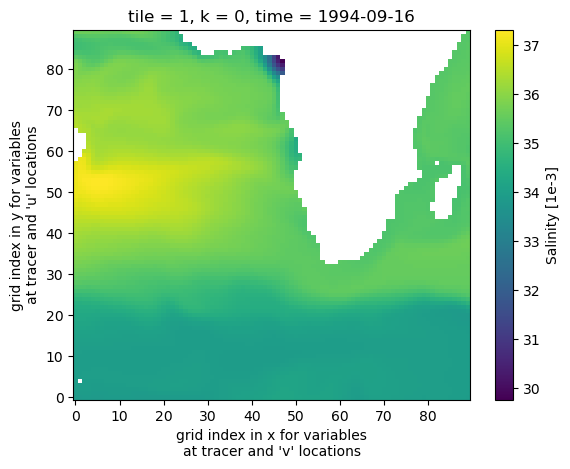

In [20]:
ds.salt.isel(tile=1,time=20,k=0).plot()

## Interpolate onto a 1 deg by 1 deg grid
This takes ~2.5 hours

In [21]:
new_grid_delta_lat = 1
new_grid_delta_lon = 1

new_grid_min_lat = -10
new_grid_max_lat = 35

new_grid_min_lon = -100
new_grid_max_lon = -37


lon_shape = len(np.arange(new_grid_min_lon,new_grid_max_lon,new_grid_delta_lon))
lat_shape = len(np.arange(new_grid_min_lat,new_grid_max_lat,new_grid_delta_lat))

depth_len = 29 # 37 is 2084 m (Yucatan sill depth is 2040), 29 for 1000 m, 23 for 500 m

G_total_TH_interp = np.empty([lat_shape,lon_shape,depth_len,len(ds.time)])
G_total_TH_interp[:] = np.nan
adv_hConvH_interp = np.empty([lat_shape,lon_shape,depth_len,len(ds.time)])
adv_hConvH_interp[:] = np.nan
adv_vConvH_interp = np.empty([lat_shape,lon_shape,depth_len,len(ds.time)])
adv_vConvH_interp[:] = np.nan
dif_hConvH_interp = np.empty([lat_shape,lon_shape,depth_len,len(ds.time)])
dif_hConvH_interp[:] = np.nan
dif_vConvH_interp = np.empty([lat_shape,lon_shape,depth_len,len(ds.time)])
dif_vConvH_interp[:] = np.nan
G_forcing_TH_interp = np.empty([lat_shape,lon_shape,depth_len,len(ds.time)])
G_forcing_TH_interp[:] = np.nan
G_total_Slt_interp = np.empty([lat_shape,lon_shape,depth_len,len(ds.time)])
G_total_Slt_interp[:] = np.nan
adv_hConvS_interp = np.empty([lat_shape,lon_shape,depth_len,len(ds.time)])
adv_hConvS_interp[:] = np.nan
adv_vConvS_interp = np.empty([lat_shape,lon_shape,depth_len,len(ds.time)])
adv_vConvS_interp[:] = np.nan
dif_hConvS_interp = np.empty([lat_shape,lon_shape,depth_len,len(ds.time)])
dif_hConvS_interp[:] = np.nan
dif_vConvS_interp = np.empty([lat_shape,lon_shape,depth_len,len(ds.time)])
dif_vConvS_interp[:] = np.nan
G_forcing_Slt_interp = np.empty([lat_shape,lon_shape,depth_len,len(ds.time)])
G_forcing_Slt_interp[:] = np.nan
G_total_Sln_interp = np.empty([lat_shape,lon_shape,depth_len,len(ds.time)])
G_total_Sln_interp[:] = np.nan
adv_hConvSln_interp = np.empty([lat_shape,lon_shape,depth_len,len(ds.time)])
adv_hConvSln_interp[:] = np.nan
adv_vConvSln_interp = np.empty([lat_shape,lon_shape,depth_len,len(ds.time)])
adv_vConvSln_interp[:] = np.nan
dif_hConvSln_interp = np.empty([lat_shape,lon_shape,depth_len,len(ds.time)])
dif_hConvSln_interp[:] = np.nan
dif_vConvSln_interp = np.empty([lat_shape,lon_shape,depth_len,len(ds.time)])
dif_vConvSln_interp[:] = np.nan
G_forcing_Sln_interp = np.empty([lat_shape,lon_shape,depth_len,len(ds.time)])
G_forcing_Sln_interp[:] = np.nan
G_total_Fw_interp = np.empty([lat_shape,lon_shape,depth_len,len(ds.time)])
G_total_Fw_interp[:] = np.nan
G_advection_Fw_interp = np.empty([lat_shape,lon_shape,depth_len,len(ds.time)])
G_advection_Fw_interp[:] = np.nan
G_diffusion_Fw_interp = np.empty([lat_shape,lon_shape,depth_len,len(ds.time)])
G_diffusion_Fw_interp[:] = np.nan
G_forcing_Fw_interp = np.empty([lat_shape,lon_shape,depth_len,len(ds.time)])
G_forcing_Fw_interp[:] = np.nan
salt_interp = np.empty([lat_shape,lon_shape,depth_len,len(ds.time)])
salt_interp[:] = np.nan
temp_interp = np.empty([lat_shape,lon_shape,depth_len,len(ds.time)])
temp_interp[:] = np.nan
Qnet_interp = np.empty([lat_shape,lon_shape,depth_len,len(ds.time)])
Qnet_interp[:] = np.nan
SWpen_interp = np.empty([lat_shape,lon_shape,depth_len,len(ds.time)])
SWpen_interp[:] = np.nan
UVEL_interp = np.empty([lat_shape,lon_shape,depth_len,len(ds.time)])
UVEL_interp[:] = np.nan
VVEL_interp = np.empty([lat_shape,lon_shape,depth_len,len(ds.time)])
VVEL_interp[:] = np.nan
WVEL_interp = np.empty([lat_shape,lon_shape,depth_len,len(ds.time)])
WVEL_interp[:] = np.nan
MXLDEPTH_interp = np.empty([lat_shape,lon_shape,len(ds.time)])
MXLDEPTH_interp[:] = np.nan


for k in np.arange(0,depth_len):
    for t in np.arange(0,len(ds.time)):
        new_grid_lon, new_grid_lat, _, _, G_total_TH_interp[:,:,k,t] = ecco.resample_to_latlon(ecco_grid.XC.values,
                                     ecco_grid.YC.values,
                                     ds.G_total_TH.isel(time=t,k=k).values,
                                     new_grid_min_lat, new_grid_max_lat, new_grid_delta_lat,
                                     new_grid_min_lon, new_grid_max_lon, new_grid_delta_lon,
                                     fill_value = np.NaN,
                                     mapping_method = 'nearest_neighbor',
                                     radius_of_influence = 120000)
        
        _, _, _, _, adv_hConvH_interp[:,:,k,t] = ecco.resample_to_latlon(ecco_grid.XC.values,
                                     ecco_grid.YC.values,
                                     ds.adv_hConvH.isel(time=t,k=k).values,
                                     new_grid_min_lat, new_grid_max_lat, new_grid_delta_lat,
                                     new_grid_min_lon, new_grid_max_lon, new_grid_delta_lon,
                                     fill_value = np.NaN,
                                     mapping_method = 'nearest_neighbor',
                                     radius_of_influence = 120000)
        
        _, _, _, _, adv_vConvH_interp[:,:,k,t] = ecco.resample_to_latlon(ecco_grid.XC.values,
                                     ecco_grid.YC.values,
                                     ds.adv_vConvH.isel(time=t,k=k).values,
                                     new_grid_min_lat, new_grid_max_lat, new_grid_delta_lat,
                                     new_grid_min_lon, new_grid_max_lon, new_grid_delta_lon,
                                     fill_value = np.NaN,
                                     mapping_method = 'nearest_neighbor',
                                     radius_of_influence = 120000)        

        _, _, _, _, dif_hConvH_interp[:,:,k,t] = ecco.resample_to_latlon(ecco_grid.XC.values,
                                     ecco_grid.YC.values,
                                     ds.dif_hConvH.isel(time=t,k=k).values,
                                     new_grid_min_lat, new_grid_max_lat, new_grid_delta_lat,
                                     new_grid_min_lon, new_grid_max_lon, new_grid_delta_lon,
                                     fill_value = np.NaN,
                                     mapping_method = 'nearest_neighbor',
                                     radius_of_influence = 120000)
        
        _, _, _, _, dif_vConvH_interp[:,:,k,t] = ecco.resample_to_latlon(ecco_grid.XC.values,
                                     ecco_grid.YC.values,
                                     ds.dif_vConvH.isel(time=t,k=k).values,
                                     new_grid_min_lat, new_grid_max_lat, new_grid_delta_lat,
                                     new_grid_min_lon, new_grid_max_lon, new_grid_delta_lon,
                                     fill_value = np.NaN,
                                     mapping_method = 'nearest_neighbor',
                                     radius_of_influence = 120000)
        
        _, _, _, _, Qnet_interp[:,:,k,t] = ecco.resample_to_latlon(ecco_grid.XC.values,
                                     ecco_grid.YC.values,
                                     ds.Qnet.isel(time=t,k=k).values,
                                     new_grid_min_lat, new_grid_max_lat, new_grid_delta_lat,
                                     new_grid_min_lon, new_grid_max_lon, new_grid_delta_lon,
                                     fill_value = np.NaN,
                                     mapping_method = 'nearest_neighbor',
                                     radius_of_influence = 120000)

        _, _, _, _, SWpen_interp[:,:,k,t] = ecco.resample_to_latlon(ecco_grid.XC.values,
                                     ecco_grid.YC.values,
                                     ds.SWpen.isel(time=t,k=k).values,
                                     new_grid_min_lat, new_grid_max_lat, new_grid_delta_lat,
                                     new_grid_min_lon, new_grid_max_lon, new_grid_delta_lon,
                                     fill_value = np.NaN,
                                     mapping_method = 'nearest_neighbor',
                                     radius_of_influence = 120000)

        _, _, _, _, G_forcing_TH_interp[:,:,k,t] = ecco.resample_to_latlon(ecco_grid.XC.values,
                                     ecco_grid.YC.values,
                                     ds.G_forcing_TH.isel(time=t,k=k).values,
                                     new_grid_min_lat, new_grid_max_lat, new_grid_delta_lat,
                                     new_grid_min_lon, new_grid_max_lon, new_grid_delta_lon,
                                     fill_value = np.NaN,
                                     mapping_method = 'nearest_neighbor',
                                     radius_of_influence = 120000)
        
        _, _, _, _, G_total_Slt_interp[:,:,k,t] = ecco.resample_to_latlon(ecco_grid.XC.values,
                                     ecco_grid.YC.values,
                                     ds.G_total_Slt.isel(time=t,k=k).values,
                                     new_grid_min_lat, new_grid_max_lat, new_grid_delta_lat,
                                     new_grid_min_lon, new_grid_max_lon, new_grid_delta_lon,
                                     fill_value = np.NaN,
                                     mapping_method = 'nearest_neighbor',
                                     radius_of_influence = 120000)

        _, _, _, _, adv_hConvS_interp[:,:,k,t] = ecco.resample_to_latlon(ecco_grid.XC.values,
                                     ecco_grid.YC.values,
                                     ds.adv_hConvS.isel(time=t,k=k).values,
                                     new_grid_min_lat, new_grid_max_lat, new_grid_delta_lat,
                                     new_grid_min_lon, new_grid_max_lon, new_grid_delta_lon,
                                     fill_value = np.NaN,
                                     mapping_method = 'nearest_neighbor',
                                     radius_of_influence = 120000)  
        
        _, _, _, _, adv_vConvS_interp[:,:,k,t] = ecco.resample_to_latlon(ecco_grid.XC.values,
                                     ecco_grid.YC.values,
                                     ds.adv_vConvS.isel(time=t,k=k).values,
                                     new_grid_min_lat, new_grid_max_lat, new_grid_delta_lat,
                                     new_grid_min_lon, new_grid_max_lon, new_grid_delta_lon,
                                     fill_value = np.NaN,
                                     mapping_method = 'nearest_neighbor',
                                     radius_of_influence = 120000)
        
        _, _, _, _, dif_hConvS_interp[:,:,k,t] = ecco.resample_to_latlon(ecco_grid.XC.values,
                                     ecco_grid.YC.values,
                                     ds.dif_hConvS.isel(time=t,k=k).values,
                                     new_grid_min_lat, new_grid_max_lat, new_grid_delta_lat,
                                     new_grid_min_lon, new_grid_max_lon, new_grid_delta_lon,
                                     fill_value = np.NaN,
                                     mapping_method = 'nearest_neighbor',
                                     radius_of_influence = 120000)

        _, _, _, _, dif_vConvS_interp[:,:,k,t] = ecco.resample_to_latlon(ecco_grid.XC.values,
                                     ecco_grid.YC.values,
                                     ds.dif_vConvS.isel(time=t,k=k).values,
                                     new_grid_min_lat, new_grid_max_lat, new_grid_delta_lat,
                                     new_grid_min_lon, new_grid_max_lon, new_grid_delta_lon,
                                     fill_value = np.NaN,
                                     mapping_method = 'nearest_neighbor',
                                     radius_of_influence = 120000)
        
        _, _, _, _, G_forcing_Slt_interp[:,:,k,t] = ecco.resample_to_latlon(ecco_grid.XC.values,
                                     ecco_grid.YC.values,
                                     ds.G_forcing_Slt.isel(time=t,k=k).values,
                                     new_grid_min_lat, new_grid_max_lat, new_grid_delta_lat,
                                     new_grid_min_lon, new_grid_max_lon, new_grid_delta_lon,
                                     fill_value = np.NaN,
                                     mapping_method = 'nearest_neighbor',
                                     radius_of_influence = 120000)

        _, _, _, _, G_total_Sln_interp[:,:,k,t] = ecco.resample_to_latlon(ecco_grid.XC.values,
                                     ecco_grid.YC.values,
                                     ds.G_total_Sln.isel(time=t,k=k).values,
                                     new_grid_min_lat, new_grid_max_lat, new_grid_delta_lat,
                                     new_grid_min_lon, new_grid_max_lon, new_grid_delta_lon,
                                     fill_value = np.NaN,
                                     mapping_method = 'nearest_neighbor',
                                     radius_of_influence = 120000)

        _, _, _, _, adv_hConvSln_interp[:,:,k,t] = ecco.resample_to_latlon(ecco_grid.XC.values,
                                     ecco_grid.YC.values,
                                     ds.adv_hConvSln.isel(time=t,k=k).values,
                                     new_grid_min_lat, new_grid_max_lat, new_grid_delta_lat,
                                     new_grid_min_lon, new_grid_max_lon, new_grid_delta_lon,
                                     fill_value = np.NaN,
                                     mapping_method = 'nearest_neighbor',
                                     radius_of_influence = 120000)  
        
        _, _, _, _, adv_vConvSln_interp[:,:,k,t] = ecco.resample_to_latlon(ecco_grid.XC.values,
                                     ecco_grid.YC.values,
                                     ds.adv_vConvSln.isel(time=t,k=k).values,
                                     new_grid_min_lat, new_grid_max_lat, new_grid_delta_lat,
                                     new_grid_min_lon, new_grid_max_lon, new_grid_delta_lon,
                                     fill_value = np.NaN,
                                     mapping_method = 'nearest_neighbor',
                                     radius_of_influence = 120000)

        _, _, _, _, dif_hConvSln_interp[:,:,k,t] = ecco.resample_to_latlon(ecco_grid.XC.values,
                                     ecco_grid.YC.values,
                                     ds.dif_hConvSln.isel(time=t,k=k).values,
                                     new_grid_min_lat, new_grid_max_lat, new_grid_delta_lat,
                                     new_grid_min_lon, new_grid_max_lon, new_grid_delta_lon,
                                     fill_value = np.NaN,
                                     mapping_method = 'nearest_neighbor',
                                     radius_of_influence = 120000)

        _, _, _, _, dif_vConvSln_interp[:,:,k,t] = ecco.resample_to_latlon(ecco_grid.XC.values,
                                     ecco_grid.YC.values,
                                     ds.dif_vConvSln.isel(time=t,k=k).values,
                                     new_grid_min_lat, new_grid_max_lat, new_grid_delta_lat,
                                     new_grid_min_lon, new_grid_max_lon, new_grid_delta_lon,
                                     fill_value = np.NaN,
                                     mapping_method = 'nearest_neighbor',
                                     radius_of_influence = 120000)
        
        _, _, _, _, G_forcing_Sln_interp[:,:,k,t] = ecco.resample_to_latlon(ecco_grid.XC.values,
                                     ecco_grid.YC.values,
                                     ds.G_forcing_Sln.isel(time=t,k=k).values,
                                     new_grid_min_lat, new_grid_max_lat, new_grid_delta_lat,
                                     new_grid_min_lon, new_grid_max_lon, new_grid_delta_lon,
                                     fill_value = np.NaN,
                                     mapping_method = 'nearest_neighbor',
                                     radius_of_influence = 120000)
        
        _, _, _, _, G_total_Fw_interp[:,:,k,t] = ecco.resample_to_latlon(ecco_grid.XC.values,
                                     ecco_grid.YC.values,
                                     ds.G_total_Fw.isel(time=t,k=k).values,
                                     new_grid_min_lat, new_grid_max_lat, new_grid_delta_lat,
                                     new_grid_min_lon, new_grid_max_lon, new_grid_delta_lon,
                                     fill_value = np.NaN,
                                     mapping_method = 'nearest_neighbor',
                                     radius_of_influence = 120000)
        
        _, _, _, _, G_advection_Fw_interp[:,:,k,t] = ecco.resample_to_latlon(ecco_grid.XC.values,
                                     ecco_grid.YC.values,
                                     ds.G_advection_Fw.isel(time=t,k=k).values,
                                     new_grid_min_lat, new_grid_max_lat, new_grid_delta_lat,
                                     new_grid_min_lon, new_grid_max_lon, new_grid_delta_lon,
                                     fill_value = np.NaN,
                                     mapping_method = 'nearest_neighbor',
                                     radius_of_influence = 120000)  
        
        _, _, _, _, G_diffusion_Fw_interp[:,:,k,t] = ecco.resample_to_latlon(ecco_grid.XC.values,
                                     ecco_grid.YC.values,
                                     ds.G_diffusion_Fw.isel(time=t,k=k).values,
                                     new_grid_min_lat, new_grid_max_lat, new_grid_delta_lat,
                                     new_grid_min_lon, new_grid_max_lon, new_grid_delta_lon,
                                     fill_value = np.NaN,
                                     mapping_method = 'nearest_neighbor',
                                     radius_of_influence = 120000)  
        
        _, _, _, _, G_forcing_Fw_interp[:,:,k,t] = ecco.resample_to_latlon(ecco_grid.XC.values,
                                     ecco_grid.YC.values,
                                     ds.G_forcing_Fw.isel(time=t,k=k).values,
                                     new_grid_min_lat, new_grid_max_lat, new_grid_delta_lat,
                                     new_grid_min_lon, new_grid_max_lon, new_grid_delta_lon,
                                     fill_value = np.NaN,
                                     mapping_method = 'nearest_neighbor',
                                     radius_of_influence = 120000)  

        _, _, _, _, salt_interp[:,:,k,t] = ecco.resample_to_latlon(ecco_grid.XC.values,
                                     ecco_grid.YC.values,
                                     ds.salt.isel(time=t,k=k).values,
                                     new_grid_min_lat, new_grid_max_lat, new_grid_delta_lat,
                                     new_grid_min_lon, new_grid_max_lon, new_grid_delta_lon,
                                     fill_value = np.NaN,
                                     mapping_method = 'nearest_neighbor',
                                     radius_of_influence = 120000)

        _, _, _, _, temp_interp[:,:,k,t] = ecco.resample_to_latlon(ecco_grid.XC.values,
                                     ecco_grid.YC.values,
                                     ds.temp.isel(time=t,k=k).values,
                                     new_grid_min_lat, new_grid_max_lat, new_grid_delta_lat,
                                     new_grid_min_lon, new_grid_max_lon, new_grid_delta_lon,
                                     fill_value = np.NaN,
                                     mapping_method = 'nearest_neighbor',
                                     radius_of_influence = 120000)

        _, _, _, _, UVEL_interp[:,:,k,t] = ecco.resample_to_latlon(ecco_grid.XC.values,
                                     ecco_grid.YC.values,
                                     ds.uvel.isel(time=t,k=k).values,
                                     new_grid_min_lat, new_grid_max_lat, new_grid_delta_lat,
                                     new_grid_min_lon, new_grid_max_lon, new_grid_delta_lon,
                                     fill_value = np.NaN,
                                     mapping_method = 'nearest_neighbor',
                                     radius_of_influence = 120000)
        
        _, _, _, _, VVEL_interp[:,:,k,t] = ecco.resample_to_latlon(ecco_grid.XC.values,
                                     ecco_grid.YC.values,
                                     ds.vvel.isel(time=t,k=k).values,
                                     new_grid_min_lat, new_grid_max_lat, new_grid_delta_lat,
                                     new_grid_min_lon, new_grid_max_lon, new_grid_delta_lon,
                                     fill_value = np.NaN,
                                     mapping_method = 'nearest_neighbor',
                                     radius_of_influence = 120000)

        _, _, _, _, WVEL_interp[:,:,k,t] = ecco.resample_to_latlon(ecco_grid.XC.values,
                                     ecco_grid.YC.values,
                                     ds.wvel.isel(time=t,k_l=k).values,
                                     new_grid_min_lat, new_grid_max_lat, new_grid_delta_lat,
                                     new_grid_min_lon, new_grid_max_lon, new_grid_delta_lon,
                                     fill_value = np.NaN,
                                     mapping_method = 'nearest_neighbor',
                                     radius_of_influence = 120000)
        
        _, _, _, _, MXLDEPTH_interp[:,:,t] = ecco.resample_to_latlon(ecco_grid.XC.values,
                                 ecco_grid.YC.values,
                                 ds.mld.isel(time=t).values,
                                 new_grid_min_lat, new_grid_max_lat, new_grid_delta_lat,
                                 new_grid_min_lon, new_grid_max_lon, new_grid_delta_lon,
                                 fill_value = np.NaN,
                                 mapping_method = 'nearest_neighbor',
                                 radius_of_influence = 120000)

    print('k',k)
    print(datetime.datetime.now())


k 0
2024-07-06 10:07:09.818766
k 1
2024-07-06 10:12:18.274877
k 2
2024-07-06 10:17:23.093964
k 3
2024-07-06 10:22:25.301740
k 4
2024-07-06 10:27:24.900780
k 5
2024-07-06 10:32:32.757865
k 6
2024-07-06 10:37:35.860300
k 7
2024-07-06 10:42:39.707468
k 8
2024-07-06 10:47:42.394367
k 9
2024-07-06 10:52:43.222579
k 10
2024-07-06 10:57:45.083554
k 11
2024-07-06 11:02:45.757437
k 12
2024-07-06 11:07:47.092910
k 13
2024-07-06 11:12:48.783173
k 14
2024-07-06 11:17:51.065044
k 15
2024-07-06 11:22:54.932546
k 16
2024-07-06 11:27:58.985227
k 17
2024-07-06 11:33:02.630543
k 18
2024-07-06 11:38:03.843406
k 19
2024-07-06 11:43:03.741933
k 20
2024-07-06 11:48:08.576799
k 21
2024-07-06 11:53:10.886288
k 22
2024-07-06 11:58:14.109873
k 23
2024-07-06 12:03:21.460130
k 24
2024-07-06 12:08:28.641215
k 25
2024-07-06 12:13:17.733464
k 26
2024-07-06 12:18:00.643978
k 27
2024-07-06 12:22:45.359147
k 28
2024-07-06 12:27:29.359699


## Created xarray dataset and save

In [23]:
interp_ds = xr.Dataset(
    data_vars=dict(
        temp_tendency=(["lat", "lon", "depth", "time"], G_total_TH_interp),
        temp_advection_h=(["lat", "lon", "depth", "time"], adv_hConvH_interp),
        temp_advection_v=(["lat", "lon", "depth", "time"], adv_vConvH_interp),
        temp_diffusion_h=(["lat", "lon", "depth", "time"], dif_hConvH_interp),
        temp_diffusion_v=(["lat", "lon", "depth", "time"], dif_vConvH_interp),
        temp_forcing=(["lat", "lon", "depth", "time"], G_forcing_TH_interp),
        temp=(["lat", "lon", "depth", "time"], temp_interp),
        salt_tendency=(["lat", "lon", "depth", "time"], G_total_Slt_interp),
        salt_advection_h=(["lat", "lon", "depth", "time"], adv_hConvS_interp),
        salt_advection_v=(["lat", "lon", "depth", "time"], adv_vConvS_interp),
        salt_diffusion_h=(["lat", "lon", "depth", "time"], dif_hConvS_interp),
        salt_diffusion_v=(["lat", "lon", "depth", "time"], dif_vConvS_interp),
        salt_forcing=(["lat", "lon", "depth", "time"], G_forcing_Slt_interp),
        salinity_tendency=(["lat", "lon", "depth", "time"], G_total_Sln_interp),
        salinity_advection_h=(["lat", "lon", "depth", "time"], adv_hConvSln_interp),
        salinity_advection_v=(["lat", "lon", "depth", "time"], adv_vConvSln_interp),
        salinity_diffusion_h=(["lat", "lon", "depth", "time"], dif_hConvSln_interp),
        salinity_diffusion_v=(["lat", "lon", "depth", "time"], dif_vConvSln_interp),
        salinity_forcing=(["lat", "lon", "depth", "time"], G_forcing_Sln_interp),
        fw_tendency=(["lat", "lon", "depth", "time"], G_total_Fw_interp),
        fw_advection=(["lat", "lon", "depth", "time"], G_advection_Fw_interp),
        fw_diffusion=(["lat", "lon", "depth", "time"], G_diffusion_Fw_interp),
        fw_forcing=(["lat", "lon", "depth", "time"], G_forcing_Fw_interp),      
        salt=(["lat", "lon", "depth", "time"], salt_interp),
        SWpen=(["lat", "lon", "depth", "time"], SWpen_interp),
        Qnet=(["lat", "lon", "depth", "time"], Qnet_interp),
        uvel=(["lat", "lon", "depth", "time"], UVEL_interp),
        vvel=(["lat", "lon", "depth", "time"], VVEL_interp),
        wvel=(["lat", "lon", "depth", "time"], WVEL_interp),
        mld=(["lat", "lon", "time"], MXLDEPTH_interp),
    ),
    coords=dict(
        lon=new_grid_lon[0,:],
        lat=new_grid_lat[:,0],
        time=ds.time.values,
        depth=ecco_grid.Z[0:depth_len].values
    ),
)

interp_ds


<xarray.Dataset>
Dimensions:               (lat: 45, lon: 63, depth: 29, time: 288)
Coordinates:
  * lon                   (lon) float64 -99.5 -98.5 -97.5 ... -39.5 -38.5 -37.5
  * lat                   (lat) float64 -9.5 -8.5 -7.5 -6.5 ... 32.5 33.5 34.5
  * time                  (time) datetime64[ns] 1993-01-16T12:00:00 ... 2016-...
  * depth                 (depth) float32 -5.0 -15.0 -25.0 ... -909.7 -1.007e+03
Data variables: (12/30)
    temp_tendency         (lat, lon, depth, time) float64 5.567e-07 ... 3.494...
    temp_advection_h      (lat, lon, depth, time) float64 1.121e-07 ... 9.618...
    temp_advection_v      (lat, lon, depth, time) float64 6.104e-08 ... 3.929...
    temp_diffusion_h      (lat, lon, depth, time) float64 -4.634e-09 ... -5.9...
    temp_diffusion_v      (lat, lon, depth, time) float64 -2.961e-07 ... -6.0...
    temp_forcing          (lat, lon, depth, time) float64 6.844e-07 ... 0.0
    ...                    ...
    SWpen                 (lat, lon, depth, time) float64 0.0 0.0 ... 0.0 0.0
    Qnet                  (lat, lon, depth, time) float64 6.844e-07 ... 0.0
    uvel                  (lat, lon, depth, time) float64 0.03842 ... -0.00735
    vvel                  (lat, lon, depth, time) float64 -0.04612 ... -0.000...
    wvel                  (lat, lon, depth, time) float64 3.675e-08 ... -1.02...
    mld                   (lat, lon, time) float64 39.43 26.0 ... 66.67 97.24

In [24]:
del G_total_TH_interp, adv_hConvH_interp, adv_vConvH_interp,dif_hConvH_interp,dif_vConvH_interp
del G_forcing_TH_interp, G_total_Slt_interp,adv_hConvS_interp,adv_vConvS_interp,dif_hConvS_interp,dif_vConvS_interp
del G_forcing_Slt_interp,salt_interp,temp_interp,Qnet_interp,SWpen_interp
del ds, ecco_grid

In [29]:
pressure = gsw.p_from_z(interp_ds.depth,interp_ds.lat)
interp_ds['absolute_salinity'] = gsw.SA_from_SP(interp_ds.salt, pressure, interp_ds.lon, interp_ds.lat)    
interp_ds['conservative_temperature'] = gsw.CT_from_pt(interp_ds.absolute_salinity, interp_ds.temp)
interp_ds['potential_density'] = gsw.sigma0(interp_ds.absolute_salinity, interp_ds.conservative_temperature)+1000
interp_ds

<xarray.Dataset>
Dimensions:                   (lat: 45, lon: 63, depth: 29, time: 288)
Coordinates:
  * lon                       (lon) float64 -99.5 -98.5 -97.5 ... -38.5 -37.5
  * lat                       (lat) float64 -9.5 -8.5 -7.5 ... 32.5 33.5 34.5
  * time                      (time) datetime64[ns] 1993-01-16T12:00:00 ... 2...
  * depth                     (depth) float32 -5.0 -15.0 ... -909.7 -1.007e+03
Data variables: (12/33)
    temp_tendency             (lat, lon, depth, time) float64 5.567e-07 ... 3...
    temp_advection_h          (lat, lon, depth, time) float64 1.121e-07 ... 9...
    temp_advection_v          (lat, lon, depth, time) float64 6.104e-08 ... 3...
    temp_diffusion_h          (lat, lon, depth, time) float64 -4.634e-09 ... ...
    temp_diffusion_v          (lat, lon, depth, time) float64 -2.961e-07 ... ...
    temp_forcing              (lat, lon, depth, time) float64 6.844e-07 ... 0.0
    ...                        ...
    vvel                      (lat, lon, depth, time) float64 -0.04612 ... -0...
    wvel                      (lat, lon, depth, time) float64 3.675e-08 ... -...
    mld                       (lat, lon, time) float64 39.43 26.0 ... 97.24
    absolute_salinity         (lat, lon, depth, time) float64 35.56 ... 35.53
    conservative_temperature  (lat, lon, depth, time) float64 24.41 ... 7.771
    potential_density         (lat, lon, depth, time) float64 1.024e+03 ... 1...

In [30]:
interp_ds.nbytes

6068082644

## Save
# ADD THE PROGRESS BAR TO THIS

In [31]:
with ProgressBar():
    interp_ds.to_netcdf('/Users/joegradone/SynologyDrive/Drive/Rutgers/Research/data/ECCO/Evaluated_Budgets/ECCO_1993_2016_Interpolated_Fields.nc')

## Load

In [32]:
ds = xr.open_dataset('/Users/joegradone/SynologyDrive/Drive/Rutgers/Research/data/ECCO/Evaluated_Budgets/ECCO_1993_2016_Interpolated_Fields.nc')
ds

<xarray.Dataset>
Dimensions:                   (lat: 45, lon: 63, depth: 29, time: 288)
Coordinates:
  * lon                       (lon) float64 -99.5 -98.5 -97.5 ... -38.5 -37.5
  * lat                       (lat) float64 -9.5 -8.5 -7.5 ... 32.5 33.5 34.5
  * time                      (time) datetime64[ns] 1993-01-16T12:00:00 ... 2...
  * depth                     (depth) float32 -5.0 -15.0 ... -909.7 -1.007e+03
Data variables: (12/33)
    temp_tendency             (lat, lon, depth, time) float64 ...
    temp_advection_h          (lat, lon, depth, time) float64 ...
    temp_advection_v          (lat, lon, depth, time) float64 ...
    temp_diffusion_h          (lat, lon, depth, time) float64 ...
    temp_diffusion_v          (lat, lon, depth, time) float64 ...
    temp_forcing              (lat, lon, depth, time) float64 ...
    ...                        ...
    vvel                      (lat, lon, depth, time) float64 ...
    wvel                      (lat, lon, depth, time) float64 ...
    mld                       (lat, lon, time) float64 ...
    absolute_salinity         (lat, lon, depth, time) float64 ...
    conservative_temperature  (lat, lon, depth, time) float64 ...
    potential_density         (lat, lon, depth, time) float64 ...

# CHECK TEMP, SAL, DEN FOR NANs

In [33]:
## Load Atlantic shapefile for more precise clipping
fname ='/Users/joegradone/SynologyDrive/Drive/Rutgers/Research/data/atl/iho.shp'
atl = geopandas.read_file(fname)
## Load Caribbean shapefile for more precise clipping
fname ='/Users/joegradone/SynologyDrive/Drive/Rutgers/Research/data/carib/new.shp'
carib = geopandas.read_file(fname)
## Load western Caribbean shapefile for more precise clipping
fname ='/Users/joegradone/SynologyDrive/Drive/Rutgers/Research/data/northwest_carib/northwest.shp'
nwcarib = geopandas.read_file(fname)
## Load southeastern Caribbean shapefile for more precise clipping
fname ='/Users/joegradone/SynologyDrive/Drive/Rutgers/Research/data/eastern_carib/eastern.shp'
ecarib = geopandas.read_file(fname)
## Load central Caribbean shapefile for more precise clipping
fname ='/Users/joegradone/SynologyDrive/Drive/Rutgers/Research/data/central_carib/central.shp'
central_carib = geopandas.read_file(fname)


## ECCO
## Need to do this to play nice with geopandas/rio
ds = ds.rename({'lon': 'x','lat': 'y'})
## Clip to Atlantic shapefile
ds = ds.rio.write_crs('WGS84', inplace=True)
ds = ds.rio.clip(atl.geometry.values, atl.crs)

## Clip to Carib
carib_ds = ds.rio.clip(carib.geometry.values, carib.crs)
west_carib_ds = ds.rio.clip(nwcarib.geometry.values, nwcarib.crs)
east_carib_ds = ds.rio.clip(ecarib.geometry.values, ecarib.crs)
central_carib_ds = ds.rio.clip(central_carib.geometry.values, central_carib.crs)



## Do this for plotting significant points
lonmesh, latmesh = np.meshgrid(ds.x,ds.y)
lonmesh_carib, latmesh_carib = np.meshgrid(carib_ds.x,carib_ds.y)
#lonmesh_argo_carib, latmesh_argo_carib = np.meshgrid(argo_carib.x,argo_carib.y)

## Replace inf values with nan because blowingup the spatial means
east_carib_ds = east_carib_ds.map(lambda x: x.where(np.isfinite(x), np.nan))
central_carib_ds = central_carib_ds.map(lambda x: x.where(np.isfinite(x), np.nan))
west_carib_ds = west_carib_ds.map(lambda x: x.where(np.isfinite(x), np.nan))


In [34]:
## Set colors for regions
# ec_col = 'tab:blue' # eastern carib
# cc_col = 'tab:green' # central carib
# wc_col = 'tab:orange' # western carib

ec_col = '#2ca1db' # eastern carib
cc_col = '#f44323' # central carib
wc_col = '#112047' # western carib


## Same for in situ

In [35]:
### ARGO
# ## Need to do this to play nice with geopandas/rio
# argo = argo.rename({'LONGITUDE': 'x','LATITUDE': 'y'})
# ## Clip to Atlantic shapefile
# argo = argo.rio.write_crs('WGS84', inplace=True)
# argo_carib = argo.rio.clip(carib.geometry.values, carib.crs)

### EN4
en4 = en4.rename({'longitude': 'x','latitude': 'y'})
en4 = en4.rio.write_crs('WGS84', inplace=True)
en4_carib = en4.rio.clip(carib.geometry.values, carib.crs)
west_carib_en4 = en4.rio.clip(nwcarib.geometry.values, nwcarib.crs)
east_carib_en4 = en4.rio.clip(ecarib.geometry.values, ecarib.crs)
central_carib_en4 = en4.rio.clip(central_carib.geometry.values, central_carib.crs)

# lon_threshold = -70
# east_carib_en4 = se_carib_en4.where(se_carib_en4.x>=lon_threshold,drop=True)
# central_carib_en4 = se_carib_en4.where(se_carib_en4.x<lon_threshold,drop=True)

/Users/joegradone/anaconda3/envs/rutgers-phd/lib/python3.11/site-packages/cartopy/mpl/gridliner.py:451: UserWarning: The .xlabels_top attribute is deprecated. Please use .top_labels to toggle visibility instead.
  warnings.warn('The .xlabels_top attribute is deprecated. Please '
/Users/joegradone/anaconda3/envs/rutgers-phd/lib/python3.11/site-packages/cartopy/mpl/gridliner.py:487: UserWarning: The .ylabels_right attribute is deprecated. Please use .right_labels to toggle visibility instead.
  warnings.warn('The .ylabels_right attribute is deprecated. Please '


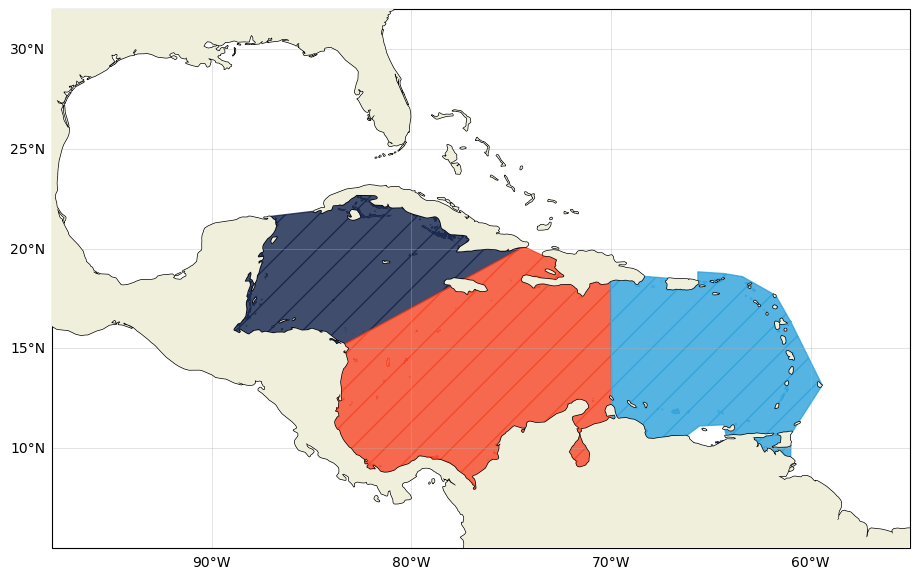

In [36]:
fig, ax = plt.subplots(figsize=(14,7),subplot_kw=dict(projection=cartopy.crs.PlateCarree()))

ax.coastlines(linewidth=1.0,zorder=10)
ax.add_feature(cartopy.feature.LAND,zorder=10)
glb = ax.gridlines(draw_labels=True, alpha=0.5, linewidth=.5 )
glb.xlabels_top = glb.ylabels_right = False

ax.add_geometries(nwcarib.geometry, crs=ccrs.PlateCarree(),facecolor=wc_col, edgecolor=wc_col,hatch='/',alpha=0.8)
ax.add_geometries(central_carib.geometry, crs=ccrs.PlateCarree(),facecolor=cc_col, edgecolor=cc_col,hatch='/',alpha=0.8)
ax.add_geometries(ecarib.geometry, crs=ccrs.PlateCarree(),facecolor=ec_col, edgecolor=ec_col,hatch='/',alpha=0.8)

ax.set_ylim(5,32)
ax.set_xlim(-98,-55)

plt.savefig('/Users/joegradone/SynologyDrive/Drive/Rutgers/Research/figures/Python/Model/ECCO/Map_w_regions.png', bbox_inches='tight',dpi=300,facecolor='white')


## Compare Argo Climatology vs ECCO

In [37]:
# argo_carib.absolute_salinity.isel(depth=15).plot()

## Divide into East and West datasets

In [38]:
# lon_threshold = -83
# lat_threshold = 14

# #### ECCO
# # subset: ecco
# east_ds = carib_ds.where(carib_ds.x>=lon_threshold,drop=True)
# west_ds = carib_ds.where((carib_ds.x<=lon_threshold)&(carib_ds.y>=lat_threshold),drop=True)
# # Pull put means: ecco
# west_ecco_mean_profile = west_ds.mean(dim=['x','y']).mean(dim='time')
# east_ecco_mean_profile = east_ds.mean(dim=['x','y']).mean(dim='time')
# # Pull out std: ecco
# west_ecco_mean_profile_std = west_ds.mean(dim=['x','y']).std(dim='time')
# east_ecco_mean_profile_std = east_ds.mean(dim=['x','y']).std(dim='time')


# #### ARGO
# # subset: argo
# argo_east = argo_carib.where(argo_carib.x>=lon_threshold,drop=True)
# argo_west = argo_carib.where(argo_carib.x<=lon_threshold,drop=True)
# # Pull put means: argo
# argo_east_mean_profile = argo_east.mean(dim=['x','y'])
# argo_west_mean_profile = argo_west.mean(dim=['x','y'])


In [39]:
# plt.figure(figsize=(8,10))

# ## Plot argo
# plt.plot(argo_west_mean_profile.absolute_salinity,argo_west_mean_profile.depth,color='tab:blue',label='Argo Western Caribbean',linewidth=4)
# plt.plot(argo_east_mean_profile.absolute_salinity,argo_west_mean_profile.depth,color='tab:orange',label='Argo Eastern Caribbean',linewidth=4)

# ## Plot ecco
# plt.plot(west_ecco_mean_profile.absolute_salinity,west_ecco_mean_profile.depth,'--',color='tab:blue',label='ECCO Western Caribbean',linewidth=2)
# plt.fill_betweenx(west_ecco_mean_profile.depth,west_ecco_mean_profile.absolute_salinity+west_ecco_mean_profile_std.absolute_salinity,west_ecco_mean_profile.absolute_salinity-west_ecco_mean_profile_std.absolute_salinity,alpha=0.2,color='tab:blue')
# plt.plot(east_ecco_mean_profile.absolute_salinity,west_ecco_mean_profile.depth,'--',color='tab:orange',label='ECCO Eastern Caribbean',linewidth=2)
# plt.fill_betweenx(east_ecco_mean_profile.depth,east_ecco_mean_profile.absolute_salinity+east_ecco_mean_profile_std.absolute_salinity,east_ecco_mean_profile.absolute_salinity-east_ecco_mean_profile_std.absolute_salinity,alpha=0.2,color='tab:orange')

# plt.xlim(35.25,37)
# plt.ylim(-500,0)
# plt.grid()
# plt.legend()

In [40]:
# plt.figure(figsize=(8,10))

# ## Plot argo
# # plt.plot(argo_west_mean_profile.conservative_temperature,argo_west_mean_profile.depth,color='tab:blue',label='Argo Western Caribbean',linewidth=4)
# # plt.plot(argo_east_mean_profile.conservative_temperature,argo_west_mean_profile.depth,color='tab:orange',label='Argo Eastern Caribbean',linewidth=4)

# ## Plot ecco
# plt.plot(west_ecco_mean_profile.conservative_temperature,west_ecco_mean_profile.depth,'--',color='tab:blue',label='ECCO Western Caribbean',linewidth=2)
# plt.fill_betweenx(west_ecco_mean_profile.depth,west_ecco_mean_profile.conservative_temperature+west_ecco_mean_profile_std.conservative_temperature,west_ecco_mean_profile.conservative_temperature-west_ecco_mean_profile_std.conservative_temperature,alpha=0.2,color='tab:blue')
# plt.plot(east_ecco_mean_profile.conservative_temperature,east_ecco_mean_profile.depth,'--',color='tab:orange',label='ECCO Eastern Caribbean',linewidth=2)
# plt.fill_betweenx(east_ecco_mean_profile.depth,east_ecco_mean_profile.conservative_temperature+east_ecco_mean_profile_std.conservative_temperature,east_ecco_mean_profile.conservative_temperature-east_ecco_mean_profile_std.conservative_temperature,alpha=0.2,color='tab:orange')


# plt.xlim(10,30)
# plt.ylim(-500,0)
# plt.grid()
# plt.legend()

#### It is clear Argo is not the product to use for comparison after this plot, I do not think many floats make it to the western Caribbean so the Yucatan straits are anomalously fresh. EN4 profiles contain cruise station data in this region so much more reliable.

argo_west.absolute_salinity.isel(depth=15).plot()

## Compare EN4 Profiles vs ECCO

In [41]:
#### ECCO
# Pull put means: ecco
east_ecco_mean_profile = east_carib_ds.mean(dim='time',skipna=True).mean(dim=['x','y'],skipna=True)
central_ecco_mean_profile = central_carib_ds.mean(dim='time',skipna=True).mean(dim=['x','y'],skipna=True)
west_ecco_mean_profile = west_carib_ds.mean(dim='time',skipna=True).mean(dim=['x','y'],skipna=True)
# Pull out std: ecco
east_ecco_mean_profile_std = east_carib_ds.std(dim='time',skipna=True).mean(dim=['x','y'],skipna=True)
central_ecco_mean_profile_std = central_carib_ds.std(dim='time',skipna=True).mean(dim=['x','y'],skipna=True)
west_ecco_mean_profile_std = west_carib_ds.std(dim='time',skipna=True).mean(dim=['x','y'],skipna=True)

#### EN4
# Pull put means: en4
east_en4_mean_profile = east_carib_en4.mean(dim=['y','x','time'],skipna=True)
central_en4_mean_profile = central_carib_en4.mean(dim=['y','x','time'],skipna=True)
west_en4_mean_profile = west_carib_en4.mean(dim=['y','x','time'],skipna=True)
# Pull out std: en4
east_en4_mean_profile_std = east_carib_en4.mean(dim=['x','y'],skipna=True).std(dim='time',skipna=True)
central_en4_mean_profile_std = central_carib_en4.mean(dim=['x','y'],skipna=True).std(dim='time',skipna=True)
west_en4_mean_profile_std = west_carib_en4.mean(dim=['x','y'],skipna=True).std(dim='time',skipna=True)


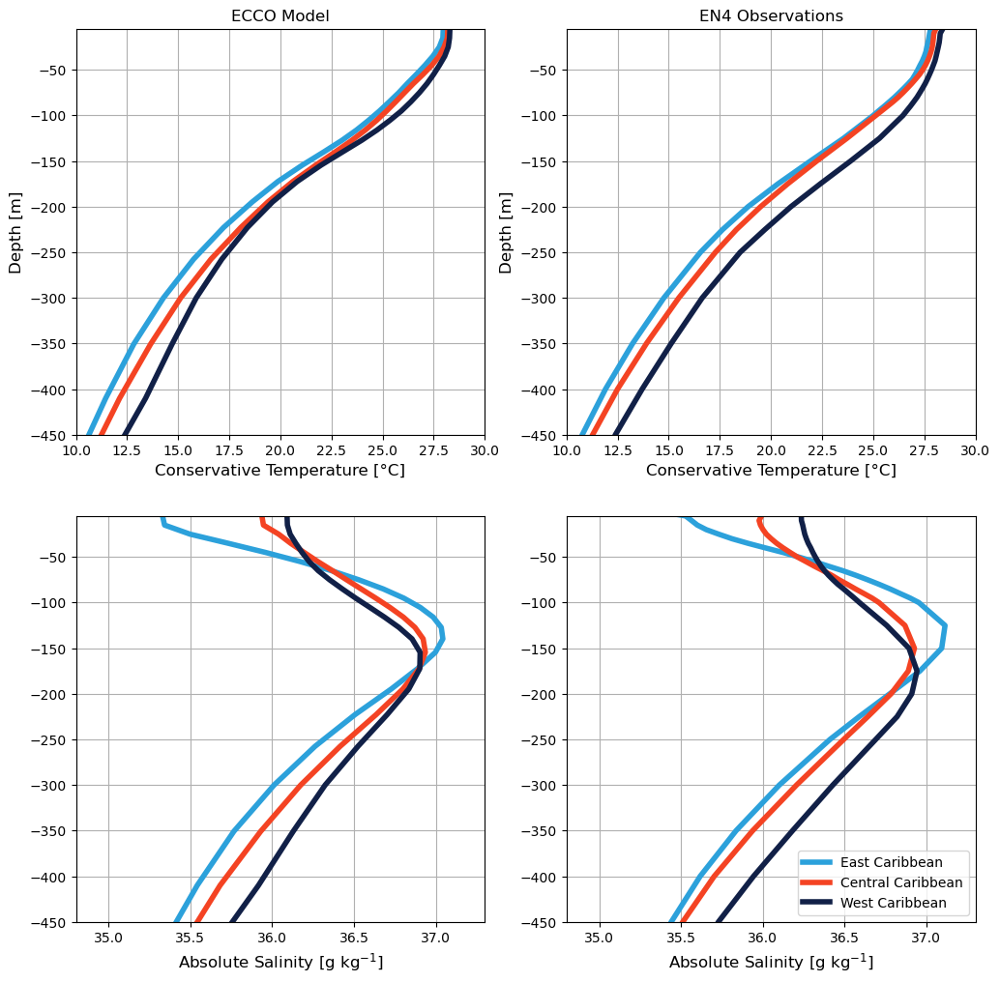

In [42]:
font_size =12
lwd = 4

fig,ax = plt.subplots(2,2,figsize=(12,12))

ax[0,0].plot(east_ecco_mean_profile.conservative_temperature,east_ecco_mean_profile.depth,color=ec_col,linewidth=lwd)
ax[0,0].plot(central_ecco_mean_profile.conservative_temperature,central_ecco_mean_profile.depth,color=cc_col,linewidth=lwd)
ax[0,0].plot(west_ecco_mean_profile.conservative_temperature,west_ecco_mean_profile.depth,color=wc_col,linewidth=lwd)
ax[0,0].set_ylim(-450,-5)
ax[0,0].set_xlim(10,30)
ax[0,0].grid()
ax[0,0].set_ylabel('Depth [m]',fontsize = font_size)
ax[0,0].set_title('ECCO Model', fontsize = font_size)
ax[0,0].set_xlabel('Conservative Temperature [°C]',fontsize = font_size)



ax[0,1].plot(east_en4_mean_profile.conservative_temperature,-east_en4_mean_profile.depth,color=ec_col,linewidth=lwd)
ax[0,1].plot(central_en4_mean_profile.conservative_temperature,-central_en4_mean_profile.depth,color=cc_col,linewidth=lwd)
ax[0,1].plot(west_en4_mean_profile.conservative_temperature,-west_en4_mean_profile.depth,color=wc_col,linewidth=lwd)
ax[0,1].set_ylim(-450,-5)
ax[0,1].set_xlim(10,30)
ax[0,1].grid()
ax[0,1].set_ylabel('Depth [m]',fontsize = font_size)
ax[0,1].set_title('EN4 Observations', fontsize = font_size)
ax[0,1].set_xlabel('Conservative Temperature [°C]',fontsize = font_size)




ax[1,0].plot(east_ecco_mean_profile.absolute_salinity,east_ecco_mean_profile.depth,color=ec_col,linewidth=lwd)
ax[1,0].plot(central_ecco_mean_profile.absolute_salinity,central_ecco_mean_profile.depth,color=cc_col,linewidth=lwd)
ax[1,0].plot(west_ecco_mean_profile.absolute_salinity,west_ecco_mean_profile.depth,color=wc_col,linewidth=lwd)
ax[1,0].set_ylim(-450,-5)
ax[1,0].set_xlim(34.8,37.3)
ax[1,0].grid()
ax[1,0].set_xlabel('Absolute Salinity [g kg$^{-1}$]',fontsize = font_size)



ax[1,1].plot(east_en4_mean_profile.absolute_salinity,-east_en4_mean_profile.depth,color=ec_col,linewidth=lwd,label='East Caribbean')
ax[1,1].plot(central_en4_mean_profile.absolute_salinity,-central_en4_mean_profile.depth,color=cc_col,linewidth=lwd,label='Central Caribbean')
ax[1,1].plot(west_en4_mean_profile.absolute_salinity,-west_en4_mean_profile.depth,color=wc_col,linewidth=lwd,label='West Caribbean')
ax[1,1].set_ylim(-450,-5)
ax[1,1].set_xlim(34.8,37.3)
ax[1,1].grid()
ax[1,1].legend()
ax[1,1].set_xlabel('Absolute Salinity [g kg$^{-1}$]',fontsize = font_size)

plt.savefig('/Users/joegradone/SynologyDrive/Drive/Rutgers/Research/figures/Python/Model/ECCO/ECCO_EN4_Temp_Sal_Profile_Comps_Regions.png', bbox_inches='tight',dpi=300,facecolor='white')


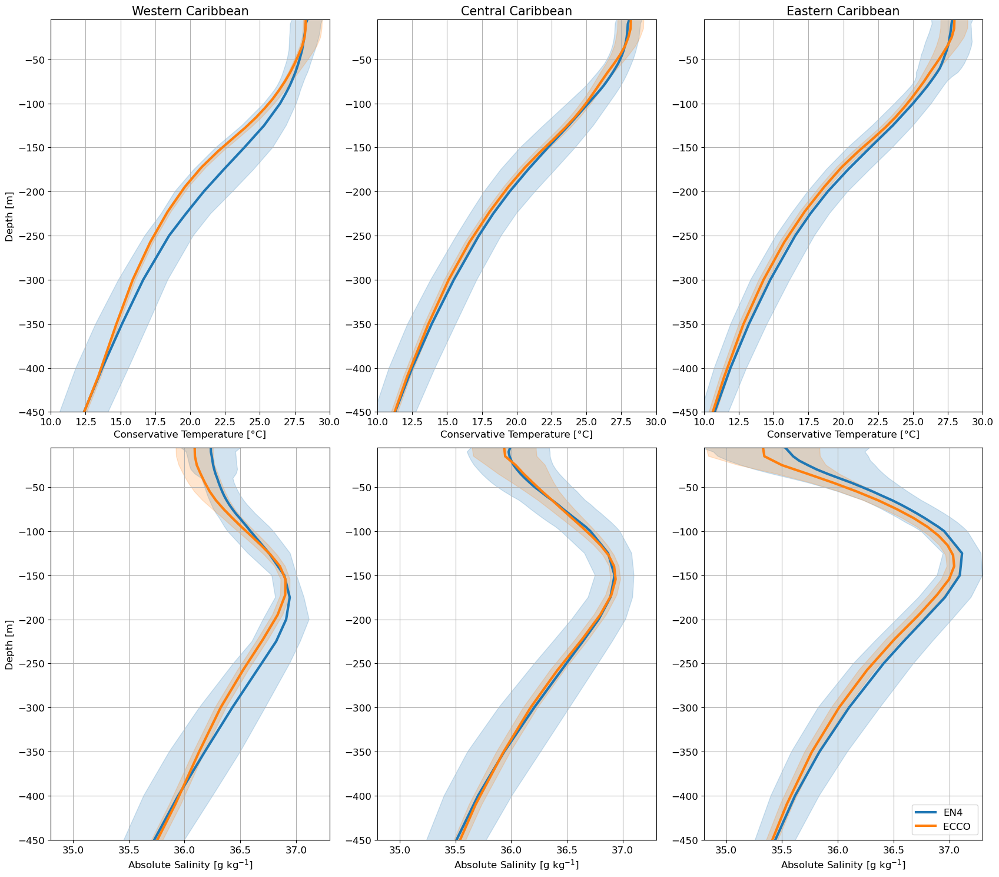

In [43]:
font_size=12
lwd=3

fig,ax = plt.subplots(2,3,figsize=(17,15))

####################### Temperature
## Plot west
ax[0,0].plot(west_en4_mean_profile.conservative_temperature,-west_en4_mean_profile.depth,color='tab:blue',linewidth=lwd)
ax[0,0].fill_betweenx(-west_en4_mean_profile.depth,west_en4_mean_profile.conservative_temperature+west_en4_mean_profile_std.conservative_temperature,west_en4_mean_profile.conservative_temperature-west_en4_mean_profile_std.conservative_temperature,alpha=0.2,color='tab:blue')
ax[0,0].plot(west_ecco_mean_profile.conservative_temperature,west_ecco_mean_profile.depth,color='tab:orange',linewidth=lwd)
ax[0,0].fill_betweenx(west_ecco_mean_profile.depth,west_ecco_mean_profile.conservative_temperature+west_ecco_mean_profile_std.conservative_temperature,west_ecco_mean_profile.conservative_temperature-west_ecco_mean_profile_std.absolute_salinity,alpha=0.2,color='tab:orange')
ax[0,0].set_xlim(10,30)
ax[0,0].set_ylim(-450,-5)
ax[0,0].grid()
ax[0,0].set_ylabel('Depth [m]',fontsize = font_size)
ax[0,0].set_xlabel('Conservative Temperature [°C]',fontsize = font_size)
ax[0,0].set_title('Western Caribbean', fontsize=font_size+3)

## Plot central
ax[0,1].plot(central_en4_mean_profile.conservative_temperature,-central_en4_mean_profile.depth,color='tab:blue',linewidth=lwd)
ax[0,1].fill_betweenx(-central_en4_mean_profile.depth,central_en4_mean_profile.conservative_temperature+central_en4_mean_profile_std.conservative_temperature,central_en4_mean_profile.conservative_temperature-central_en4_mean_profile_std.conservative_temperature,alpha=0.2,color='tab:blue')
ax[0,1].plot(central_ecco_mean_profile.conservative_temperature,central_ecco_mean_profile.depth,color='tab:orange',linewidth=lwd)
ax[0,1].fill_betweenx(central_ecco_mean_profile.depth,central_ecco_mean_profile.conservative_temperature+central_ecco_mean_profile_std.conservative_temperature,central_ecco_mean_profile.conservative_temperature-central_ecco_mean_profile_std.conservative_temperature,alpha=0.2,color='tab:orange')
ax[0,1].set_xlim(10,30)
ax[0,1].set_ylim(-450,-5)
ax[0,1].grid()
ax[0,1].set_xlabel('Conservative Temperature [°C]',fontsize = font_size)
ax[0,1].set_title('Central Caribbean', fontsize=font_size+3)

## Plot east
ax[0,2].plot(east_en4_mean_profile.conservative_temperature,-west_en4_mean_profile.depth,color='tab:blue',linewidth=lwd)
ax[0,2].fill_betweenx(-east_en4_mean_profile.depth,east_en4_mean_profile.conservative_temperature+east_en4_mean_profile_std.conservative_temperature,east_en4_mean_profile.conservative_temperature-east_en4_mean_profile_std.conservative_temperature,alpha=0.2,color='tab:blue')
ax[0,2].plot(east_ecco_mean_profile.conservative_temperature,west_ecco_mean_profile.depth,color='tab:orange',linewidth=lwd)
ax[0,2].fill_betweenx(east_ecco_mean_profile.depth,east_ecco_mean_profile.conservative_temperature+east_ecco_mean_profile_std.conservative_temperature,east_ecco_mean_profile.conservative_temperature-east_ecco_mean_profile_std.conservative_temperature,alpha=0.2,color='tab:orange')
ax[0,2].set_xlim(10,30)
ax[0,2].set_ylim(-450,-5)
ax[0,2].grid()
ax[0,2].set_xlabel('Conservative Temperature [°C]',fontsize = font_size)
ax[0,2].set_title('Eastern Caribbean', fontsize=font_size+3)


####################### Salinity
## Plot west
ax[1,0].plot(west_en4_mean_profile.absolute_salinity,-west_en4_mean_profile.depth,color='tab:blue',linewidth=lwd)
ax[1,0].fill_betweenx(-west_en4_mean_profile.depth,west_en4_mean_profile.absolute_salinity+west_en4_mean_profile_std.absolute_salinity,west_en4_mean_profile.absolute_salinity-west_en4_mean_profile_std.absolute_salinity,alpha=0.2,color='tab:blue')
ax[1,0].plot(west_ecco_mean_profile.absolute_salinity,west_ecco_mean_profile.depth,color='tab:orange',linewidth=lwd)
ax[1,0].fill_betweenx(west_ecco_mean_profile.depth,west_ecco_mean_profile.absolute_salinity+west_ecco_mean_profile_std.absolute_salinity,west_ecco_mean_profile.absolute_salinity-west_ecco_mean_profile_std.absolute_salinity,alpha=0.2,color='tab:orange')
ax[1,0].set_xlim(34.8,37.3)
ax[1,0].set_ylim(-450,-5)
ax[1,0].grid()
ax[1,0].set_xlabel('Absolute Salinity [g kg$^{-1}$]',fontsize = font_size)
ax[1,0].set_ylabel('Depth [m]',fontsize = font_size)

## Plot central
ax[1,1].plot(central_en4_mean_profile.absolute_salinity,-central_en4_mean_profile.depth,color='tab:blue',linewidth=lwd)
ax[1,1].fill_betweenx(-central_en4_mean_profile.depth,central_en4_mean_profile.absolute_salinity+central_en4_mean_profile_std.absolute_salinity,central_en4_mean_profile.absolute_salinity-central_en4_mean_profile_std.absolute_salinity,alpha=0.2,color='tab:blue')
ax[1,1].plot(central_ecco_mean_profile.absolute_salinity,central_ecco_mean_profile.depth,color='tab:orange',linewidth=lwd)
ax[1,1].fill_betweenx(central_ecco_mean_profile.depth,central_ecco_mean_profile.absolute_salinity+central_ecco_mean_profile_std.absolute_salinity,central_ecco_mean_profile.absolute_salinity-central_ecco_mean_profile_std.absolute_salinity,alpha=0.2,color='tab:orange')
ax[1,1].set_xlim(34.8,37.3)
ax[1,1].set_ylim(-450,-5)
ax[1,1].grid()
ax[1,1].set_xlabel('Absolute Salinity [g kg$^{-1}$]',fontsize = font_size)

## Plot east
ax[1,2].plot(east_en4_mean_profile.absolute_salinity,-east_en4_mean_profile.depth,color='tab:blue',label='EN4',linewidth=lwd)
ax[1,2].fill_betweenx(-east_en4_mean_profile.depth,east_en4_mean_profile.absolute_salinity+east_en4_mean_profile_std.absolute_salinity,east_en4_mean_profile.absolute_salinity-east_en4_mean_profile_std.absolute_salinity,alpha=0.2,color='tab:blue')
ax[1,2].plot(east_ecco_mean_profile.absolute_salinity,east_ecco_mean_profile.depth,color='tab:orange',label='ECCO ',linewidth=lwd)
ax[1,2].fill_betweenx(east_ecco_mean_profile.depth,east_ecco_mean_profile.absolute_salinity+east_ecco_mean_profile_std.absolute_salinity,east_ecco_mean_profile.absolute_salinity-east_ecco_mean_profile_std.absolute_salinity,alpha=0.2,color='tab:orange')
ax[1,2].set_xlim(34.8,37.3)
ax[1,2].set_ylim(-450,-5)
ax[1,2].grid()
ax[1,2].legend(loc='lower right',fontsize=font_size)
ax[1,2].set_xlabel('Absolute Salinity [g kg$^{-1}$]',fontsize = font_size)


ax[0,0].tick_params(axis='both', which='major', labelsize=font_size)
ax[0,1].tick_params(axis='both', which='major', labelsize=font_size)
ax[0,2].tick_params(axis='both', which='major', labelsize=font_size)
ax[1,0].tick_params(axis='both', which='major', labelsize=font_size)
ax[1,1].tick_params(axis='both', which='major', labelsize=font_size)
ax[1,2].tick_params(axis='both', which='major', labelsize=font_size)

fig.tight_layout()

plt.savefig('/Users/joegradone/SynologyDrive/Drive/Rutgers/Research/figures/Python/Model/ECCO/ECCO_vs_EN4_Eastern_Central_Western_T_S_Profiles.png', bbox_inches='tight',dpi=300,facecolor='white')


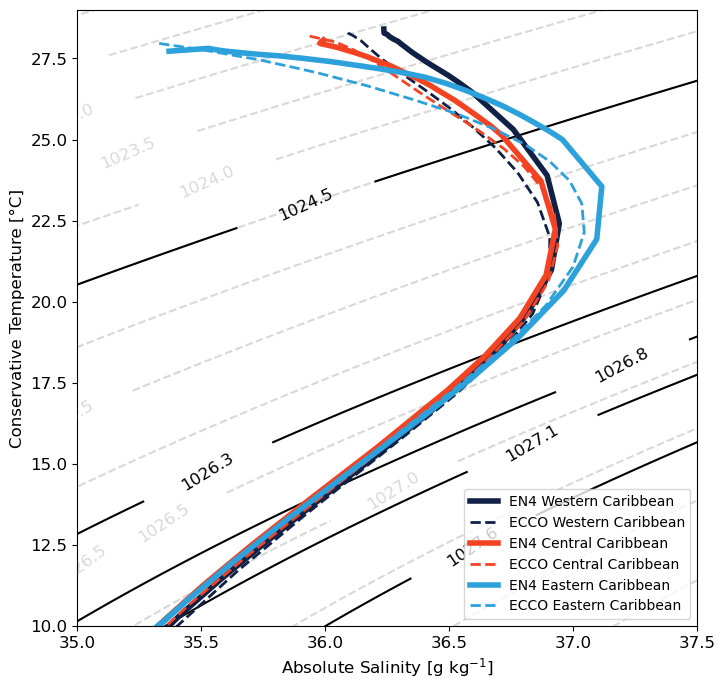

In [44]:
plt.figure(figsize=(8,8))
plt.plot(west_en4_mean_profile.absolute_salinity,west_en4_mean_profile.conservative_temperature,color=wc_col,label='EN4 Western Caribbean',linewidth=4)
plt.plot(west_ecco_mean_profile.absolute_salinity,west_ecco_mean_profile.conservative_temperature,'--',color=wc_col,label='ECCO Western Caribbean',linewidth=2)


plt.plot(central_en4_mean_profile.absolute_salinity,central_en4_mean_profile.conservative_temperature,color=cc_col,label='EN4 Central Caribbean',linewidth=4)
plt.plot(central_ecco_mean_profile.absolute_salinity,central_ecco_mean_profile.conservative_temperature,'--',color=cc_col,label='ECCO Central Caribbean',linewidth=2)


plt.plot(east_en4_mean_profile.absolute_salinity,east_en4_mean_profile.conservative_temperature,color=ec_col,label='EN4 Eastern Caribbean',linewidth=4)
plt.plot(east_ecco_mean_profile.absolute_salinity,east_ecco_mean_profile.conservative_temperature,'--',color=ec_col,label='ECCO Eastern Caribbean',linewidth=2)



######## This plots the contours
mint=1
maxt=30
mins=34
maxs=37.5
n =499
tempL=np.linspace(mint-1,maxt+1,n)
salL=np.linspace(mins-1,maxs+1,n)
Tg, Sg = np.meshgrid(tempL,salL)

z=np.linspace(-1000,0,n)
p = gsw.p_from_z(z,lat=0)

sigma_theta = gsw.sigma0(Sg, Tg)+1000

cnt = np.linspace(sigma_theta.min(), sigma_theta.max(),n)
ind = np.argwhere(sigma_theta > 1015.7)
st_short = sigma_theta[ind]

## Thin bois
cs = plt.contour(Sg, Tg, sigma_theta, colors='grey', alpha=0.3,linestyles='dashed', zorder=1 ,levels=np.arange(1021,1030,0.5))
levels = cs.levels
manual_locations = [(0, 0), (0, 0),(0, 0), (34.75, 28),(34.8, 27.6), (35.25,24), (35.5, 24), (35, 25),(34.75, 17), (35, 16),(35.25,14), (0,0), (35,12),(0,0),(36.35,13.5), (0,0), (35.5,8),(35.75,6),(36.25,6),(36.75,5)]
plt.clabel(cs,levels, fontsize=12,inline=True,fmt='%.1f', manual=manual_locations)

## Thick bois
cs = plt.contour(Sg, Tg, sigma_theta, colors='black', zorder=1 ,levels=[1024.5,1026.3,1026.8,1027.1,1027.6])
levels = cs.levels
manual_locations = [(36, 22), (35.5, 15), (37.2,18), (36.9,15), (36.65,12)]
plt.clabel(cs,levels, fontsize=font_size,inline=True,fmt='%.1f', manual=manual_locations)

plt.ylim(10,29)
plt.xlim(35,37.5)
plt.ylabel('Conservative Temperature [°C]',size=font_size)
plt.xlabel('Absolute Salinity [g kg$^{-1}$]',size=font_size)
plt.gca().tick_params(axis='both', which='major', labelsize=font_size)
plt.legend()

/var/folders/m9/d8bbz1wx4f50q99kfb1jv9pw0000gn/T/ipykernel_72652/784225972.py:7: UserWarning: The following kwargs were not used by contour: 'linewidth'
  cs = ax[0].contour(carib_ds.x,carib_ds.depth,carib_ds.isel(y=y).mean('time').absolute_salinity.transpose(),[35.5,36,36.5,36.75,37,37.1,37.2],colors='black',linewidth=5)
/var/folders/m9/d8bbz1wx4f50q99kfb1jv9pw0000gn/T/ipykernel_72652/784225972.py:17: UserWarning: The following kwargs were not used by contour: 'linewidth'
  cs = ax[1].contour(en4.x,-en4.depth,en4.mean(dim='time').absolute_salinity.isel(y=lat),[35.5,36,36.5,36.75,37,37.1,37.2],colors='black',linewidth=5)


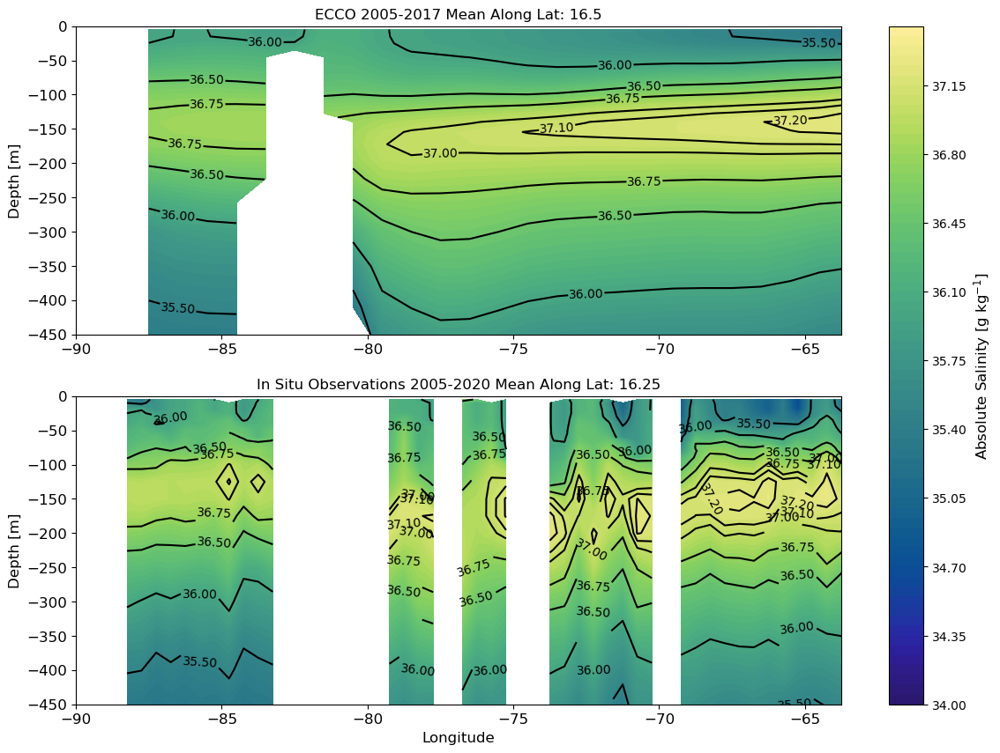

In [45]:
font_size=12

y=7

fig, ax = plt.subplots(2,1,figsize=(14,10))
ax[0].contourf(carib_ds.x,carib_ds.depth,carib_ds.isel(y=y).mean('time').absolute_salinity.transpose(),cmap=cmo.haline,levels=np.arange(34,37.5,0.05))
cs = ax[0].contour(carib_ds.x,carib_ds.depth,carib_ds.isel(y=y).mean('time').absolute_salinity.transpose(),[35.5,36,36.5,36.75,37,37.1,37.2],colors='black',linewidth=5)
plt.clabel(cs, inline=True, fontsize=10)
ax[0].set_xlim(-90,-63.75)
ax[0].set_ylim(-450,0)
ax[0].set_ylabel('Depth [m]',fontsize=font_size)
ax[0].set_title(f'ECCO 2005-2017 Mean Along Lat: {carib_ds.y[y].values}', fontsize=font_size)

lat = 15

cm = ax[1].contourf(en4.x,-en4.depth,en4.mean(dim='time').absolute_salinity.isel(y=lat),cmap=cmo.haline,levels=np.arange(34,37.5,0.05))
cs = ax[1].contour(en4.x,-en4.depth,en4.mean(dim='time').absolute_salinity.isel(y=lat),[35.5,36,36.5,36.75,37,37.1,37.2],colors='black',linewidth=5)
plt.clabel(cs, inline=True, fontsize=10)
ax[1].set_xlim(-90,-63.75)
ax[1].set_ylim(-450,0)
ax[1].set_title(f'In Situ Observations 2005-2020 Mean Along Lat: {en4.y[lat].values}', fontsize=font_size)
ax[1].set_ylabel('Depth [m]',fontsize=font_size)
ax[1].set_xlabel('Longitude',fontsize=font_size)


ax[0].tick_params(axis='both', which='major', labelsize=font_size)
ax[1].tick_params(axis='both', which='major', labelsize=font_size)

cbar = fig.colorbar(cm, ax=ax.ravel().tolist())

cbar.set_label('Absolute Salinity [g kg$^{-1}$]', fontsize = font_size)


plt.savefig('/Users/joegradone/SynologyDrive/Drive/Rutgers/Research/figures/Python/Model/ECCO/ECCO_EN4_Zonal_Slice.png', bbox_inches='tight',dpi=300,facecolor='white')


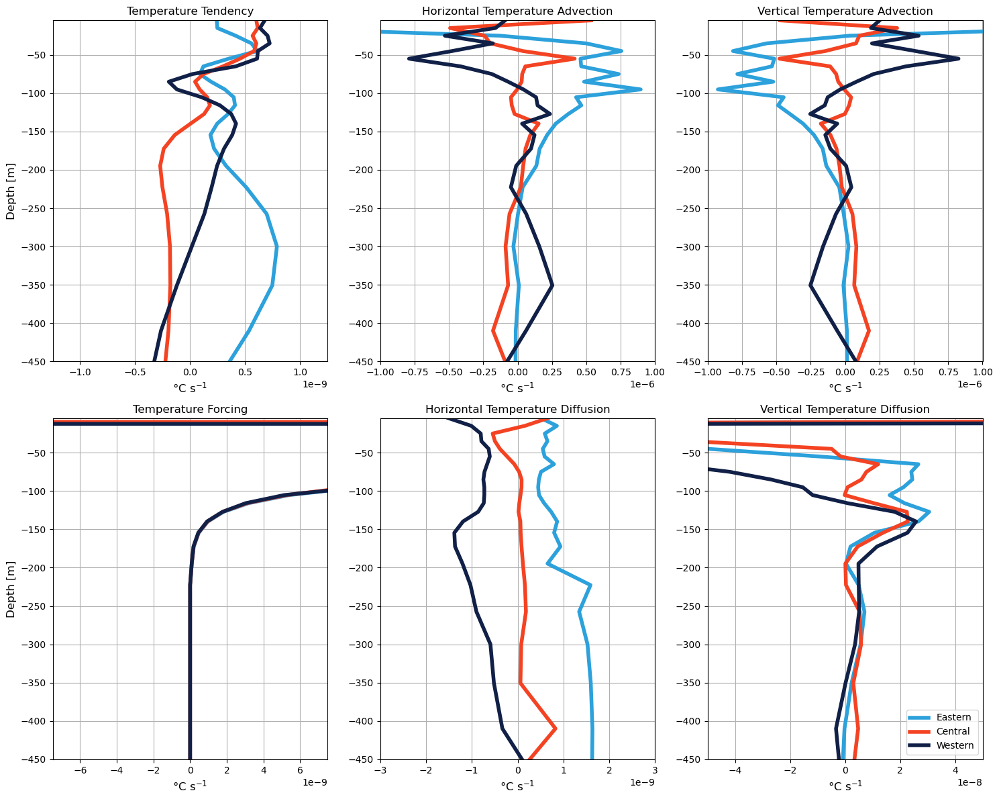

In [47]:
lwd = 4


fig, ax = plt.subplots(2,3,figsize=(15,12))
    
ax[0,0].plot(east_ecco_mean_profile.temp_tendency,east_ecco_mean_profile.depth,linewidth=lwd,color=ec_col)
ax[0,0].plot(central_ecco_mean_profile.temp_tendency,central_ecco_mean_profile.depth,linewidth=lwd,color=cc_col)
ax[0,0].plot(west_ecco_mean_profile.temp_tendency,west_ecco_mean_profile.depth,linewidth=lwd,color=wc_col)
ax[0,0].grid()
ax[0,0].set_ylim(-450,-5)
ax[0,0].set_title('Temperature Tendency')
ax[0,0].set_ylabel('Depth [m]', fontsize = font_size)
ax[0,0].set_xlabel('°C s$^{-1}$', fontsize = font_size)
x_max = 1.25*10**(-9)
x_min = -x_max
ax[0,0].set_xlim(x_min, x_max)


ax[0,1].plot(east_ecco_mean_profile.temp_advection_h,east_ecco_mean_profile.depth,linewidth=lwd,color=ec_col)
ax[0,1].plot(central_ecco_mean_profile.temp_advection_h,central_ecco_mean_profile.depth,linewidth=lwd,color=cc_col)
ax[0,1].plot(west_ecco_mean_profile.temp_advection_h,west_ecco_mean_profile.depth,linewidth=lwd,color=wc_col)
ax[0,1].grid()
ax[0,1].set_ylim(-450,-5)
ax[0,1].set_title('Horizontal Temperature Advection')
ax[0,1].set_xlabel('°C s$^{-1}$', fontsize = font_size)
x_max = 1*10**(-6)
x_min = -x_max
ax[0,1].set_xlim(x_min, x_max)

ax[0,2].plot(east_ecco_mean_profile.temp_advection_v,east_ecco_mean_profile.depth,linewidth=lwd,color=ec_col)
ax[0,2].plot(central_ecco_mean_profile.temp_advection_v,central_ecco_mean_profile.depth,linewidth=lwd,color=cc_col)
ax[0,2].plot(west_ecco_mean_profile.temp_advection_v,west_ecco_mean_profile.depth,linewidth=lwd,color=wc_col)
ax[0,2].grid()
ax[0,2].set_ylim(-450,-5)
ax[0,2].set_title('Vertical Temperature Advection')
ax[0,2].set_xlabel('°C s$^{-1}$', fontsize = font_size)
x_max = 1*10**(-6)
x_min = -x_max
ax[0,2].set_xlim(x_min, x_max)

ax[1,0].plot(east_ecco_mean_profile.temp_forcing,east_ecco_mean_profile.depth,linewidth=lwd,color=ec_col)
ax[1,0].plot(central_ecco_mean_profile.temp_forcing,central_ecco_mean_profile.depth,linewidth=lwd,color=cc_col)
ax[1,0].plot(west_ecco_mean_profile.temp_forcing,west_ecco_mean_profile.depth,linewidth=lwd,color=wc_col)
ax[1,0].grid()
ax[1,0].set_ylim(-450,-5)
ax[1,0].set_title('Temperature Forcing')
ax[1,0].set_ylabel('Depth [m]', fontsize = font_size)
ax[1,0].set_xlabel('°C s$^{-1}$', fontsize = font_size)
x_max = 7.5*10**(-9)
x_min = -x_max
ax[1,0].set_xlim(x_min, x_max)

ax[1,1].plot(east_ecco_mean_profile.temp_diffusion_h,east_ecco_mean_profile.depth,linewidth=lwd,color=ec_col)
ax[1,1].plot(central_ecco_mean_profile.temp_diffusion_h,central_ecco_mean_profile.depth,linewidth=lwd,color=cc_col)
ax[1,1].plot(west_ecco_mean_profile.temp_diffusion_h,west_ecco_mean_profile.depth,linewidth=lwd,color=wc_col)
ax[1,1].grid()
ax[1,1].set_ylim(-450,-5)
ax[1,1].set_title('Horizontal Temperature Diffusion')
ax[1,1].set_xlabel('°C s$^{-1}$', fontsize = font_size)
x_max = 0.3*10**(-8)
x_min = -x_max
ax[1,1].set_xlim(x_min, x_max)

ax[1,2].plot(east_ecco_mean_profile.temp_diffusion_v,east_ecco_mean_profile.depth,label='Eastern',linewidth=lwd,color=ec_col)
ax[1,2].plot(central_ecco_mean_profile.temp_diffusion_v,central_ecco_mean_profile.depth,label='Central',linewidth=lwd,color=cc_col)
ax[1,2].plot(west_ecco_mean_profile.temp_diffusion_v,west_ecco_mean_profile.depth,label='Western',linewidth=lwd,color=wc_col)
ax[1,2].grid()
ax[1,2].set_ylim(-450,-5)
ax[1,2].set_title('Vertical Temperature Diffusion')
ax[1,2].set_xlabel('°C s$^{-1}$', fontsize = font_size)
ax[1,2].legend(loc = 'lower right')
x_max = 5*10**(-8)
x_min = -x_max
ax[1,2].set_xlim(x_min, x_max)



fig.tight_layout()
plt.savefig('/Users/joegradone/SynologyDrive/Drive/Rutgers/Research/figures/Python/Model/ECCO/ECCO_Eastern_Central_Western_Mean_Temp_Budget_Terms_Profiles.png', bbox_inches='tight',dpi=300,facecolor='white')


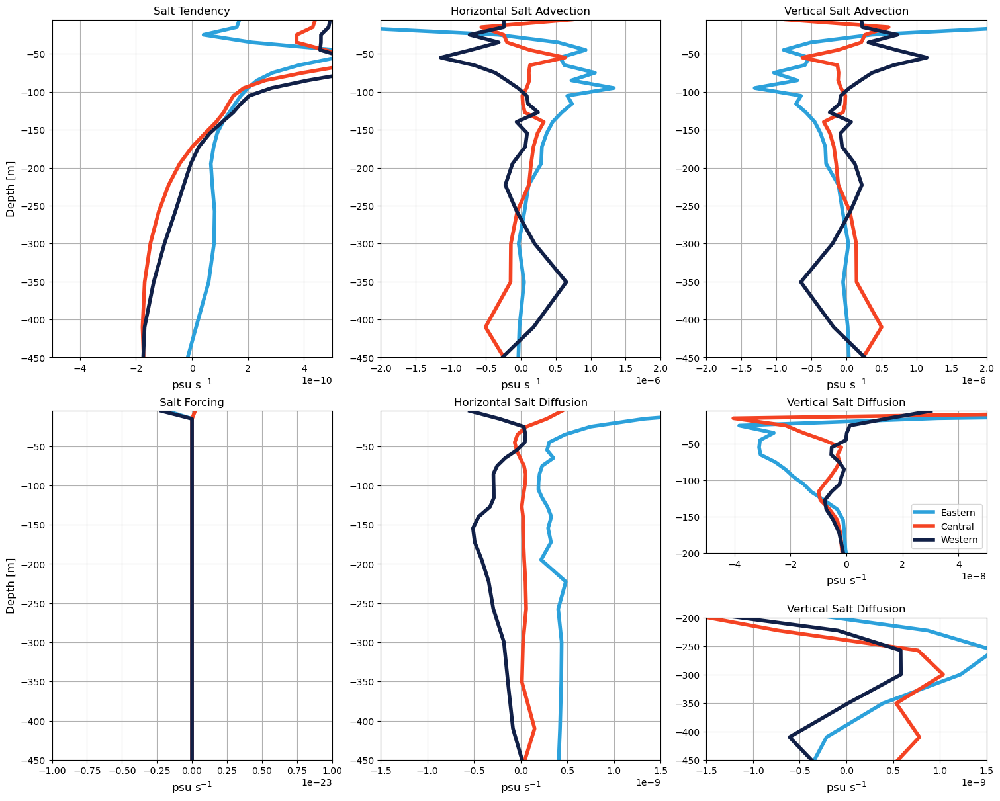

In [48]:
lwd = 4

fig = plt.figure(figsize=(15,12),constrained_layout=True)
gs = fig.add_gridspec(4, 3)

ax1 = fig.add_subplot(gs[0:2, 0])
ax1.plot(east_ecco_mean_profile.salt_tendency,east_ecco_mean_profile.depth,linewidth=lwd,color=ec_col)
ax1.plot(central_ecco_mean_profile.salt_tendency,central_ecco_mean_profile.depth,linewidth=lwd,color=cc_col)
ax1.plot(west_ecco_mean_profile.salt_tendency,west_ecco_mean_profile.depth,linewidth=lwd,color=wc_col)
ax1.grid()
ax1.set_ylim(-450,-5)
ax1.set_title('Salt Tendency')
ax1.set_ylabel('Depth [m]', fontsize = font_size)
ax1.set_xlabel('psu s$^{-1}$', fontsize = font_size)
x_max = 0.5*10**(-9)
x_min = -x_max
ax1.set_xlim(x_min, x_max)


ax2 = fig.add_subplot(gs[0:2, 1])
ax2.plot(east_ecco_mean_profile.salt_advection_h,east_ecco_mean_profile.depth,linewidth=lwd,color=ec_col)
ax2.plot(central_ecco_mean_profile.salt_advection_h,central_ecco_mean_profile.depth,linewidth=lwd,color=cc_col)
ax2.plot(west_ecco_mean_profile.salt_advection_h,west_ecco_mean_profile.depth,linewidth=lwd,color=wc_col)
ax2.grid()
ax2.set_ylim(-450,-5)
ax2.set_title('Horizontal Salt Advection')
ax2.set_xlabel('psu s$^{-1}$', fontsize = font_size)
x_max = 2*10**(-6)
x_min = -x_max
ax2.set_xlim(x_min, x_max)


ax3 = fig.add_subplot(gs[0:2, 2])
ax3.plot(east_ecco_mean_profile.salt_advection_v,east_ecco_mean_profile.depth,linewidth=lwd,color=ec_col)
ax3.plot(central_ecco_mean_profile.salt_advection_v,central_ecco_mean_profile.depth,linewidth=lwd,color=cc_col)
ax3.plot(west_ecco_mean_profile.salt_advection_v,west_ecco_mean_profile.depth,linewidth=lwd,color=wc_col)
ax3.grid()
ax3.set_ylim(-450,-5)
ax3.set_title('Vertical Salt Advection')
ax3.set_xlabel('psu s$^{-1}$', fontsize = font_size)
x_max = 2*10**(-6)
x_min = -x_max
ax3.set_xlim(x_min, x_max)


ax4 = fig.add_subplot(gs[2:4, 0])
ax4.plot(east_ecco_mean_profile.salt_forcing,east_ecco_mean_profile.depth,linewidth=lwd,color=ec_col)
ax4.plot(central_ecco_mean_profile.salt_forcing,central_ecco_mean_profile.depth,linewidth=lwd,color=cc_col)
ax4.plot(west_ecco_mean_profile.salt_forcing,west_ecco_mean_profile.depth,linewidth=lwd,color=wc_col)
ax4.grid()
ax4.set_ylim(-450,-5)
ax4.set_title('Salt Forcing')
ax4.set_ylabel('Depth [m]', fontsize = font_size)
ax4.set_xlabel('psu s$^{-1}$', fontsize = font_size)
x_max = 1*10**(-23)
x_min = -x_max
ax4.set_xlim(x_min, x_max)


ax5 = fig.add_subplot(gs[2:4, 1])
ax5.plot(east_ecco_mean_profile.salt_diffusion_h,east_ecco_mean_profile.depth,linewidth=lwd,color=ec_col)
ax5.plot(central_ecco_mean_profile.salt_diffusion_h,central_ecco_mean_profile.depth,linewidth=lwd,color=cc_col)
ax5.plot(west_ecco_mean_profile.salt_diffusion_h,west_ecco_mean_profile.depth,linewidth=lwd,color=wc_col)
ax5.grid()
ax5.set_ylim(-450,-5)
ax5.set_title('Horizontal Salt Diffusion')
ax5.set_xlabel('psu s$^{-1}$', fontsize = font_size)
x_max = 1.5*10**(-9)
x_min = -x_max
ax5.set_xlim(x_min, x_max)


ax6 = fig.add_subplot(gs[2, 2])
ax6.plot(east_ecco_mean_profile.salt_diffusion_v,east_ecco_mean_profile.depth,label='Eastern',linewidth=lwd,color=ec_col)
ax6.plot(central_ecco_mean_profile.salt_diffusion_v,central_ecco_mean_profile.depth,label='Central',linewidth=lwd,color=cc_col)
ax6.plot(west_ecco_mean_profile.salt_diffusion_v,west_ecco_mean_profile.depth,label='Western',linewidth=lwd,color=wc_col)
ax6.grid()
ax6.set_ylim(-200,-5)
ax6.set_title('Vertical Salt Diffusion')
ax6.set_xlabel('psu s$^{-1}$', fontsize = font_size)
ax6.legend(loc = 'lower right')
x_max = 5*10**(-8)
x_min = -x_max
ax6.set_xlim(x_min, x_max)

ax7 = fig.add_subplot(gs[3, 2])
ax7.plot(east_ecco_mean_profile.salt_diffusion_v,east_ecco_mean_profile.depth,label='Eastern',linewidth=lwd,color=ec_col)
ax7.plot(central_ecco_mean_profile.salt_diffusion_v,central_ecco_mean_profile.depth,label='Central',linewidth=lwd,color=cc_col)
ax7.plot(west_ecco_mean_profile.salt_diffusion_v,west_ecco_mean_profile.depth,label='Western',linewidth=lwd,color=wc_col)
ax7.grid()
ax7.set_ylim(-450,-200)
ax7.set_title('Vertical Salt Diffusion')
ax7.set_xlabel('psu s$^{-1}$', fontsize = font_size)
x_max = 1.5*10**(-9)
x_min = -x_max
ax7.set_xlim(x_min, x_max)

plt.savefig('/Users/joegradone/SynologyDrive/Drive/Rutgers/Research/figures/Python/Model/ECCO/ECCO_Eastern_Central_Western_Mean_Salt_Budget_Terms_Profiles.png', bbox_inches='tight',dpi=300,facecolor='white')


In [51]:
carib_ds

<xarray.Dataset>
Dimensions:                   (x: 28, y: 14, time: 288, depth: 29)
Coordinates:
  * x                         (x) float64 -87.5 -86.5 -85.5 ... -61.5 -60.5
  * y                         (y) float64 9.5 10.5 11.5 12.5 ... 20.5 21.5 22.5
  * time                      (time) datetime64[ns] 1993-01-16T12:00:00 ... 2...
  * depth                     (depth) float32 -5.0 -15.0 ... -909.7 -1.007e+03
    spatial_ref               int64 0
Data variables: (12/33)
    temp_tendency             (y, x, depth, time) float64 nan nan ... nan nan
    temp_advection_h          (y, x, depth, time) float64 nan nan ... nan nan
    temp_advection_v          (y, x, depth, time) float64 nan nan ... nan nan
    temp_diffusion_h          (y, x, depth, time) float64 nan nan ... nan nan
    temp_diffusion_v          (y, x, depth, time) float64 nan nan ... nan nan
    temp_forcing              (y, x, depth, time) float64 nan nan ... nan nan
    ...                        ...
    vvel                      (y, x, depth, time) float64 nan nan ... nan nan
    wvel                      (y, x, depth, time) float64 nan nan ... nan nan
    mld                       (y, x, time) float64 nan nan nan ... nan nan nan
    absolute_salinity         (y, x, depth, time) float64 nan nan ... nan nan
    conservative_temperature  (y, x, depth, time) float64 nan nan ... nan nan
    potential_density         (y, x, depth, time) float64 nan nan ... nan nan

/Users/joegradone/anaconda3/envs/rutgers-phd/lib/python3.11/site-packages/cartopy/mpl/geoaxes.py:1604: UserWarning: The following kwargs were not used by contour: 'linewidth'
  result = super().contour(*args, **kwargs)
/Users/joegradone/anaconda3/envs/rutgers-phd/lib/python3.11/site-packages/cartopy/mpl/gridliner.py:451: UserWarning: The .xlabels_top attribute is deprecated. Please use .top_labels to toggle visibility instead.
  warnings.warn('The .xlabels_top attribute is deprecated. Please '
/Users/joegradone/anaconda3/envs/rutgers-phd/lib/python3.11/site-packages/cartopy/mpl/gridliner.py:487: UserWarning: The .ylabels_right attribute is deprecated. Please use .right_labels to toggle visibility instead.
  warnings.warn('The .ylabels_right attribute is deprecated. Please '


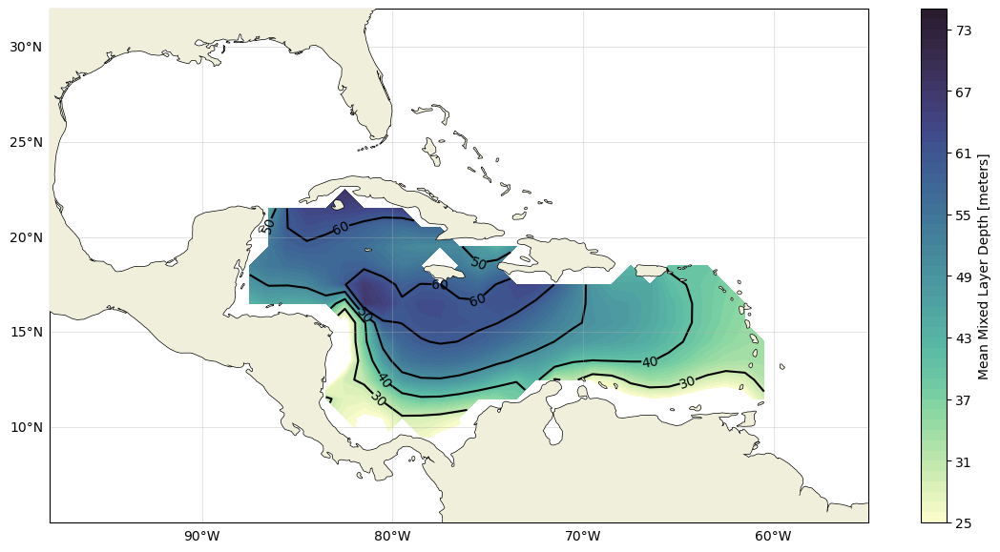

In [52]:
fig, ax = plt.subplots(figsize=(14,7),subplot_kw=dict(projection=cartopy.crs.PlateCarree()))


im = ax.contourf(lonmesh_carib,latmesh_carib,carib_ds.mld.mean(dim='time'),transform =cartopy.crs.PlateCarree(),cmap=cmo.deep,levels=np.arange(25,76,1))
plt.colorbar(im, ax=ax,label='Mean Mixed Layer Depth [meters]')
cs = plt.contour(lonmesh_carib,latmesh_carib,carib_ds.mld.mean(dim='time'),[30,40,50,60],colors='black',linewidth=5,transform =cartopy.crs.PlateCarree())
plt.clabel(cs, inline=True, fontsize=10)

ax.coastlines(linewidth=1.0,zorder=10)
ax.add_feature(cartopy.feature.LAND,zorder=10)
glb = ax.gridlines(draw_labels=True, alpha=0.5, linewidth=.5 )
glb.xlabels_top = glb.ylabels_right = False

# ax.add_geometries(nwcarib.geometry, crs=ccrs.PlateCarree(),facecolor=None, edgecolor=wc_col,alpha=0.2,zorder=10)
# ax.add_geometries(central_carib.geometry, crs=ccrs.PlateCarree(),facecolor=None, edgecolor=cc_col,alpha=0.2)
# ax.add_geometries(ecarib.geometry, crs=ccrs.PlateCarree(),facecolor=None, edgecolor=ec_col,alpha=0.2)

ax.set_ylim(5,32)
ax.set_xlim(-98,-55)

plt.savefig('/Users/joegradone/SynologyDrive/Drive/Rutgers/Research/figures/Python/Model/ECCO/ECCO_Mean_MLD_Map.png', bbox_inches='tight',dpi=300,facecolor='white')


## Salinity Max Depth

In [53]:
ds['salinity_max_depth'] = ds.salt.isel(depth=slice(6,23)).idxmax(dim='depth')
carib_ds['salinity_max_depth'] = carib_ds.salt.isel(depth=slice(6,23)).idxmax(dim='depth')

en4['salinity_max_depth'] = en4.absolute_salinity.isel(depth=slice(20,28)).idxmax(dim='depth')


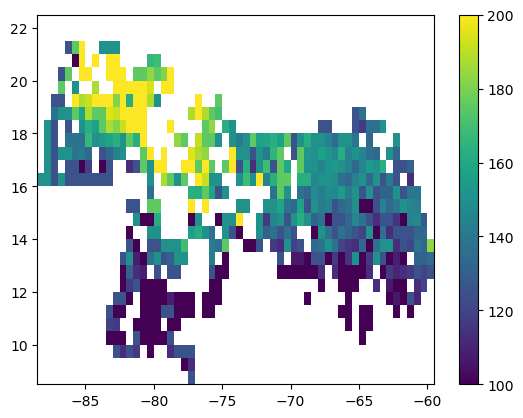

In [60]:
plt.pcolormesh(en4.x,en4.y,en4.salinity_max_depth.mean(dim='time'),vmin=100,vmax=200)
plt.colorbar()

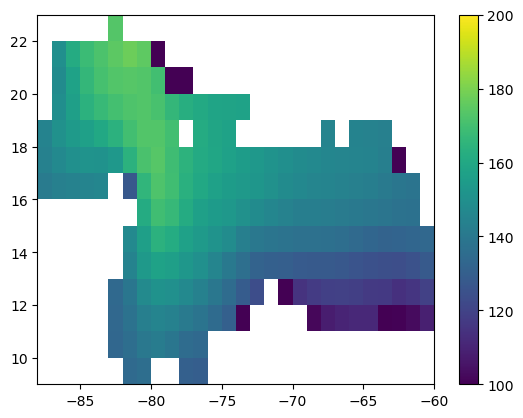

In [55]:
plt.pcolormesh(carib_ds.x,carib_ds.y,-carib_ds.salinity_max_depth.mean(dim='time'),vmin=100,vmax=200)
plt.colorbar()

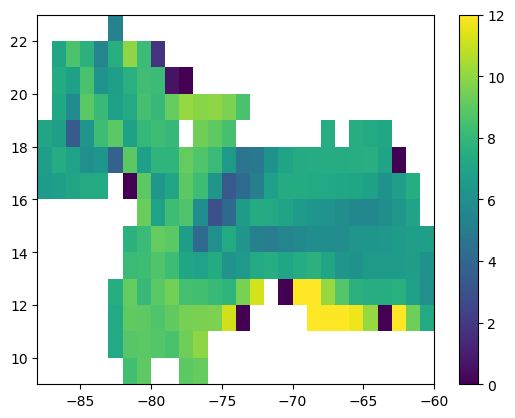

In [56]:
plt.pcolormesh(carib_ds.x,carib_ds.y,carib_ds.salinity_max_depth.std(dim='time'),vmin=0,vmax=12)
plt.colorbar()

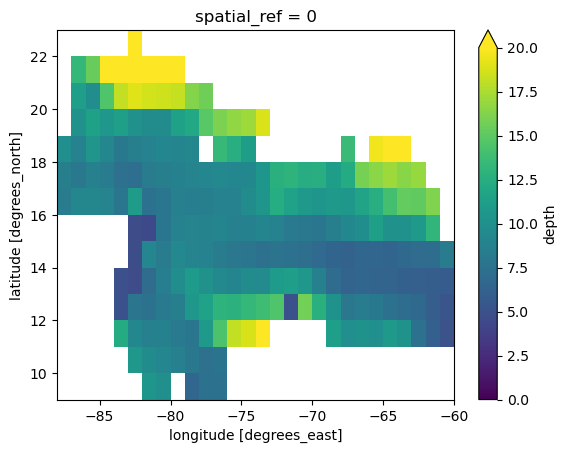

In [57]:
np.abs(26-carib_ds.conservative_temperature).idxmin(dim='depth').std(dim='time').plot(vmin=0,vmax=20)

Text(0.5, 0, 'Longitude')

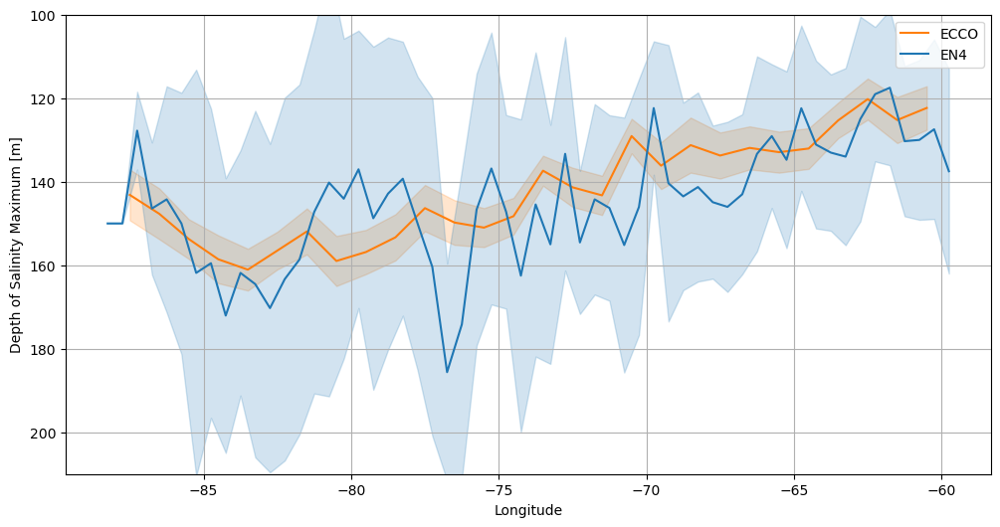

In [61]:
plt.figure(figsize=(12,6))
plt.plot(carib_ds.x,-carib_ds.salinity_max_depth.mean(dim=['time','y']),label='ECCO',color='tab:orange')
plt.fill_between(carib_ds.x,(-carib_ds.salinity_max_depth.mean(dim=['time','y']))-carib_ds.salinity_max_depth.mean(dim=['y']).std(dim='time'),
                 (-carib_ds.salinity_max_depth.mean(dim=['time','y']))+carib_ds.salinity_max_depth.mean(dim=['y']).std(dim='time'),color='tab:orange',alpha=0.2)
plt.plot(en4.x,en4.salinity_max_depth.mean(dim=['time','y']),label='EN4',color='tab:blue')
plt.fill_between(en4.x,en4.salinity_max_depth.mean(dim=['time','y'])-en4.salinity_max_depth.mean(dim=['y']).std(dim='time'),
                 en4.salinity_max_depth.mean(dim=['time','y'])+en4.salinity_max_depth.mean(dim=['y']).std(dim='time'),color='tab:blue',alpha=0.2)
plt.ylim(210,100)
plt.grid()
plt.legend()
plt.ylabel('Depth of Salinity Maximum [m]')
plt.xlabel('Longitude')

# Calculate KE metrics

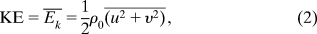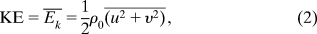

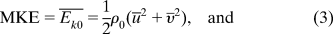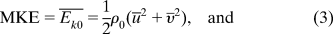

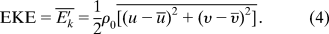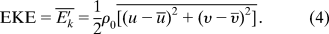

In [156]:
rho = 1000 # kg/m^3

#########################################################################################
## Time Mean
KE = (0.5*rho)*(((carib_ds.uvel**2)+((carib_ds.vvel**2))).mean(dim='time'))

MKE = (0.5*rho)*((carib_ds.uvel.mean(dim='time')**2)+(carib_ds.vvel.mean(dim='time')**2))

u_anom = carib_ds.uvel-carib_ds.uvel.mean(dim='time')
v_anom = carib_ds.vvel-carib_ds.vvel.mean(dim='time')

EKE = (0.5*rho)*((u_anom**2)+(v_anom**2)).mean(dim='time')
#########################################################################################


#########################################################################################
## On the monthly mean data
ke = (0.5*rho)*((carib_ds.uvel**2)+((carib_ds.vvel**2)))

u_anom = carib_ds.uvel-carib_ds.uvel.mean(dim='time')
v_anom = carib_ds.vvel-carib_ds.vvel.mean(dim='time')

eke = (0.5*rho)*((u_anom**2)+(v_anom**2))
#########################################################################################

#########################################################################################
## On the regional data
KE_east = (0.5*rho)*(((east_carib_ds.uvel**2)+((east_carib_ds.vvel**2))).mean(dim='time'))
KE_west = (0.5*rho)*(((west_carib_ds.uvel**2)+((west_carib_ds.vvel**2))).mean(dim='time'))
KE_central = (0.5*rho)*(((central_carib_ds.uvel**2)+((central_carib_ds.vvel**2))).mean(dim='time'))

MKE_east = (0.5*rho)*((east_carib_ds.uvel.mean(dim='time')**2)+(east_carib_ds.vvel.mean(dim='time')**2))
MKE_west = (0.5*rho)*((west_carib_ds.uvel.mean(dim='time')**2)+(west_carib_ds.vvel.mean(dim='time')**2))
MKE_central = (0.5*rho)*((central_carib_ds.uvel.mean(dim='time')**2)+(central_carib_ds.vvel.mean(dim='time')**2))

u_anom_east = east_carib_ds.uvel-east_carib_ds.uvel.mean(dim='time')
u_anom_west = west_carib_ds.uvel-west_carib_ds.uvel.mean(dim='time')
u_anom_central = central_carib_ds.uvel-central_carib_ds.uvel.mean(dim='time')

v_anom_east = east_carib_ds.vvel-east_carib_ds.vvel.mean(dim='time')
v_anom_west = west_carib_ds.vvel-west_carib_ds.vvel.mean(dim='time')
v_anom_central = central_carib_ds.vvel-central_carib_ds.vvel.mean(dim='time')

EKE_east = (0.5*rho)*((u_anom_east**2)+(u_anom_east**2)).mean(dim='time')
EKE_west = (0.5*rho)*((u_anom_west**2)+(u_anom_west**2)).mean(dim='time')
EKE_central = (0.5*rho)*((u_anom_central**2)+(u_anom_central**2)).mean(dim='time')


#########################################################################################
## On the regional, monthly mean data
ke_east = (0.5*rho)*((east_carib_ds.uvel**2)+(east_carib_ds.vvel**2))
ke_west = (0.5*rho)*((west_carib_ds.uvel**2)+(west_carib_ds.vvel**2))
ke_central = (0.5*rho)*((central_carib_ds.uvel**2)+(central_carib_ds.vvel**2))

u_anom_east = east_carib_ds.uvel-east_carib_ds.uvel.mean(dim='time')
u_anom_west = west_carib_ds.uvel-west_carib_ds.uvel.mean(dim='time')
u_anom_central = central_carib_ds.uvel-central_carib_ds.uvel.mean(dim='time')

v_anom_east = east_carib_ds.vvel-east_carib_ds.vvel.mean(dim='time')
v_anom_west = west_carib_ds.vvel-west_carib_ds.vvel.mean(dim='time')
v_anom_central = central_carib_ds.vvel-central_carib_ds.vvel.mean(dim='time')

eke_east = (0.5*rho)*((u_anom_east**2)+(u_anom_east**2))
eke_west = (0.5*rho)*((u_anom_west**2)+(u_anom_west**2))
eke_central = (0.5*rho)*((u_anom_central**2)+(u_anom_central**2))

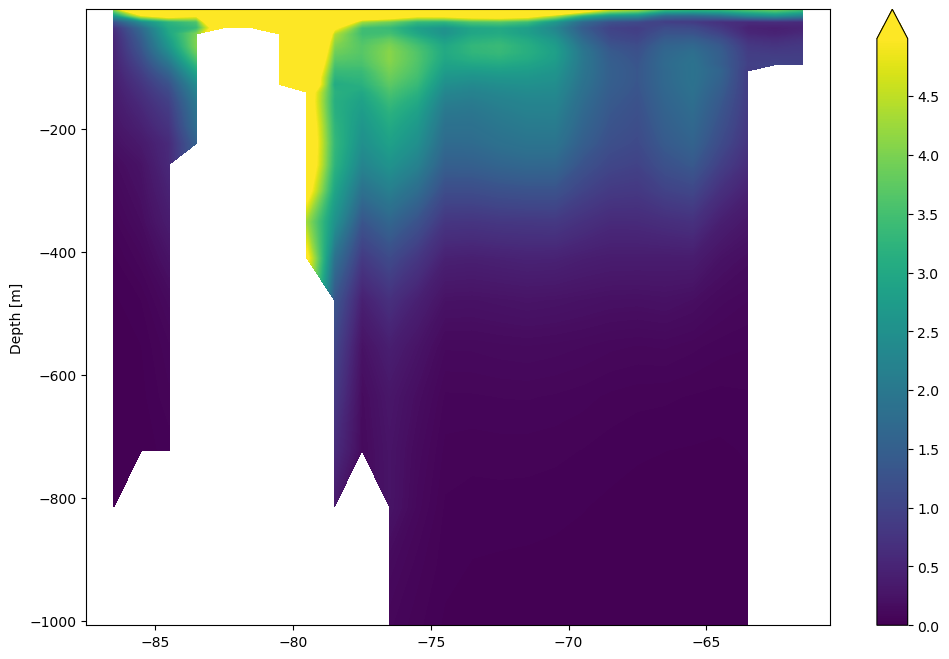

In [126]:
plt.figure(figsize=(12,8))
plt.contourf(KE.x,KE.depth,KE.isel(y=7).transpose(),levels=np.arange(0,5,0.01),extend='max')
plt.ylabel('Depth [m]')
plt.colorbar()

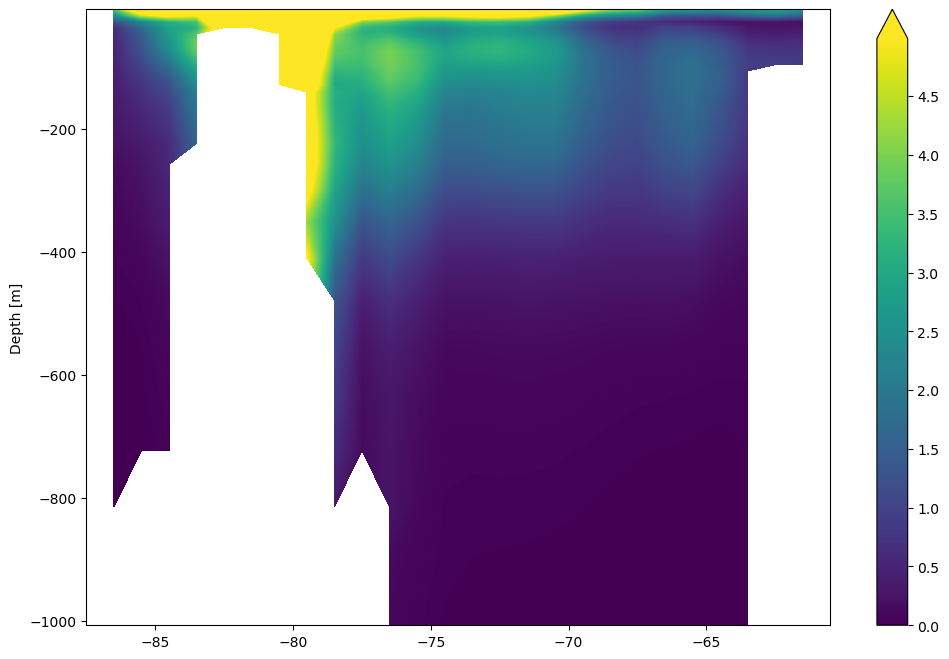

In [127]:
plt.figure(figsize=(12,8))
plt.contourf(MKE.x,MKE.depth,MKE.isel(y=7).transpose(),levels=np.arange(0,5,0.01),extend='max')
plt.ylabel('Depth [m]')
plt.colorbar()

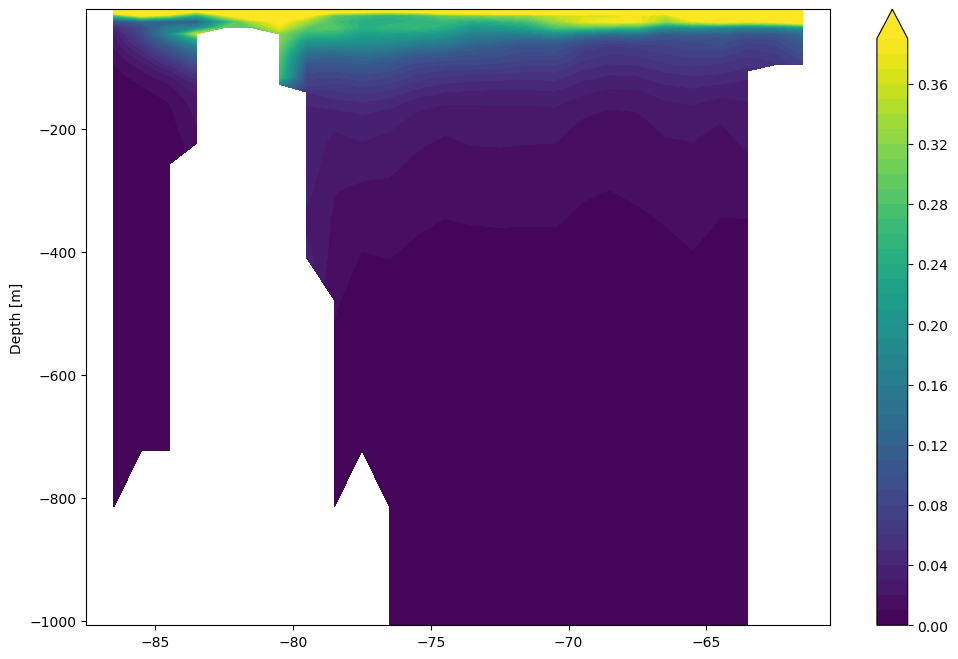

In [128]:
plt.figure(figsize=(12,8))
plt.contourf(EKE.x,EKE.depth,EKE.isel(y=7).transpose(),levels=np.arange(0,0.4,0.01),extend='max')
plt.ylabel('Depth [m]')
plt.colorbar()

Text(0.5, 0, 'Kinetic Energy [m$^{2}$ s$^{-2}$]')

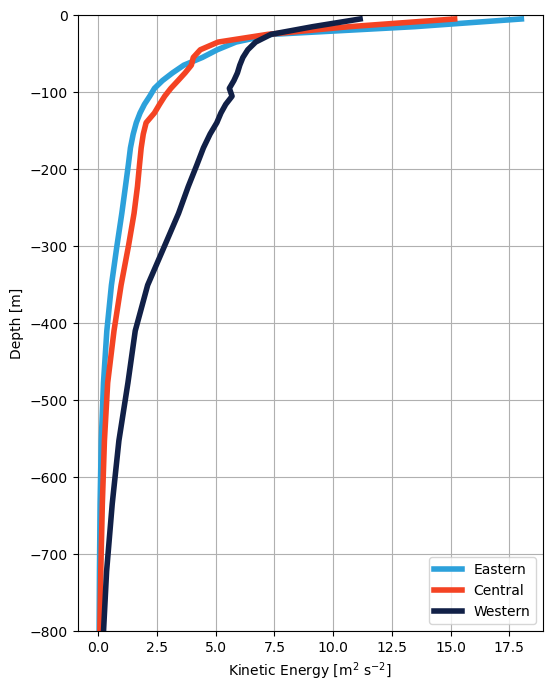

In [154]:
lwd = 4
plt.figure(figsize=(6,8))
plt.plot(KE_east.mean(dim=['x','y']),KE_east.depth,color=ec_col,linewidth=lwd,label='Eastern')
plt.plot(KE_central.mean(dim=['x','y']),KE_central.depth,color=cc_col,linewidth=lwd,label='Central')
plt.plot(KE_west.mean(dim=['x','y']),KE_west.depth,color=wc_col,linewidth=lwd,label='Western')
plt.ylim(-800,0)
plt.grid()
plt.legend()
plt.ylabel('Depth [m]')
plt.xlabel('Kinetic Energy [m$^{2}$ s$^{-2}$]')

## How does this compare with ENSO?

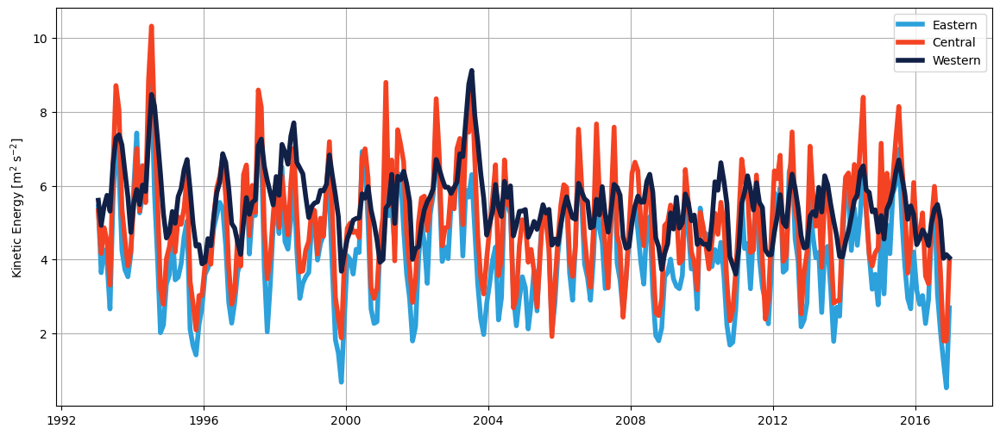

In [169]:
plt.figure(figsize=(14,6))
plt.plot(ke_east.time,ke_east.isel(depth=slice(0,23)).mean(dim='depth').mean(dim=['x','y']),color=ec_col,linewidth=lwd,label='Eastern')
plt.plot(ke_central.time,ke_central.isel(depth=slice(0,23)).mean(dim='depth').mean(dim=['x','y']),color=cc_col,linewidth=lwd,label='Central')
plt.plot(ke_west.time,ke_west.isel(depth=slice(0,23)).mean(dim='depth').mean(dim=['x','y']),color=wc_col,linewidth=lwd,label='Western')
plt.ylabel('Kinetic Energy [m$^{2}$ s$^{-2}$]')
plt.grid()
plt.legend()

In [79]:
# for k in np.arange(0,len(ds.depth)):

# #k=14
    
    
#     fig, ax = plt.subplots(2,3, figsize=(16,7), subplot_kw=dict(projection=cartopy.crs.PlateCarree()), constrained_layout=True)
    
#     s=0.9
    
#     ####################################################################################################################################################
#     vmax = 2*10**(-5)
#     im = ax[0,0].pcolormesh(ds.x,ds.y,ds.salt_advection_x.isel(depth=k).mean(dim='time'),transform =cartopy.crs.PlateCarree(),cmap='RdBu',vmin=-vmax,vmax=vmax)
#     ax[0,0].coastlines(linewidth=1.0,zorder=10)
#     ax[0,0].add_feature(cartopy.feature.LAND,zorder=10)
#     ax[0,0].set_title('E-W Salt Advection')
#     plt.colorbar(im,ax=ax[0,0],aspect=5,fraction=0.4,label='[psu s$^{-1}$]')
#     glb = ax[0,0].gridlines(draw_labels=True, alpha=0.5, linewidth=.5 )
#     glb.xlabels_top = glb.ylabels_right = False
    
#     ####################################################################################################################################################
    
#     ####################################################################################################################################################
#     vmax = 2*10**(-5)
#     im = ax[0,1].pcolormesh(ds.x,ds.y,ds.salt_advection_y.isel(depth=k).mean(dim='time'),transform =cartopy.crs.PlateCarree(),cmap='RdBu',vmin=-vmax,vmax=vmax)
#     ax[0,1].coastlines(linewidth=1.0,zorder=10)
#     ax[0,1].add_feature(cartopy.feature.LAND,zorder=10)
#     ax[0,1].set_title('N-S Salt Advection')
#     plt.colorbar(im,ax=ax[0,1],aspect=5,fraction=0.4,label='[psu s$^{-1}$]')
#     glb = ax[0,1].gridlines(draw_labels=True, alpha=0.5, linewidth=.5 )
#     glb.xlabels_top = glb.ylabels_right = False
#     ####################################################################################################################################################
    
    
#     ####################################################################################################################################################
#     vmax = 2*10**(-5)
#     im = ax[0,2].pcolormesh(ds.x,ds.y,ds.salt_advection_v.isel(depth=k).mean(dim='time'),transform =cartopy.crs.PlateCarree(),cmap='RdBu',vmin=-vmax,vmax=vmax)
#     ax[0,2].coastlines(linewidth=1.0,zorder=10)
#     ax[0,2].add_feature(cartopy.feature.LAND,zorder=10)
#     ax[0,2].set_title('Vertical Salt Advection')
#     plt.colorbar(im,ax=ax[0,2],aspect=5,fraction=0.4,label='[psu s$^{-1}$]')
#     glb = ax[0,2].gridlines(draw_labels=True, alpha=0.5, linewidth=.5 )
#     glb.xlabels_top = glb.ylabels_right = False
#     ####################################################################################################################################################
    
#     ####################################################################################################################################################
#     vmax = 1*10**(-8)
#     im = ax[1,0].pcolormesh(ds.x,ds.y,ds.salt_diffusion_x.isel(depth=k).mean(dim='time'),transform =cartopy.crs.PlateCarree(),cmap='RdBu',vmin=-vmax,vmax=vmax)
#     ax[1,0].coastlines(linewidth=1.0,zorder=10)
#     ax[1,0].add_feature(cartopy.feature.LAND,zorder=10)
#     ax[1,0].set_title('E-W Salt Diffusion')
#     plt.colorbar(im,ax=ax[1,0],aspect=5,fraction=0.4,label='[psu s$^{-1}$]')
#     glb = ax[1,0].gridlines(draw_labels=True, alpha=0.5, linewidth=.5 )
#     glb.xlabels_top = glb.ylabels_right = False
#     ####################################################################################################################################################
    
#     ####################################################################################################################################################
#     vmax = 1*10**(-8)
#     im = ax[1,1].pcolormesh(ds.x,ds.y,ds.salt_diffusion_y.isel(depth=k).mean(dim='time'),transform =cartopy.crs.PlateCarree(),cmap='RdBu',vmin=-vmax,vmax=vmax)
#     ax[1,1].coastlines(linewidth=1.0,zorder=10)
#     ax[1,1].add_feature(cartopy.feature.LAND,zorder=10)
#     ax[1,1].set_title('N-S Salt Diffusion')
#     plt.colorbar(im,ax=ax[1,1],aspect=5,fraction=0.4,label='[psu s$^{-1}$]')
#     glb = ax[1,1].gridlines(draw_labels=True, alpha=0.5, linewidth=.5 )
#     glb.xlabels_top = glb.ylabels_right = False
#     ####################################################################################################################################################
    
#     ####################################################################################################################################################
#     vmax = 1*10**(-8)
#     im = ax[1,2].pcolormesh(ds.x,ds.y,ds.salt_diffusion_v.isel(depth=k).mean(dim='time'),transform =cartopy.crs.PlateCarree(),cmap='RdBu',vmin=-vmax,vmax=vmax)
#     ax[1,2].coastlines(linewidth=1.0,zorder=10)
#     ax[1,2].add_feature(cartopy.feature.LAND,zorder=10)
#     ax[1,2].set_title('Vertical Salt Diffusion')
#     plt.colorbar(im,ax=ax[1,2],aspect=5,fraction=0.4,label='[psu s$^{-1}$]')
#     glb = ax[1,2].gridlines(draw_labels=True, alpha=0.5, linewidth=.5 )
#     glb.xlabels_top = glb.ylabels_right = False
#     ####################################################################################################################################################
    
#     plt.suptitle('ECCO Salt Budget Terms at %s m'%(ds.depth.values[k]), fontsize=16)
    
#     plotname = f'/Users/joegradone/SynologyDrive/Drive/Rutgers/Research/figures/Python/Model/ECCO/Spatial_Mean_Salt_Budget_Terms/Spatial_Mean_Salt_Budget_Terms_{-int(ds.depth.values[k])}_meters_depth.png'
#     plt.savefig(plotname, bbox_inches='tight',dpi=300,facecolor='white')


## Slice along 16


(-300.0, 0.0)

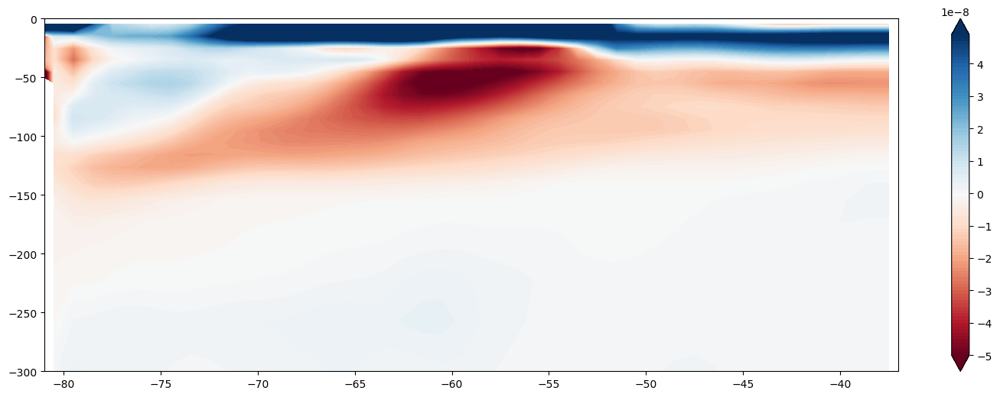

In [353]:
plt.figure(figsize=(18,6))
plt.contourf(ds.x,ds.depth,ds.isel(y=20).mean(dim='time').salt_diffusion_v.transpose(),cmap='RdBu',levels=np.arange(-(5*10**(-8)),5*10**(-8),0.000000001),extend='both')
plt.colorbar()
plt.xlim(-81,-37)
plt.ylim(-300,0)

(-500.0, 0.0)

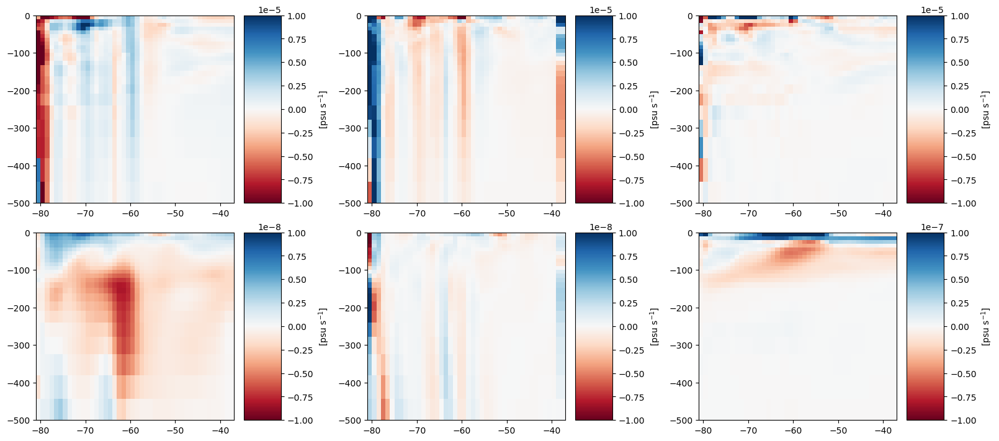

In [368]:
y=20


fig, ax = plt.subplots(2,3, figsize=(16,7), constrained_layout=True)

s=0.9

####################################################################################################################################################
vmax = 1*10**(-5)
im = ax[0,0].pcolormesh(ds.x,ds.depth,ds.isel(y=y).mean(dim='time').salt_advection_x.transpose(),cmap='RdBu',vmin=-vmax,vmax=vmax)
plt.colorbar(im,ax=ax[0,0],aspect=5,fraction=0.4,label='[psu s$^{-1}$]')
ax[0,0].set_xlim(-81,-37)
ax[0,0].set_ylim(-500,0)
####################################################################################################################################################

####################################################################################################################################################
vmax = 1*10**(-5)
im = ax[0,1].pcolormesh(ds.x,ds.depth,ds.isel(y=y).mean(dim='time').salt_advection_y.transpose(),cmap='RdBu',vmin=-vmax,vmax=vmax)
plt.colorbar(im,ax=ax[0,1],aspect=5,fraction=0.4,label='[psu s$^{-1}$]')
ax[0,1].set_xlim(-81,-37)
ax[0,1].set_ylim(-500,0)
####################################################################################################################################################

####################################################################################################################################################
vmax = 1*10**(-5)
im = ax[0,2].pcolormesh(ds.x,ds.depth,ds.isel(y=y).mean(dim='time').salt_advection_v.transpose(),cmap='RdBu',vmin=-vmax,vmax=vmax)
plt.colorbar(im,ax=ax[0,2],aspect=5,fraction=0.4,label='[psu s$^{-1}$]')
ax[0,2].set_xlim(-81,-37)
ax[0,2].set_ylim(-500,0)
####################################################################################################################################################
####################################################################################################################################################
vmax = 1*10**(-8)
im = ax[1,0].pcolormesh(ds.x,ds.depth,ds.isel(y=y).mean(dim='time').salt_diffusion_x.transpose(),cmap='RdBu',vmin=-vmax,vmax=vmax)
plt.colorbar(im,ax=ax[1,0],aspect=5,fraction=0.4,label='[psu s$^{-1}$]')
ax[1,0].set_xlim(-81,-37)
ax[1,0].set_ylim(-500,0)
####################################################################################################################################################

####################################################################################################################################################
vmax = 1*10**(-8)
im = ax[1,1].pcolormesh(ds.x,ds.depth,ds.isel(y=y).mean(dim='time').salt_diffusion_y.transpose(),cmap='RdBu',vmin=-vmax,vmax=vmax)
plt.colorbar(im,ax=ax[1,1],aspect=5,fraction=0.4,label='[psu s$^{-1}$]')
ax[1,1].set_xlim(-81,-37)
ax[1,1].set_ylim(-500,0)
####################################################################################################################################################

####################################################################################################################################################
vmax = 1*10**(-7)
im = ax[1,2].pcolormesh(ds.x,ds.depth,ds.isel(y=y).mean(dim='time').salt_diffusion_v.transpose(),cmap='RdBu',vmin=-vmax,vmax=vmax)
plt.colorbar(im,ax=ax[1,2],aspect=5,fraction=0.4,label='[psu s$^{-1}$]')
ax[1,2].set_xlim(-81,-37)
ax[1,2].set_ylim(-500,0)
####################################################################################################################################################

#    plt.suptitle('ECCO Salt Budget Terms at %s m'%(ds.depth.values[k]), fontsize=16)



Text(0.5, 1.0, 'Vertical Salt Diffusion')

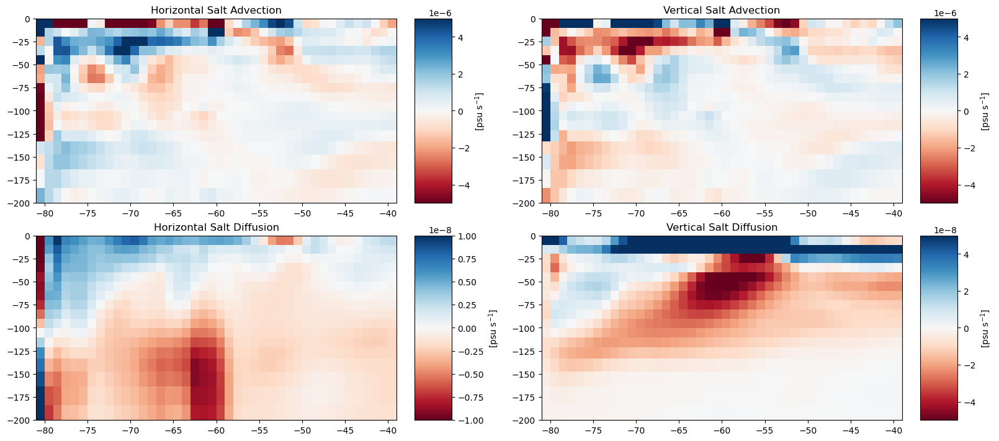

In [412]:
y=20


fig, ax = plt.subplots(2,2, figsize=(16,7), constrained_layout=True)

s=0.9

####################################################################################################################################################
vmax = 5*10**(-6)

tot_horiz_advec = ds.isel(y=y).mean(dim='time').salt_advection_x.transpose()+ds.isel(y=y).mean(dim='time').salt_advection_y.transpose()
im = ax[0,0].pcolormesh(ds.x,ds.depth,tot_horiz_advec,cmap='RdBu',vmin=-vmax,vmax=vmax)
plt.colorbar(im,ax=ax[0,0],aspect=5,fraction=0.4,label='[psu s$^{-1}$]')
ax[0,0].set_xlim(-81,-39)
#ax[0,0].set_ylim(-500,0)
ax[0,0].set_ylim(-200,0)
ax[0,0].set_title('Horizontal Salt Advection')
####################################################################################################################################################

####################################################################################################################################################
vmax = 5*10**(-6)
im = ax[0,1].pcolormesh(ds.x,ds.depth,ds.isel(y=y).mean(dim='time').salt_advection_v.transpose(),cmap='RdBu',vmin=-vmax,vmax=vmax)
plt.colorbar(im,ax=ax[0,1],aspect=5,fraction=0.4,label='[psu s$^{-1}$]')
ax[0,1].set_xlim(-81,-39)
#ax[0,1].set_ylim(-500,0)
ax[0,1].set_ylim(-200,0)
ax[0,1].set_title('Vertical Salt Advection')
####################################################################################################################################################


####################################################################################################################################################
vmax = 1*10**(-8)
tot_horiz_diff = ds.isel(y=y).mean(dim='time').salt_diffusion_x.transpose()+ds.isel(y=y).mean(dim='time').salt_diffusion_y.transpose()
im = ax[1,0].pcolormesh(ds.x,ds.depth,tot_horiz_diff,cmap='RdBu',vmin=-vmax,vmax=vmax)
plt.colorbar(im,ax=ax[1,0],aspect=5,fraction=0.4,label='[psu s$^{-1}$]')
ax[1,0].set_xlim(-81,-39)
#ax[1,0].set_ylim(-500,0)
ax[1,0].set_ylim(-200,0)
ax[1,0].set_title('Horizontal Salt Diffusion')
####################################################################################################################################################

####################################################################################################################################################
vmax = 5*10**(-8)
im = ax[1,1].pcolormesh(ds.x,ds.depth,ds.isel(y=y).mean(dim='time').salt_diffusion_v.transpose(),cmap='RdBu',vmin=-vmax,vmax=vmax)
plt.colorbar(im,ax=ax[1,1],aspect=5,fraction=0.4,label='[psu s$^{-1}$]')
ax[1,1].set_xlim(-81,-39)
#ax[1,1].set_ylim(-500,0)
ax[1,1].set_ylim(-200,0)
ax[1,1].set_title('Vertical Salt Diffusion')
####################################################################################################################################################

#    plt.suptitle('ECCO Salt Budget Terms at %s m'%(ds.depth.values[k]), fontsize=16)



In [129]:
carib_ds

<xarray.Dataset>
Dimensions:                   (x: 28, y: 14, time: 4747, depth: 23)
Coordinates:
  * x                         (x) float64 -87.5 -86.5 -85.5 ... -61.5 -60.5
  * y                         (y) float64 9.5 10.5 11.5 12.5 ... 20.5 21.5 22.5
  * time                      (time) datetime64[ns] 2005-01-01T12:00:00 ... 2...
  * depth                     (depth) float32 -5.0 -15.0 -25.0 ... -409.9 -477.5
    spatial_ref               int64 0
Data variables: (12/23)
    temp_tendency             (y, x, depth, time) float64 nan nan ... nan nan
    temp_advection_x          (y, x, depth, time) float64 nan nan ... nan nan
    temp_advection_y          (y, x, depth, time) float64 nan nan ... nan nan
    temp_advection_v          (y, x, depth, time) float64 nan nan ... nan nan
    temp_diffusion_x          (y, x, depth, time) float64 nan nan ... nan nan
    temp_diffusion_y          (y, x, depth, time) float64 nan nan ... nan nan
    ...                        ...
    salt                      (y, x, depth, time) float64 nan nan ... nan nan
    SWpen                     (y, x, depth, time) float64 nan nan ... nan nan
    Qnet                      (y, x, depth, time) float64 nan nan ... nan nan
    absolute_salinity         (y, x, depth, time) float64 nan nan ... nan nan
    conservative_temperature  (y, x, depth, time) float64 nan nan ... nan nan
    salinity_max_depth        (y, x, time) float32 nan nan nan ... nan nan nan

/var/folders/m9/d8bbz1wx4f50q99kfb1jv9pw0000gn/T/ipykernel_53981/907283427.py:7: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = matplotlib.cm.get_cmap('cmo.thermal')
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


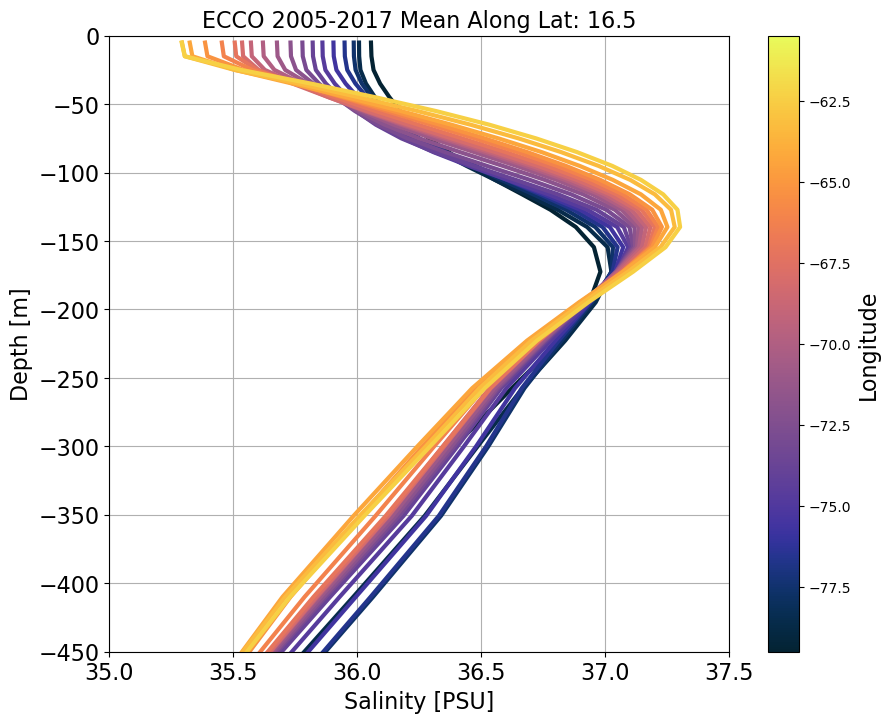

In [140]:
import matplotlib

font_size=16

plot_inds = np.arange(8,28,1)

cmap = matplotlib.cm.get_cmap('cmo.thermal')
inds = np.arange(0,1.1,1/len(plot_inds))

fig, ax = plt.subplots(figsize=(10,8))
for x in np.arange(0,len(plot_inds)):
    meh = ax.plot(carib_ds.isel(x=plot_inds[x],y=7).absolute_salinity.mean(dim=['time']),carib_ds.depth,color=cmap(inds[x]),linewidth=3)

# Add a colorbar
norm = plt.Normalize(carib_ds.x[plot_inds].values[0],carib_ds.x[plot_inds].values[-1])
sm = plt.cm.ScalarMappable(cmap=cmo.thermal, norm=norm)
sm.set_array([])
cbar = plt.colorbar(sm, ax=ax)
cbar.set_label('Longitude',fontsize=font_size)

ax.set_ylim(-450,0)
ax.set_xlim(35,37.5)
ax.set_xlabel('Salinity [PSU]',size=font_size)
ax.set_ylabel('Depth [m]',size=font_size)
ax.legend(loc='lower right',markerscale=1.5,frameon=False, fontsize=font_size)
ax.tick_params(axis='both', which='major', labelsize=font_size)
ax.grid()
ax.set_title(f'ECCO 2005-2017 Mean Along Lat: {ds.y[21].values}', fontsize=font_size)
plt.savefig('/Users/joegradone/SynologyDrive/Drive/Rutgers/Research/figures/Python/Model/ECCO/ECCO_Salinity_16N_Colored_Profiles_CARIB.png', bbox_inches='tight',dpi=300,facecolor='white')




In [141]:
# import matplotlib

# font_size=16

# plot_inds = np.arange(20,50,2)

# cmap = matplotlib.cm.get_cmap('cmo.thermal')
# inds = np.arange(0,1.1,1/len(plot_inds))

# fig, ax = plt.subplots(figsize=(10,8))
# for x in np.arange(0,len(plot_inds)):
#     meh = ax.plot(ds.isel(x=plot_inds[x],y=21).salt.mean(dim=['time']),ds.depth,color=cmap(inds[x]),linewidth=3)

# # Add a colorbar
# norm = plt.Normalize(ds.x[plot_inds].values[0],ds.x[plot_inds].values[-1])
# sm = plt.cm.ScalarMappable(cmap=cmo.thermal, norm=norm)
# sm.set_array([])
# cbar = plt.colorbar(sm, ax=ax)
# cbar.set_label('Longitude')

# ax.set_ylim(-450,0)
# ax.set_xlim(35,37.25)
# ax.set_xlabel('Salinity [PSU]',size=fontsize)
# ax.set_ylabel('Depth [m]',size=fontsize)
# ax.legend(loc='lower right',markerscale=1.5,frameon=False, fontsize=font_size)
# ax.tick_params(axis='both', which='major', labelsize=fontsize)
# ax.grid()
# ax.set_title(f'ECCO 2005-2017 Mean Along Lat: {ds.y[21].values}', fontsize=font_size)
# plt.savefig('/Users/joegradone/SynologyDrive/Drive/Rutgers/Research/figures/Python/Model/ECCO/ECCO_Salinity_16N_Colored_Profiles.png', bbox_inches='tight',dpi=300,facecolor='white')




/var/folders/m9/d8bbz1wx4f50q99kfb1jv9pw0000gn/T/ipykernel_36850/3744561898.py:9: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = matplotlib.cm.get_cmap('cmo.thermal')


Text(0.5, 1.0, 'ECCO 2005-2017 Mean Along Lat: 16.5')

<Figure size 1000x1000 with 0 Axes>

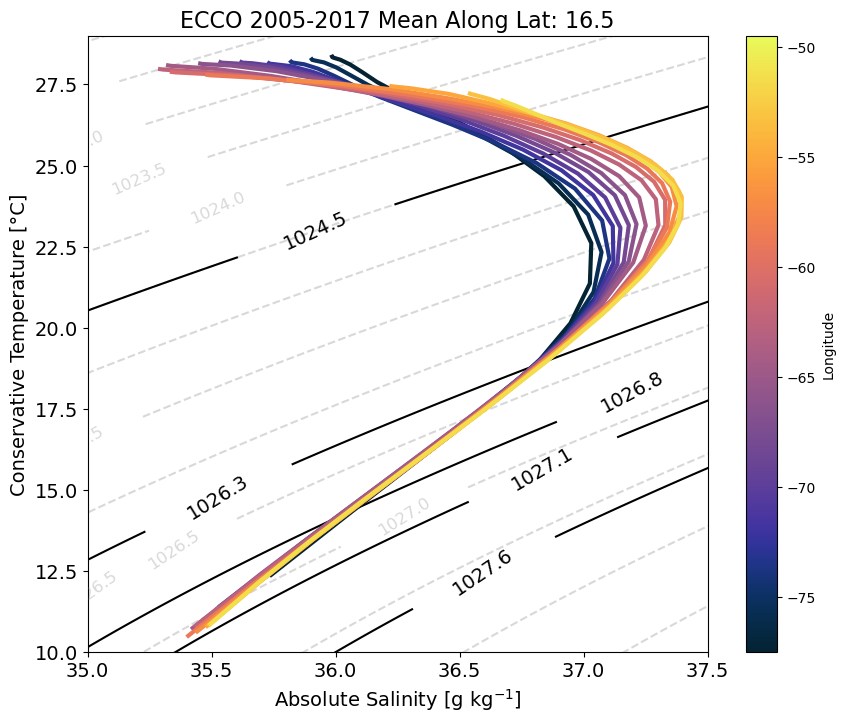

In [944]:
plt.figure(figsize=(10,10))



font_size=16

plot_inds = np.arange(20,50,2)

cmap = matplotlib.cm.get_cmap('cmo.thermal')
inds = np.arange(0,1.1,1/len(plot_inds))

fig, ax = plt.subplots(figsize=(10,8))
for x in np.arange(0,len(plot_inds)):
    new_salt = ds.isel(x=plot_inds[x],y=21).salt.mean(dim=['time'])
    new_temp = ds.isel(x=plot_inds[x],y=21).temp.mean(dim=['time'])
    
    p = gsw.p_from_z(new_salt.depth.values,new_salt.y.values)
    AS = gsw.SA_from_SP(new_salt, p, new_salt.x.values, new_salt.y.values)  
    CT = gsw.CT_from_pt(AS, new_temp)
    
    meh = ax.plot(AS,CT,color=cmap(inds[x]),linewidth=3)


# Add a colorbar
norm = plt.Normalize(ds.x[plot_inds].values[0],ds.x[plot_inds].values[-1])
sm = plt.cm.ScalarMappable(cmap=cmo.thermal, norm=norm)
sm.set_array([])
cbar = plt.colorbar(sm, ax=ax)
cbar.set_label('Longitude')



######## This plots the contours
mint=1
maxt=30
mins=34
maxs=37.5
n =499
tempL=np.linspace(mint-1,maxt+1,n)
salL=np.linspace(mins-1,maxs+1,n)
Tg, Sg = np.meshgrid(tempL,salL)

z=np.linspace(-1000,0,n)
p = gsw.p_from_z(z,lat=0)

sigma_theta = gsw.sigma0(Sg, Tg)+1000

cnt = np.linspace(sigma_theta.min(), sigma_theta.max(),n)
ind = np.argwhere(sigma_theta > 1015.7)
st_short = sigma_theta[ind]

## Thin bois
cs = plt.contour(Sg, Tg, sigma_theta, colors='grey', alpha=0.3,linestyles='dashed', zorder=1 ,levels=np.arange(1021,1030,0.5))
levels = cs.levels
manual_locations = [(0, 0), (0, 0),(0, 0), (34.75, 28),(34.8, 27.6), (35.25,24), (35.5, 24), (35, 25),(34.75, 17), (35, 16),(35.25,14), (0,0), (35,12),(0,0),(36.35,13.5), (0,0), (35.5,8),(35.75,6),(36.25,6),(36.75,5)]
plt.clabel(cs,levels, fontsize=12,inline=True,fmt='%.1f', manual=manual_locations)

## Thick bois
cs = plt.contour(Sg, Tg, sigma_theta, colors='black', zorder=1 ,levels=[1024.5,1026.3,1026.8,1027.1,1027.6])
levels = cs.levels
manual_locations = [(36, 22), (35.5, 15), (37.2,18), (36.9,15), (36.65,12)]
plt.clabel(cs,levels, fontsize=fontsize,inline=True,fmt='%.1f', manual=manual_locations)

plt.ylim(10,29)
plt.xlim(35,37.5)
plt.ylabel('Conservative Temperature [°C]',size=fontsize)
plt.xlabel('Absolute Salinity [g kg$^{-1}$]',size=fontsize)
plt.gca().tick_params(axis='both', which='major', labelsize=fontsize)
plt.title(f'ECCO 2005-2017 Mean Along Lat: {ds.y[21].values}', fontsize=font_size)


/var/folders/m9/d8bbz1wx4f50q99kfb1jv9pw0000gn/T/ipykernel_36850/3233117096.py:5: UserWarning: The following kwargs were not used by contour: 'linewidth'
  cs = plt.contour(ds.x,ds.depth,ds.isel(y=21).mean('time').salt.transpose(),np.arange(35.2,37.5,0.2),colors='black',linewidth=5)


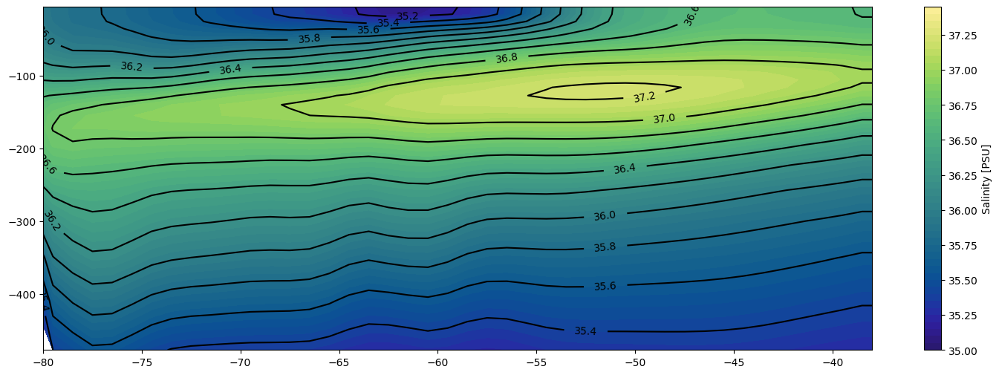

In [421]:

plt.figure(figsize=(18,6))
#ds.isel(y=21).mean('time').salt.transpose().plot(cmap=cmo.haline)
plt.contourf(ds.x,ds.depth,ds.isel(y=21).mean('time').salt.transpose(),cmap=cmo.haline,levels=np.arange(35,37.5,0.05))
plt.colorbar(label='Salinity [PSU]')
cs = plt.contour(ds.x,ds.depth,ds.isel(y=21).mean('time').salt.transpose(),np.arange(35.2,37.5,0.2),colors='black',linewidth=5)
plt.clabel(cs, inline=True, fontsize=10)
plt.xlim(-80,-38)
#plt.ylim(-300,0)
plt.savefig('/Users/joegradone/SynologyDrive/Drive/Rutgers/Research/figures/Python/Model/ECCO/ECCO_Salinity_16N_Slice.png', bbox_inches='tight',dpi=300,facecolor='white')


/Users/joegradone/anaconda3/envs/rutgers-phd/lib/python3.11/site-packages/cartopy/mpl/gridliner.py:451: UserWarning: The .xlabels_top attribute is deprecated. Please use .top_labels to toggle visibility instead.
  warnings.warn('The .xlabels_top attribute is deprecated. Please '
/Users/joegradone/anaconda3/envs/rutgers-phd/lib/python3.11/site-packages/cartopy/mpl/gridliner.py:487: UserWarning: The .ylabels_right attribute is deprecated. Please use .right_labels to toggle visibility instead.
  warnings.warn('The .ylabels_right attribute is deprecated. Please '
/Users/joegradone/anaconda3/envs/rutgers-phd/lib/python3.11/site-packages/cartopy/mpl/geoaxes.py:1604: UserWarning: The following kwargs were not used by contour: 'linewidth'
  result = super().contour(*args, **kwargs)


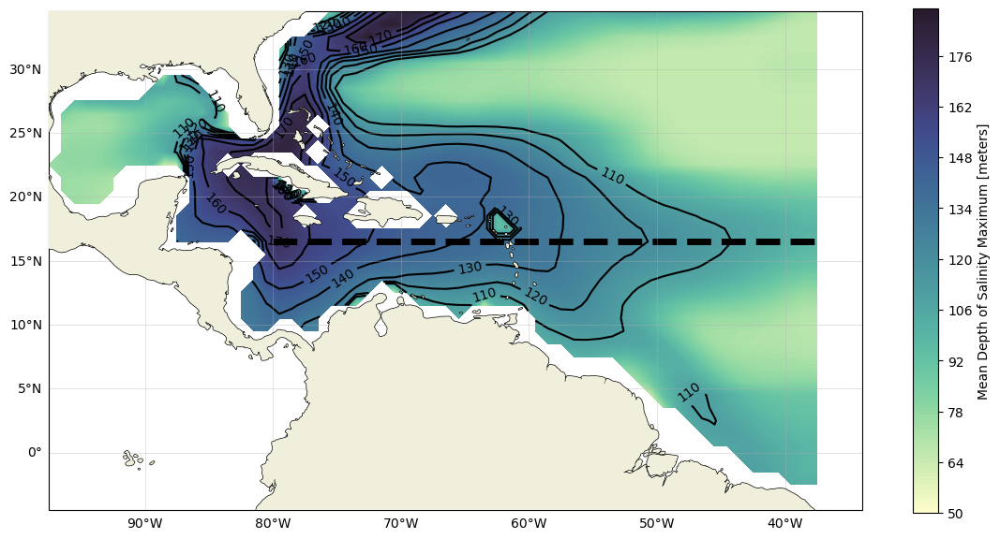

In [39]:

fig, ax = plt.subplots(figsize=(14,7),subplot_kw=dict(projection=cartopy.crs.PlateCarree()))

im = ax.contourf(lonmesh,latmesh,-ds.salinity_max_depth.mean(dim='time'),transform =cartopy.crs.PlateCarree(),cmap=cmo.deep,levels=np.arange(50,190,1))
plt.colorbar(im, ax=ax,label='Mean Depth of Salinity Maximum [meters]')
cs = plt.contour(lonmesh,latmesh,-ds.salinity_max_depth.mean(dim='time'),[110,120,130,140,150,160,170],colors='black',linewidth=5,transform =cartopy.crs.PlateCarree())
plt.clabel(cs, inline=True, fontsize=10)

ax.coastlines(linewidth=1.0,zorder=10)
ax.add_feature(cartopy.feature.LAND,zorder=10)
glb = ax.gridlines(draw_labels=True, alpha=0.5, linewidth=.5 )
glb.xlabels_top = glb.ylabels_right = False

plt.plot([-80, -37], [16.5, 16.5],'k--', linewidth=5,transform=cartopy.crs.PlateCarree())
plt.savefig('/Users/joegradone/SynologyDrive/Drive/Rutgers/Research/figures/Python/Model/ECCO/ECCO_Salinity_Max_Depth_Map.png', bbox_inches='tight',dpi=300,facecolor='white')


Text(0.5, 0, '[psu s$^{-1}$]')

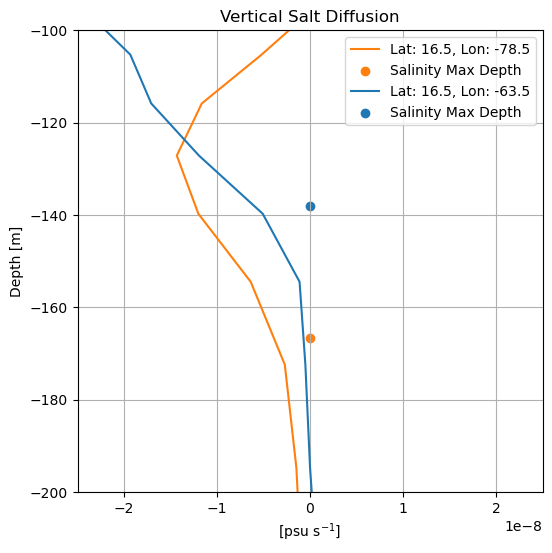

In [40]:
plt.figure(figsize=(6,6))
plt.plot(ds.isel(y=21,x=19).salt_diffusion_v.mean(dim='time'),ds.depth,color='tab:orange',label='Lat: 16.5, Lon: -78.5')
plt.scatter(0,ds.salinity_max_depth.isel(y=21,x=19).mean(dim='time'),color='tab:orange',label='Salinity Max Depth')

plt.plot(ds.isel(y=21,x=34).salt_diffusion_v.mean(dim='time'),ds.depth,color='tab:blue',label='Lat: 16.5, Lon: -63.5')
plt.scatter(0,ds.salinity_max_depth.isel(y=21,x=34).mean(dim='time'),color='tab:blue',label='Salinity Max Depth')

plt.grid()
plt.xlim(-0.000000025,0.000000025)
plt.ylim(-200,-100)
plt.legend()
plt.title('Vertical Salt Diffusion')
plt.ylabel('Depth [m]')
plt.xlabel('[psu s$^{-1}$]')


In [41]:
mean_ds = ds.isel(x=30,y=21).mean(dim='time')

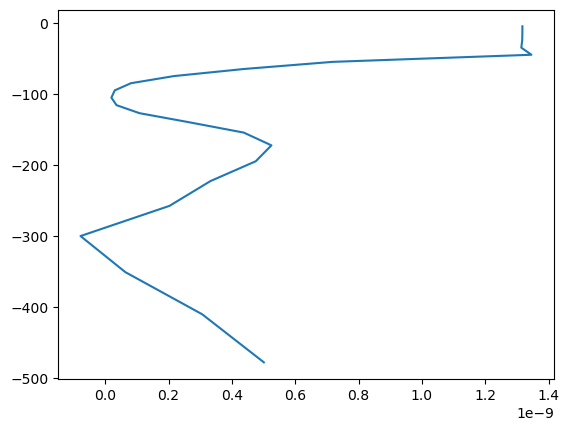

In [42]:
plt.plot(mean_ds.temp_tendency,ds.depth)

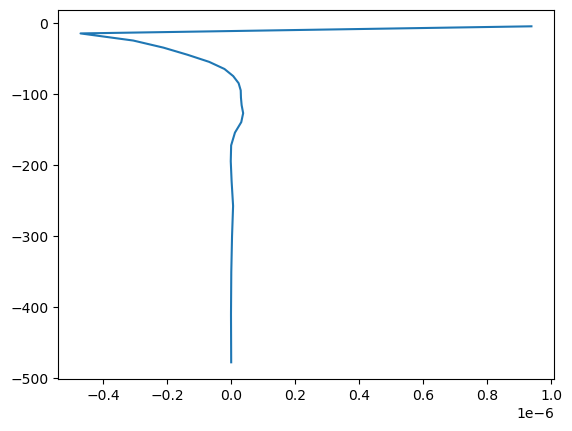

In [43]:
plt.plot(mean_ds.temp_diffusion_v,ds.depth)

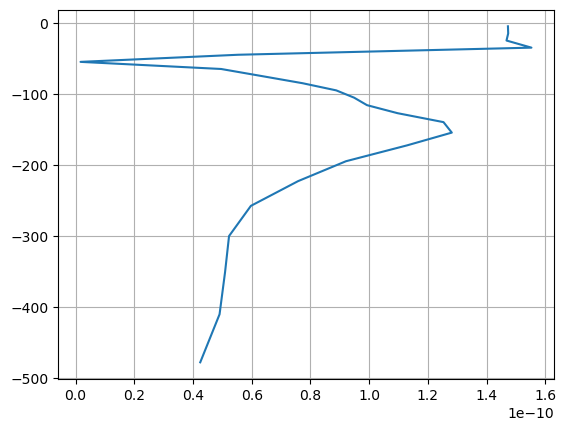

In [44]:
temp_ADV = (mean_ds.temp_advection_x+mean_ds.temp_advection_y+mean_ds.temp_advection_v)
temp_DIFF = (mean_ds.temp_diffusion_x+mean_ds.temp_diffusion_y+mean_ds.temp_diffusion_v)
RHS = temp_ADV+temp_DIFF+mean_ds.temp_forcing
temp_resid = mean_ds.temp_tendency-RHS

plt.plot(temp_resid,mean_ds.depth)
plt.grid()

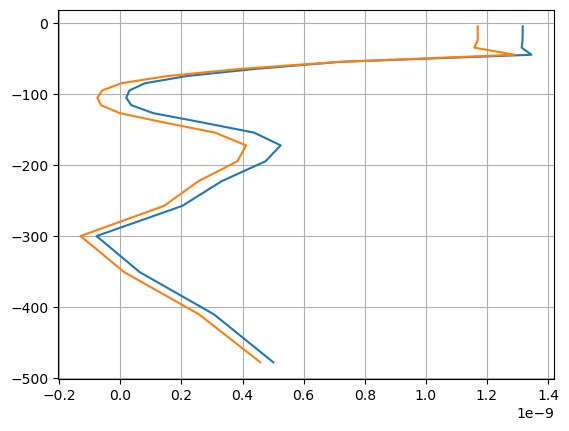

In [45]:
#plt.plot(temp_resid,mean_ds.depth)
plt.plot(mean_ds.temp_tendency,mean_ds.depth)
#plt.plot(mean_ds.temp_advection_x,mean_ds.depth)
plt.plot(RHS,mean_ds.depth)

#plt.xlim(-10,20)
plt.grid()

(-200.0, 0.0)

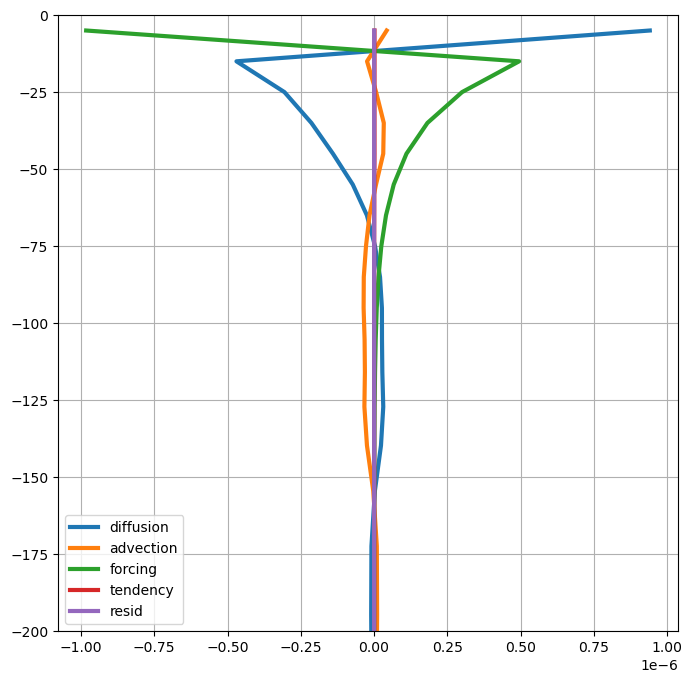

In [46]:
plt.figure(figsize=(8,8))
plt.plot(temp_DIFF,mean_ds.depth,linewidth=3,label='diffusion')
plt.plot(temp_ADV,mean_ds.depth,linewidth=3,label='advection')
plt.plot(mean_ds.temp_forcing,mean_ds.depth,linewidth=3,label='forcing')
plt.plot(mean_ds.temp_tendency,mean_ds.depth,linewidth=3,label='tendency')
plt.plot(temp_resid,mean_ds.depth,linewidth=3,label='resid')
plt.grid()
plt.legend()
plt.ylim(-200,0)

/var/folders/m9/d8bbz1wx4f50q99kfb1jv9pw0000gn/T/ipykernel_52638/3544966745.py:7: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = matplotlib.cm.get_cmap('cmo.thermal')
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


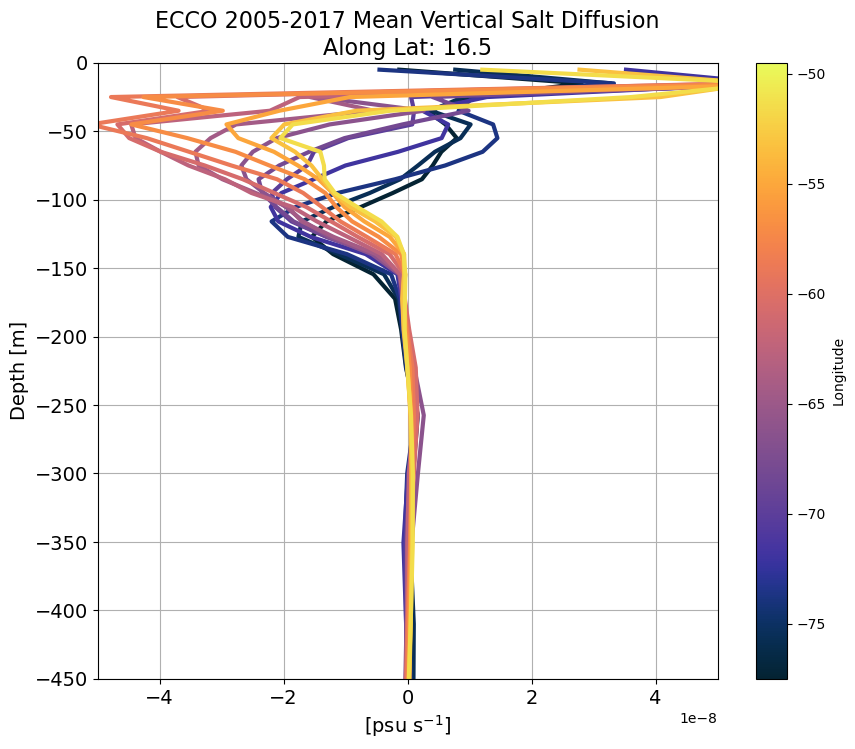

In [47]:
import matplotlib

font_size=16

plot_inds = np.arange(20,50,2)

cmap = matplotlib.cm.get_cmap('cmo.thermal')
inds = np.arange(0,1.1,1/len(plot_inds))

fig, ax = plt.subplots(figsize=(10,8))
for x in np.arange(0,len(plot_inds)):
    meh = ax.plot(ds.isel(x=plot_inds[x],y=21).salt_diffusion_v.mean(dim=['time']),ds.depth,color=cmap(inds[x]),linewidth=3)

# Add a colorbar
norm = plt.Normalize(ds.x[plot_inds].values[0],ds.x[plot_inds].values[-1])
sm = plt.cm.ScalarMappable(cmap=cmo.thermal, norm=norm)
sm.set_array([])
cbar = plt.colorbar(sm, ax=ax)
cbar.set_label('Longitude')

ax.set_xlim(-0.00000005,0.00000005)
ax.set_ylim(-450,0)
ax.set_xlabel('[psu s$^{-1}$]',size=fontsize)
ax.set_ylabel('Depth [m]',size=fontsize)
ax.legend(loc='lower right',markerscale=1.5,frameon=False, fontsize=font_size)
ax.tick_params(axis='both', which='major', labelsize=fontsize)
ax.grid()
ax.set_title(f'ECCO 2005-2017 Mean Vertical Salt Diffusion\nAlong Lat: {ds.y[21].values}', fontsize=font_size)
plt.savefig('/Users/joegradone/SynologyDrive/Drive/Rutgers/Research/figures/Python/Model/ECCO/ECCO_Vert_Salt_Diffusion_16N_Colored_Profiles.png', bbox_inches='tight',dpi=300,facecolor='white')




/var/folders/m9/d8bbz1wx4f50q99kfb1jv9pw0000gn/T/ipykernel_52638/143021996.py:7: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = matplotlib.cm.get_cmap('cmo.thermal')
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


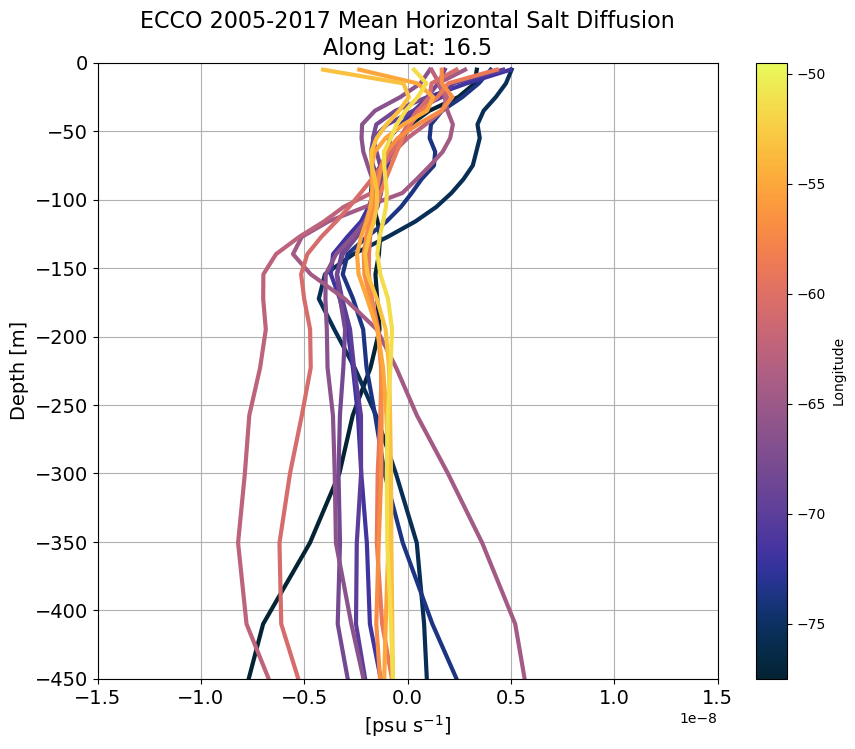

In [48]:
import matplotlib

font_size=16

plot_inds = np.arange(20,50,2)

cmap = matplotlib.cm.get_cmap('cmo.thermal')
inds = np.arange(0,1.1,1/len(plot_inds))

fig, ax = plt.subplots(figsize=(10,8))
for x in np.arange(0,len(plot_inds)):
    meh = ax.plot((ds.isel(x=plot_inds[x],y=21).salt_diffusion_x.mean(dim=['time'])+ds.isel(x=plot_inds[x],y=21).salt_diffusion_y.mean(dim=['time'])),ds.depth,color=cmap(inds[x]),linewidth=3)

# Add a colorbar
norm = plt.Normalize(ds.x[plot_inds].values[0],ds.x[plot_inds].values[-1])
sm = plt.cm.ScalarMappable(cmap=cmo.thermal, norm=norm)
sm.set_array([])
cbar = plt.colorbar(sm, ax=ax)
cbar.set_label('Longitude')

ax.set_xlim(-0.000000015,0.000000015)
ax.set_ylim(-450,0)
ax.set_xlabel('[psu s$^{-1}$]',size=fontsize)
ax.set_ylabel('Depth [m]',size=fontsize)
ax.legend(loc='lower right',markerscale=1.5,frameon=False, fontsize=font_size)
ax.tick_params(axis='both', which='major', labelsize=fontsize)
ax.grid()
ax.set_title(f'ECCO 2005-2017 Mean Horizontal Salt Diffusion\nAlong Lat: {ds.y[21].values}', fontsize=font_size)
plt.savefig('/Users/joegradone/SynologyDrive/Drive/Rutgers/Research/figures/Python/Model/ECCO/ECCO_Horiz_Salt_Diffusion_16N_Colored_Profiles.png', bbox_inches='tight',dpi=300,facecolor='white')




/var/folders/m9/d8bbz1wx4f50q99kfb1jv9pw0000gn/T/ipykernel_52638/3008709594.py:7: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = matplotlib.cm.get_cmap('cmo.thermal')
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


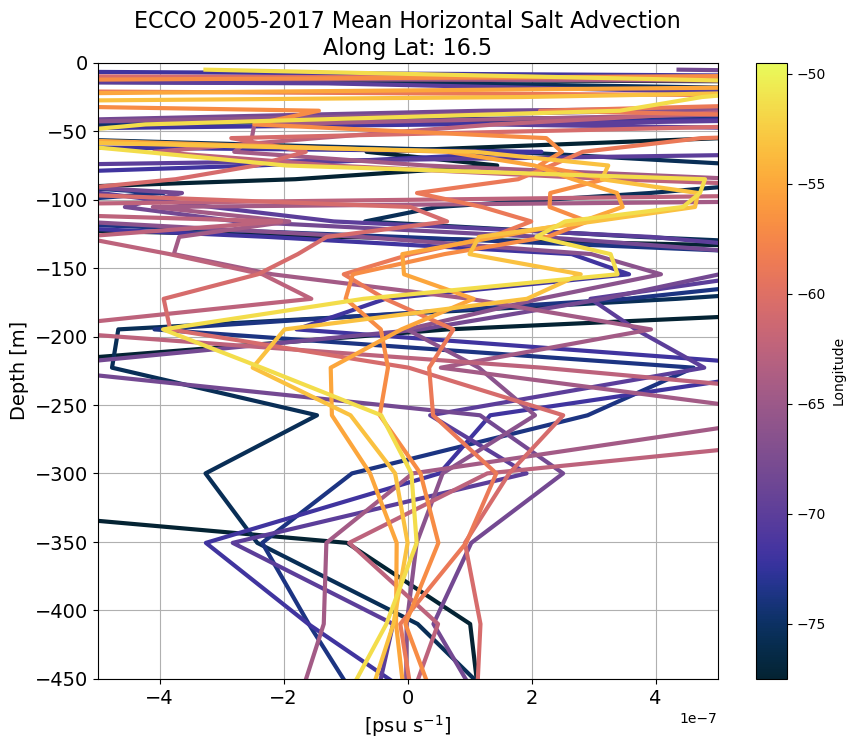

In [49]:
import matplotlib

font_size=16

plot_inds = np.arange(20,50,2)

cmap = matplotlib.cm.get_cmap('cmo.thermal')
inds = np.arange(0,1.1,1/len(plot_inds))

fig, ax = plt.subplots(figsize=(10,8))
for x in np.arange(0,len(plot_inds)):
    meh = ax.plot((ds.isel(x=plot_inds[x],y=21).salt_advection_x.mean(dim=['time'])+ds.isel(x=plot_inds[x],y=21).salt_advection_y.mean(dim=['time'])),ds.depth,color=cmap(inds[x]),linewidth=3)

# Add a colorbar
norm = plt.Normalize(ds.x[plot_inds].values[0],ds.x[plot_inds].values[-1])
sm = plt.cm.ScalarMappable(cmap=cmo.thermal, norm=norm)
sm.set_array([])
cbar = plt.colorbar(sm, ax=ax)
cbar.set_label('Longitude')

ax.set_xlim(-0.0000005,0.0000005)
ax.set_ylim(-450,0)
ax.set_xlabel('[psu s$^{-1}$]',size=fontsize)
ax.set_ylabel('Depth [m]',size=fontsize)
ax.legend(loc='lower right',markerscale=1.5,frameon=False, fontsize=font_size)
ax.tick_params(axis='both', which='major', labelsize=fontsize)
ax.grid()
ax.set_title(f'ECCO 2005-2017 Mean Horizontal Salt Advection\nAlong Lat: {ds.y[21].values}', fontsize=font_size)
plt.savefig('/Users/joegradone/SynologyDrive/Drive/Rutgers/Research/figures/Python/Model/ECCO/ECCO_Horiz_Salt_Advection_16N_Colored_Profiles.png', bbox_inches='tight',dpi=300,facecolor='white')




/var/folders/m9/d8bbz1wx4f50q99kfb1jv9pw0000gn/T/ipykernel_52638/455651068.py:7: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = matplotlib.cm.get_cmap('cmo.thermal')
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


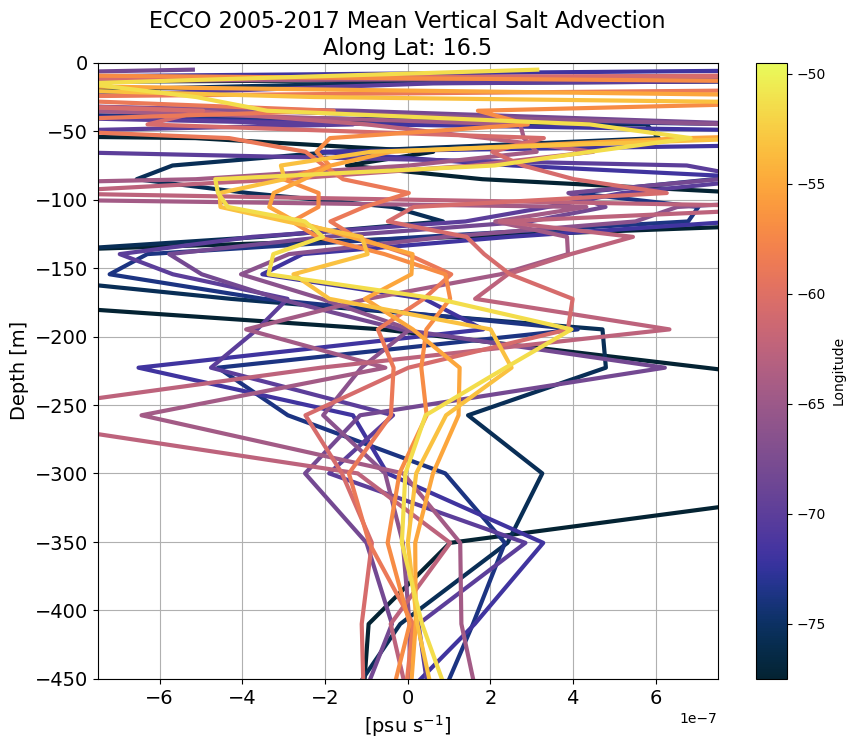

In [50]:
import matplotlib

font_size=16

plot_inds = np.arange(20,50,2)

cmap = matplotlib.cm.get_cmap('cmo.thermal')
inds = np.arange(0,1.1,1/len(plot_inds))

fig, ax = plt.subplots(figsize=(10,8))
for x in np.arange(0,len(plot_inds)):
    meh = ax.plot(ds.isel(x=plot_inds[x],y=21).salt_advection_v.mean(dim=['time']),ds.depth,color=cmap(inds[x]),linewidth=3)

# Add a colorbar
norm = plt.Normalize(ds.x[plot_inds].values[0],ds.x[plot_inds].values[-1])
sm = plt.cm.ScalarMappable(cmap=cmo.thermal, norm=norm)
sm.set_array([])
cbar = plt.colorbar(sm, ax=ax)
cbar.set_label('Longitude')

ax.set_xlim(-0.00000075,0.00000075)
ax.set_ylim(-450,0)
ax.set_xlabel('[psu s$^{-1}$]',size=fontsize)
ax.set_ylabel('Depth [m]',size=fontsize)
ax.legend(loc='lower right',markerscale=1.5,frameon=False, fontsize=font_size)
ax.tick_params(axis='both', which='major', labelsize=fontsize)
ax.grid()
ax.set_title(f'ECCO 2005-2017 Mean Vertical Salt Advection\nAlong Lat: {ds.y[21].values}', fontsize=font_size)
plt.savefig('/Users/joegradone/SynologyDrive/Drive/Rutgers/Research/figures/Python/Model/ECCO/ECCO_Vert_Salt_Advection_16N_Colored_Profiles.png', bbox_inches='tight',dpi=300,facecolor='white')




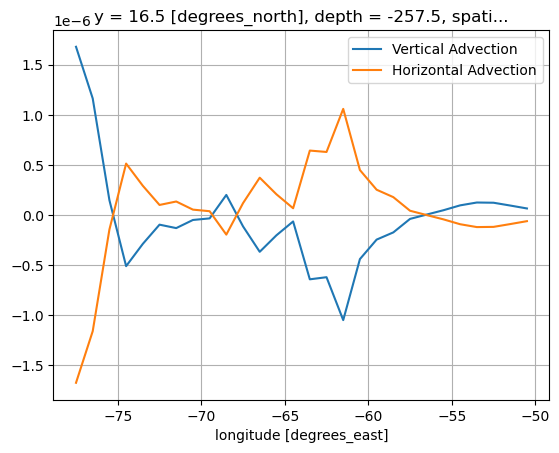

In [51]:
#ds.isel(depth=18)

ds.isel(x=slice(20,48),depth=18,y=21).mean(dim=['time']).salt_advection_v.plot(label='Vertical Advection')
(ds.isel(x=slice(20,48),depth=18,y=21).mean(dim=['time']).salt_advection_x+ds.isel(x=slice(20,48),depth=18,y=21).mean(dim=['time']).salt_advection_y).plot(label='Horizontal Advection')
plt.legend()
plt.grid()

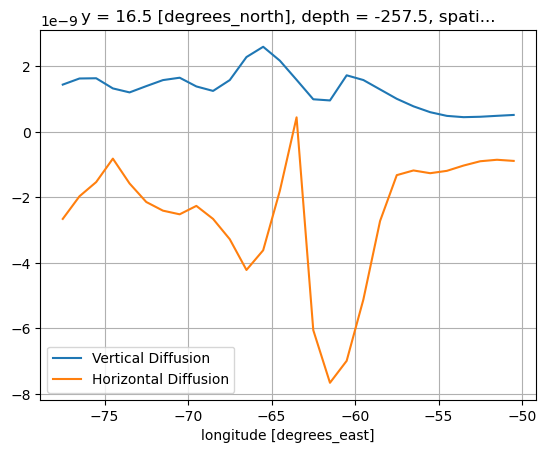

In [52]:
ds.isel(x=slice(20,48),depth=18,y=21).mean(dim=['time']).salt_diffusion_v.plot(label='Vertical Diffusion')
(ds.isel(x=slice(20,48),depth=18,y=21).mean(dim=['time']).salt_diffusion_x+ds.isel(x=slice(20,48),depth=18,y=21).mean(dim=['time']).salt_diffusion_y).plot(label='Horizontal Diffusion')
plt.legend()
plt.grid()

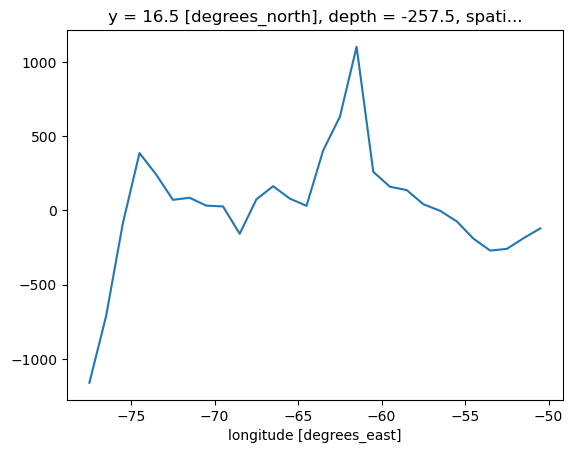

In [53]:
((ds.isel(x=slice(20,48),depth=18,y=21).mean(dim=['time']).salt_advection_x+ds.isel(x=slice(20,48),depth=18,y=21).mean(dim=['time']).salt_advection_y)/ds.isel(x=slice(20,48),depth=18,y=21).mean(dim=['time']).salt_diffusion_v).plot()


#plt.ylim(-0.1,0.1)



/Users/joegradone/anaconda3/envs/rutgers-phd/lib/python3.11/site-packages/cartopy/mpl/gridliner.py:451: UserWarning: The .xlabels_top attribute is deprecated. Please use .top_labels to toggle visibility instead.
  warnings.warn('The .xlabels_top attribute is deprecated. Please '
/Users/joegradone/anaconda3/envs/rutgers-phd/lib/python3.11/site-packages/cartopy/mpl/gridliner.py:487: UserWarning: The .ylabels_right attribute is deprecated. Please use .right_labels to toggle visibility instead.
  warnings.warn('The .ylabels_right attribute is deprecated. Please '
/Users/joegradone/anaconda3/envs/rutgers-phd/lib/python3.11/site-packages/cartopy/mpl/geoaxes.py:1604: UserWarning: The following kwargs were not used by contour: 'linewidth'
  result = super().contour(*args, **kwargs)


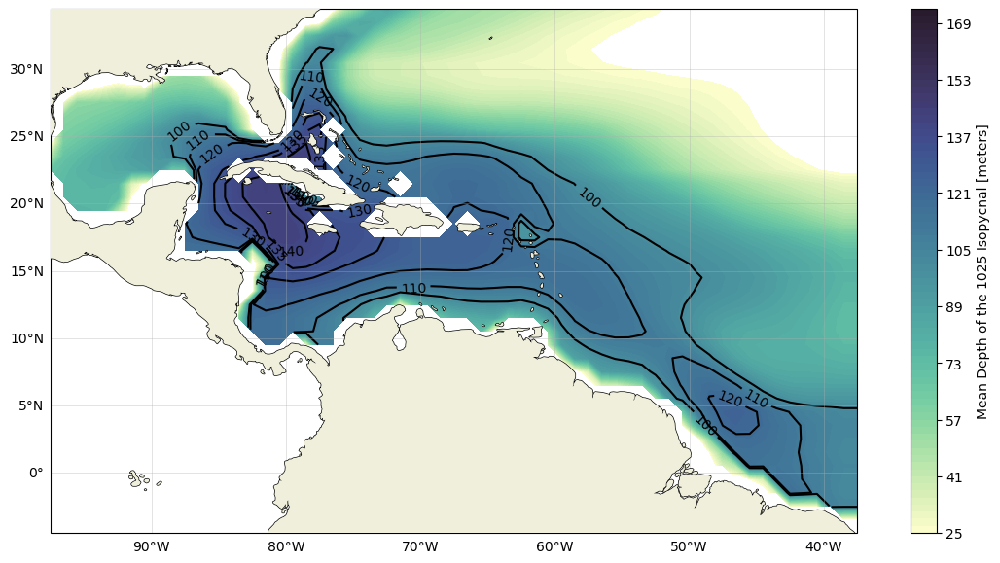

In [227]:
fig, ax = plt.subplots(figsize=(14,7),subplot_kw=dict(projection=cartopy.crs.PlateCarree()))

im = ax.contourf(lonmesh,latmesh,-np.abs(1025-ds.potential_density).idxmin(dim='depth').mean(dim='time'),transform =cartopy.crs.PlateCarree(),cmap=cmo.deep,levels=np.arange(25,175,2))
ax.coastlines(linewidth=1.0,zorder=10)
ax.add_feature(cartopy.feature.LAND,zorder=10)
plt.colorbar(im, ax=ax,label='Mean Depth of the 1025 Isopycnal [meters]')
glb = ax.gridlines(draw_labels=True, alpha=0.5, linewidth=.5 )
glb.xlabels_top = glb.ylabels_right = False

cs = plt.contour(lonmesh,latmesh,-np.abs(1025-ds.potential_density).idxmin(dim='depth').mean(dim='time'),[100,110,120,130,135,140,145,150,160,170],colors='black',linewidth=5,transform =cartopy.crs.PlateCarree())
plt.clabel(cs, inline=True, fontsize=10)

plt.savefig('/Users/joegradone/SynologyDrive/Drive/Rutgers/Research/figures/Python/Model/ECCO/ECCO_1025_25_Isopycnal_Depth_Map.png', bbox_inches='tight',dpi=300,facecolor='white')


(-80.0, -64.0)

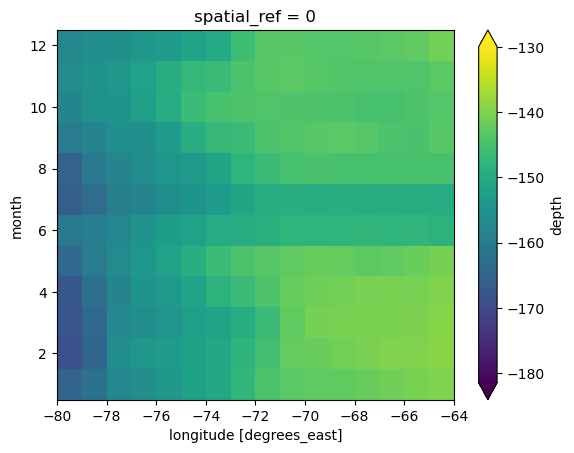

In [226]:
np.abs(1025.5-ds.potential_density).idxmin(dim='depth').groupby(ds.time.dt.month).mean().where(ds.y==16.5,drop=True).mean(dim='y').transpose().plot(vmin=-130,vmax=-165)
plt.xlim(-80,-64)

/Users/joegradone/anaconda3/envs/rutgers-phd/lib/python3.11/site-packages/cartopy/mpl/gridliner.py:451: UserWarning: The .xlabels_top attribute is deprecated. Please use .top_labels to toggle visibility instead.
  warnings.warn('The .xlabels_top attribute is deprecated. Please '
/Users/joegradone/anaconda3/envs/rutgers-phd/lib/python3.11/site-packages/cartopy/mpl/gridliner.py:487: UserWarning: The .ylabels_right attribute is deprecated. Please use .right_labels to toggle visibility instead.
  warnings.warn('The .ylabels_right attribute is deprecated. Please '
/Users/joegradone/anaconda3/envs/rutgers-phd/lib/python3.11/site-packages/cartopy/mpl/geoaxes.py:1604: UserWarning: The following kwargs were not used by contour: 'linewidth'
  result = super().contour(*args, **kwargs)


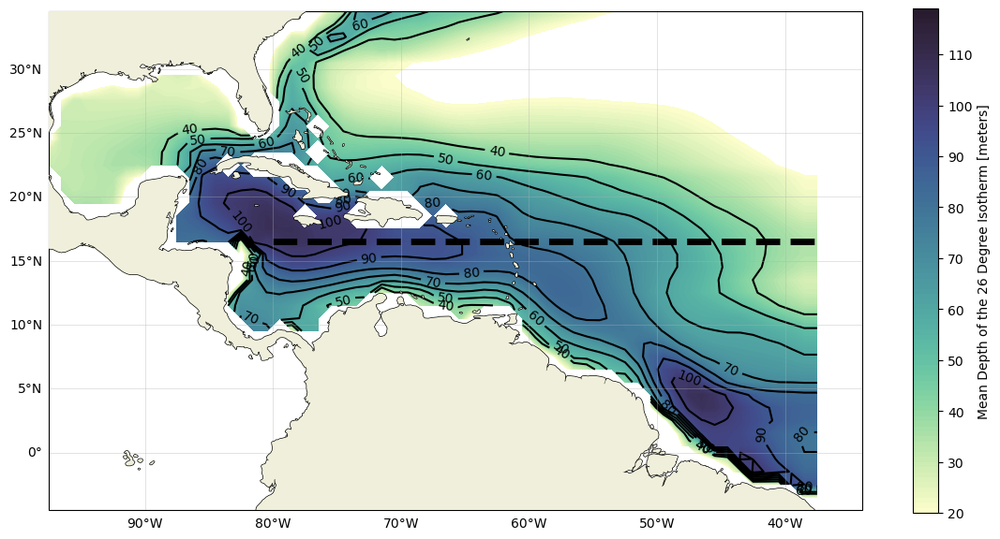

In [56]:



fig, ax = plt.subplots(figsize=(14,7),subplot_kw=dict(projection=cartopy.crs.PlateCarree()))

im = ax.contourf(lonmesh,latmesh,-np.abs(26-ds.temp).idxmin(dim='depth').mean(dim='time'),transform =cartopy.crs.PlateCarree(),cmap=cmo.deep,levels=np.arange(20,120,1))
ax.coastlines(linewidth=1.0,zorder=10)
ax.add_feature(cartopy.feature.LAND,zorder=10)
plt.colorbar(im, ax=ax,label='Mean Depth of the 26 Degree Isotherm [meters]')
glb = ax.gridlines(draw_labels=True, alpha=0.5, linewidth=.5 )
glb.xlabels_top = glb.ylabels_right = False

cs = plt.contour(lonmesh,latmesh,-np.abs(26-ds.temp).idxmin(dim='depth').mean(dim='time'),[40,50,60,70,80,90,100],colors='black',linewidth=5,transform =cartopy.crs.PlateCarree())
plt.clabel(cs, inline=True, fontsize=10)

plt.plot([-80, -37], [16.5, 16.5],'k--', linewidth=5,transform=cartopy.crs.PlateCarree())
plt.savefig('/Users/joegradone/SynologyDrive/Drive/Rutgers/Research/figures/Python/Model/ECCO/ECCO_26_Deg_Isotherm_Depth_Map.png', bbox_inches='tight',dpi=300,facecolor='white')


/var/folders/m9/d8bbz1wx4f50q99kfb1jv9pw0000gn/T/ipykernel_52638/725501559.py:7: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = matplotlib.cm.get_cmap('cmo.thermal')
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


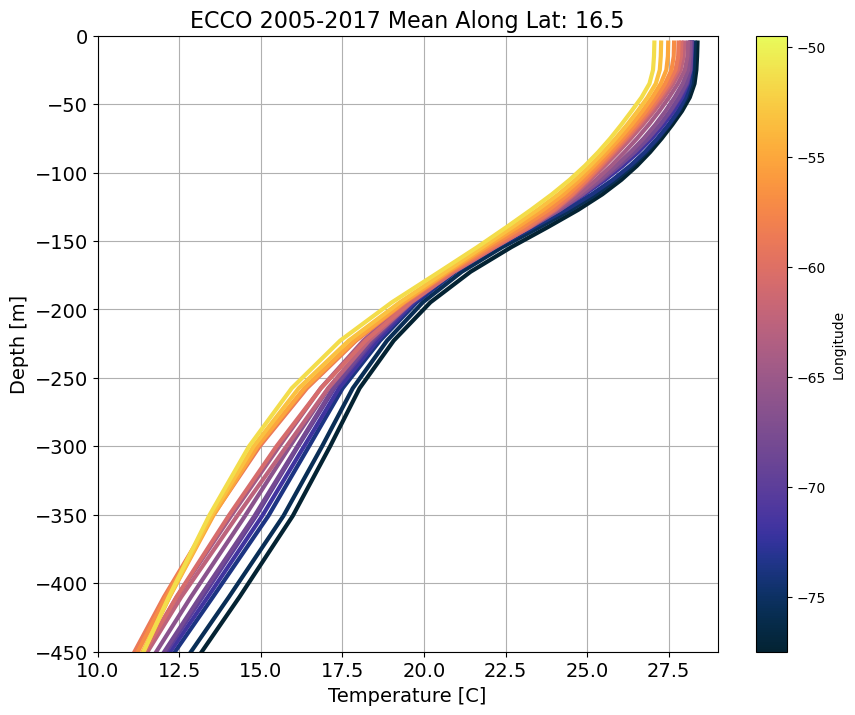

In [57]:
import matplotlib

font_size=16

plot_inds = np.arange(20,50,2)

cmap = matplotlib.cm.get_cmap('cmo.thermal')
inds = np.arange(0,1.1,1/len(plot_inds))

fig, ax = plt.subplots(figsize=(10,8))
for x in np.arange(0,len(plot_inds)):
    meh = ax.plot(ds.isel(x=plot_inds[x],y=21).temp.mean(dim=['time']),ds.depth,color=cmap(inds[x]),linewidth=3)

# Add a colorbar
norm = plt.Normalize(ds.x[plot_inds].values[0],ds.x[plot_inds].values[-1])
sm = plt.cm.ScalarMappable(cmap=cmo.thermal, norm=norm)
sm.set_array([])
cbar = plt.colorbar(sm, ax=ax)
cbar.set_label('Longitude')

ax.set_ylim(-450,0)
ax.set_xlim(10,29)
ax.set_xlabel('Temperature [C]',size=fontsize)
ax.set_ylabel('Depth [m]',size=fontsize)
ax.legend(loc='lower right',markerscale=1.5,frameon=False, fontsize=font_size)
ax.tick_params(axis='both', which='major', labelsize=fontsize)
ax.grid()
ax.set_title(f'ECCO 2005-2017 Mean Along Lat: {ds.y[21].values}', fontsize=font_size)
plt.savefig('/Users/joegradone/SynologyDrive/Drive/Rutgers/Research/figures/Python/Model/ECCO/ECCO_Temperature_16N_Colored_Profiles.png', bbox_inches='tight',dpi=300,facecolor='white')




/var/folders/m9/d8bbz1wx4f50q99kfb1jv9pw0000gn/T/ipykernel_52638/1953702918.py:7: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = matplotlib.cm.get_cmap('cmo.thermal')
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


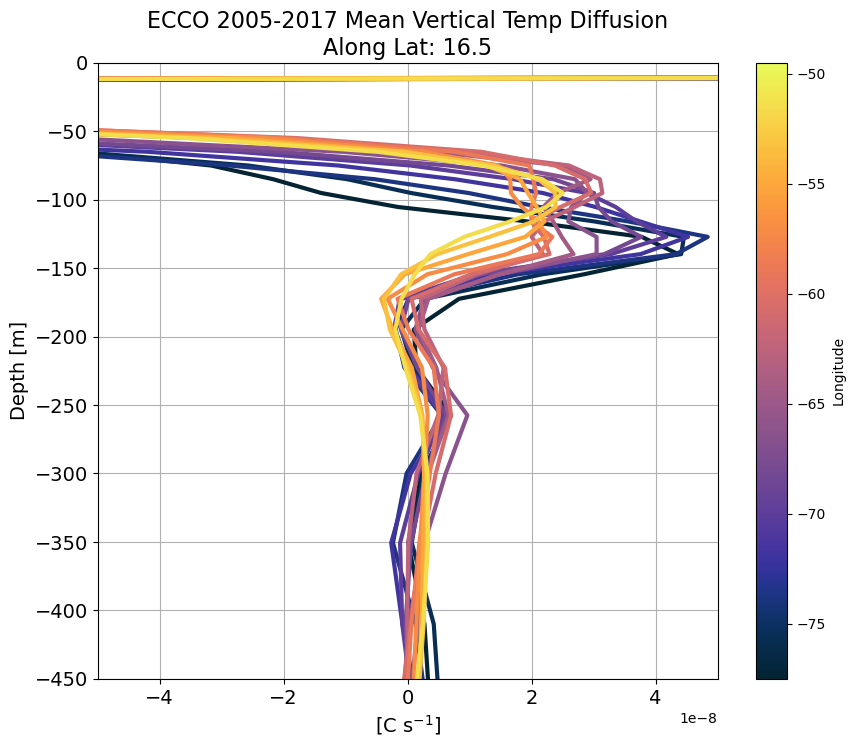

In [58]:
import matplotlib

font_size=16

plot_inds = np.arange(20,50,2)

cmap = matplotlib.cm.get_cmap('cmo.thermal')
inds = np.arange(0,1.1,1/len(plot_inds))

fig, ax = plt.subplots(figsize=(10,8))
for x in np.arange(0,len(plot_inds)):
    meh = ax.plot(ds.isel(x=plot_inds[x],y=21).temp_diffusion_v.mean(dim=['time']),ds.depth,color=cmap(inds[x]),linewidth=3)

# Add a colorbar
norm = plt.Normalize(ds.x[plot_inds].values[0],ds.x[plot_inds].values[-1])
sm = plt.cm.ScalarMappable(cmap=cmo.thermal, norm=norm)
sm.set_array([])
cbar = plt.colorbar(sm, ax=ax)
cbar.set_label('Longitude')

ax.set_xlim(-0.00000005,0.00000005)
ax.set_ylim(-450,0)
ax.set_xlabel('[C s$^{-1}$]',size=fontsize)
ax.set_ylabel('Depth [m]',size=fontsize)
ax.legend(loc='lower right',markerscale=1.5,frameon=False, fontsize=font_size)
ax.tick_params(axis='both', which='major', labelsize=fontsize)
ax.grid()
ax.set_title(f'ECCO 2005-2017 Mean Vertical Temp Diffusion\nAlong Lat: {ds.y[21].values}', fontsize=font_size)
plt.savefig('/Users/joegradone/SynologyDrive/Drive/Rutgers/Research/figures/Python/Model/ECCO/ECCO_Vert_Temp_Diffusion_16N_Colored_Profiles.png', bbox_inches='tight',dpi=300,facecolor='white')




/var/folders/m9/d8bbz1wx4f50q99kfb1jv9pw0000gn/T/ipykernel_52638/4246999393.py:7: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = matplotlib.cm.get_cmap('cmo.thermal')
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


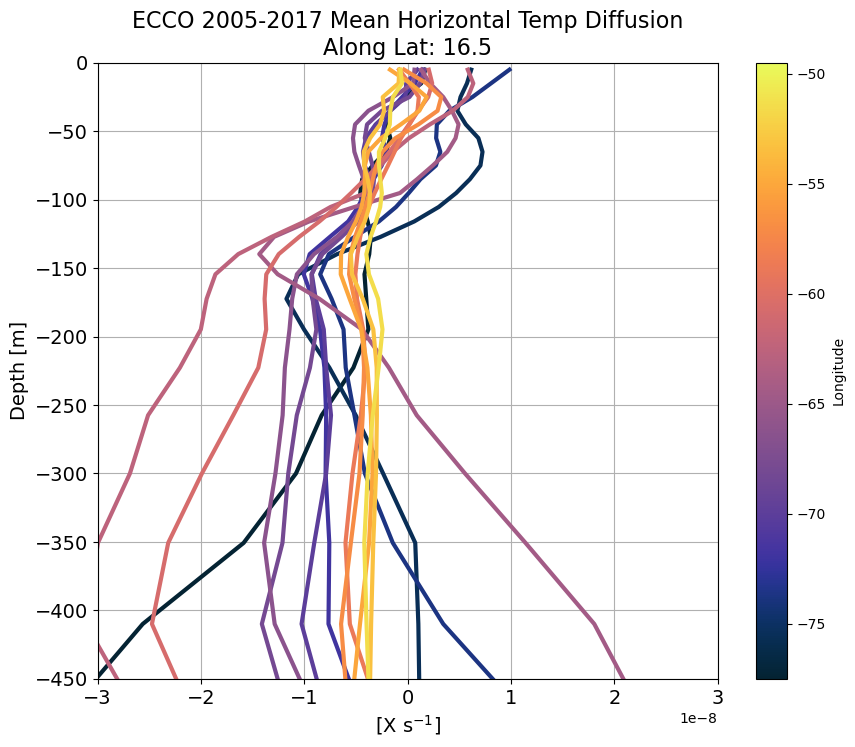

In [59]:
import matplotlib

font_size=16

plot_inds = np.arange(20,50,2)

cmap = matplotlib.cm.get_cmap('cmo.thermal')
inds = np.arange(0,1.1,1/len(plot_inds))

fig, ax = plt.subplots(figsize=(10,8))
for x in np.arange(0,len(plot_inds)):
    meh = ax.plot((ds.isel(x=plot_inds[x],y=21).temp_diffusion_x.mean(dim=['time'])+ds.isel(x=plot_inds[x],y=21).temp_diffusion_y.mean(dim=['time'])),ds.depth,color=cmap(inds[x]),linewidth=3)

# Add a colorbar
norm = plt.Normalize(ds.x[plot_inds].values[0],ds.x[plot_inds].values[-1])
sm = plt.cm.ScalarMappable(cmap=cmo.thermal, norm=norm)
sm.set_array([])
cbar = plt.colorbar(sm, ax=ax)
cbar.set_label('Longitude')

ax.set_xlim(-0.00000003,0.00000003)
ax.set_ylim(-450,0)
ax.set_xlabel('[X s$^{-1}$]',size=fontsize)
ax.set_ylabel('Depth [m]',size=fontsize)
ax.legend(loc='lower right',markerscale=1.5,frameon=False, fontsize=font_size)
ax.tick_params(axis='both', which='major', labelsize=fontsize)
ax.grid()
ax.set_title(f'ECCO 2005-2017 Mean Horizontal Temp Diffusion\nAlong Lat: {ds.y[21].values}', fontsize=font_size)
plt.savefig('/Users/joegradone/SynologyDrive/Drive/Rutgers/Research/figures/Python/Model/ECCO/ECCO_Horiz_Temp_Diffusion_16N_Colored_Profiles.png', bbox_inches='tight',dpi=300,facecolor='white')




/var/folders/m9/d8bbz1wx4f50q99kfb1jv9pw0000gn/T/ipykernel_52638/2593747244.py:7: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = matplotlib.cm.get_cmap('cmo.thermal')
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


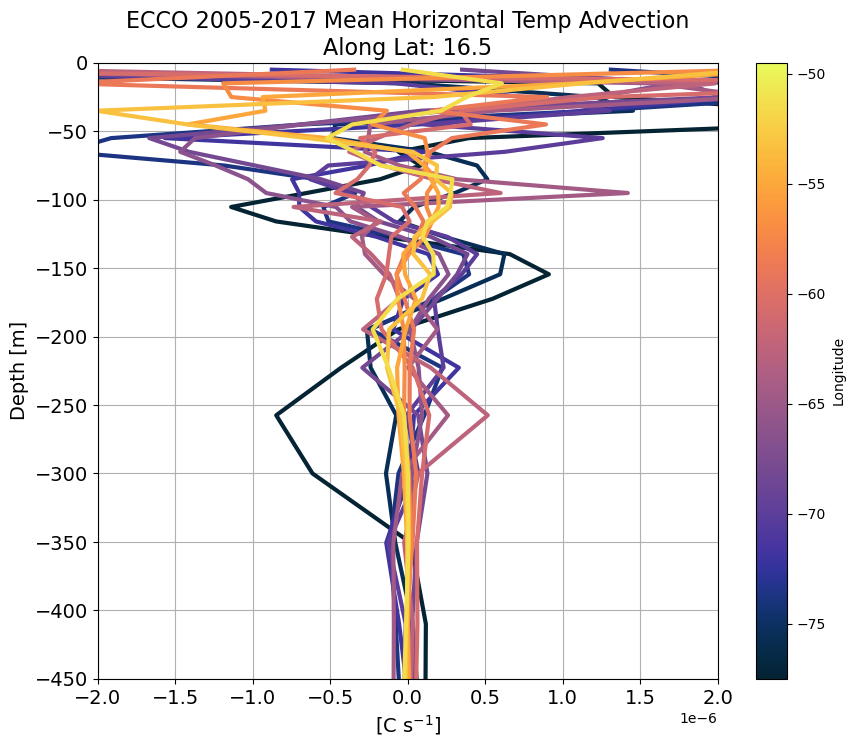

In [60]:
import matplotlib

font_size=16

plot_inds = np.arange(20,50,2)

cmap = matplotlib.cm.get_cmap('cmo.thermal')
inds = np.arange(0,1.1,1/len(plot_inds))

fig, ax = plt.subplots(figsize=(10,8))
for x in np.arange(0,len(plot_inds)):
    meh = ax.plot((ds.isel(x=plot_inds[x],y=21).temp_advection_x.mean(dim=['time'])+ds.isel(x=plot_inds[x],y=21).temp_advection_y.mean(dim=['time'])),ds.depth,color=cmap(inds[x]),linewidth=3)

# Add a colorbar
norm = plt.Normalize(ds.x[plot_inds].values[0],ds.x[plot_inds].values[-1])
sm = plt.cm.ScalarMappable(cmap=cmo.thermal, norm=norm)
sm.set_array([])
cbar = plt.colorbar(sm, ax=ax)
cbar.set_label('Longitude')

ax.set_xlim(-0.000002,0.000002)
ax.set_ylim(-450,0)
ax.set_xlabel('[C s$^{-1}$]',size=fontsize)
ax.set_ylabel('Depth [m]',size=fontsize)
ax.legend(loc='lower right',markerscale=1.5,frameon=False, fontsize=font_size)
ax.tick_params(axis='both', which='major', labelsize=fontsize)
ax.grid()
ax.set_title(f'ECCO 2005-2017 Mean Horizontal Temp Advection\nAlong Lat: {ds.y[21].values}', fontsize=font_size)
plt.savefig('/Users/joegradone/SynologyDrive/Drive/Rutgers/Research/figures/Python/Model/ECCO/ECCO_Horiz_Temp_Advection_16N_Colored_Profiles.png', bbox_inches='tight',dpi=300,facecolor='white')




/var/folders/m9/d8bbz1wx4f50q99kfb1jv9pw0000gn/T/ipykernel_52638/3719219034.py:7: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = matplotlib.cm.get_cmap('cmo.thermal')
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


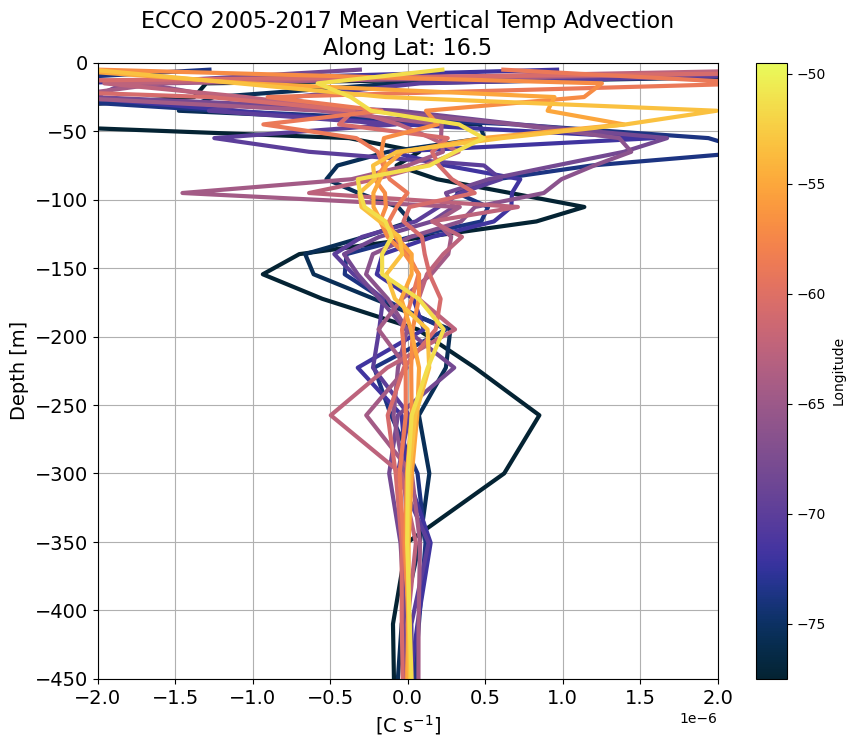

In [61]:
import matplotlib

font_size=16

plot_inds = np.arange(20,50,2)

cmap = matplotlib.cm.get_cmap('cmo.thermal')
inds = np.arange(0,1.1,1/len(plot_inds))

fig, ax = plt.subplots(figsize=(10,8))
for x in np.arange(0,len(plot_inds)):
    meh = ax.plot(ds.isel(x=plot_inds[x],y=21).temp_advection_v.mean(dim=['time']),ds.depth,color=cmap(inds[x]),linewidth=3)

# Add a colorbar
norm = plt.Normalize(ds.x[plot_inds].values[0],ds.x[plot_inds].values[-1])
sm = plt.cm.ScalarMappable(cmap=cmo.thermal, norm=norm)
sm.set_array([])
cbar = plt.colorbar(sm, ax=ax)
cbar.set_label('Longitude')

ax.set_xlim(-0.000002,0.000002)
ax.set_ylim(-450,0)
ax.set_xlabel('[C s$^{-1}$]',size=fontsize)
ax.set_ylabel('Depth [m]',size=fontsize)
ax.legend(loc='lower right',markerscale=1.5,frameon=False, fontsize=font_size)
ax.tick_params(axis='both', which='major', labelsize=fontsize)
ax.grid()
ax.set_title(f'ECCO 2005-2017 Mean Vertical Temp Advection\nAlong Lat: {ds.y[21].values}', fontsize=font_size)
plt.savefig('/Users/joegradone/SynologyDrive/Drive/Rutgers/Research/figures/Python/Model/ECCO/ECCO_Vert_Temp_Advection_16N_Colored_Profiles.png', bbox_inches='tight',dpi=300,facecolor='white')




/var/folders/m9/d8bbz1wx4f50q99kfb1jv9pw0000gn/T/ipykernel_52638/1435972960.py:7: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = matplotlib.cm.get_cmap('cmo.thermal')
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


Text(0.5, 1.0, 'ECCO 2005-2017 Mean Vertical Salinity Gradient\nAlong Lat: 16.5')

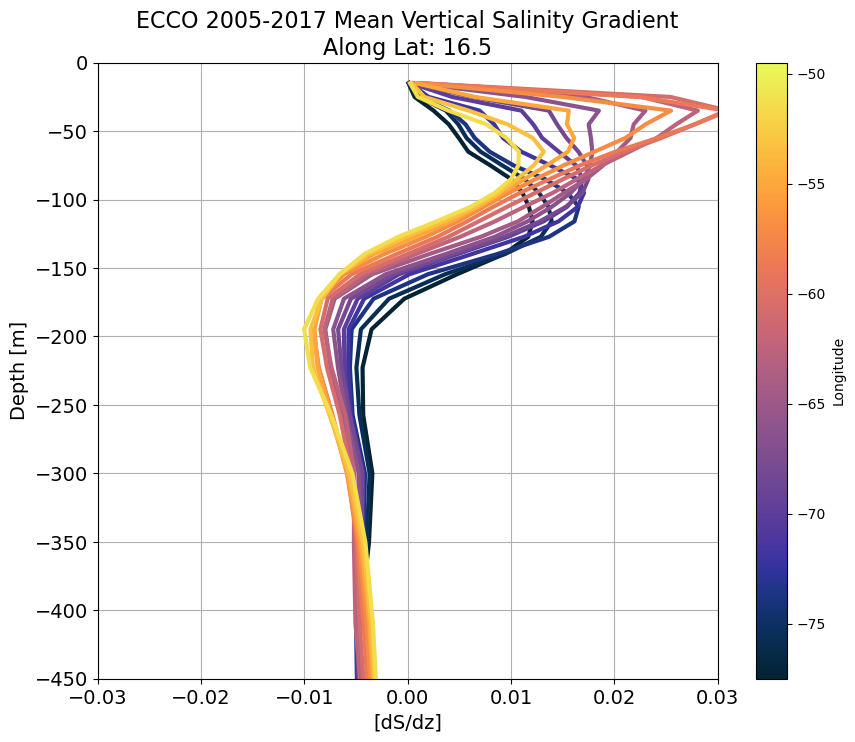

In [62]:

import matplotlib

font_size=16

plot_inds = np.arange(20,50,2)

cmap = matplotlib.cm.get_cmap('cmo.thermal')
inds = np.arange(0,1.1,1/len(plot_inds))

fig, ax = plt.subplots(figsize=(10,8))
for x in np.arange(0,len(plot_inds)):
    meh = ax.plot(np.diff(ds.isel(x=plot_inds[x],y=21).salt.mean(dim=['time']))/-np.diff(ds.depth),ds.depth[1:],color=cmap(inds[x]),linewidth=3)

# Add a colorbar
norm = plt.Normalize(ds.x[plot_inds].values[0],ds.x[plot_inds].values[-1])
sm = plt.cm.ScalarMappable(cmap=cmo.thermal, norm=norm)
sm.set_array([])
cbar = plt.colorbar(sm, ax=ax)
cbar.set_label('Longitude')


ax.set_xlim(-0.03,0.03)
ax.set_ylim(-450,0)
ax.set_xlabel('[dS/dz]',size=fontsize)
ax.set_ylabel('Depth [m]',size=fontsize)
ax.legend(loc='lower right',markerscale=1.5,frameon=False, fontsize=font_size)
ax.tick_params(axis='both', which='major', labelsize=fontsize)
ax.grid()
ax.set_title(f'ECCO 2005-2017 Mean Vertical Salinity Gradient\nAlong Lat: {ds.y[21].values}', fontsize=font_size)





## Slices across Caribbean

In [98]:
#wline = ds.isel(x=14,y=slice(21,27))
eline = ds.isel(x=28,y=slice(17,23))
#test = ds.isel(x=11,y=slice(21,27))
test = ds.isel(x=38,y=slice(13,27))

/Users/joegradone/anaconda3/envs/rutgers-phd/lib/python3.11/site-packages/cartopy/mpl/gridliner.py:451: UserWarning: The .xlabels_top attribute is deprecated. Please use .top_labels to toggle visibility instead.
  warnings.warn('The .xlabels_top attribute is deprecated. Please '
/Users/joegradone/anaconda3/envs/rutgers-phd/lib/python3.11/site-packages/cartopy/mpl/gridliner.py:487: UserWarning: The .ylabels_right attribute is deprecated. Please use .right_labels to toggle visibility instead.
  warnings.warn('The .ylabels_right attribute is deprecated. Please '
/Users/joegradone/anaconda3/envs/rutgers-phd/lib/python3.11/site-packages/cartopy/mpl/geoaxes.py:1604: UserWarning: The following kwargs were not used by contour: 'linewidth'
  result = super().contour(*args, **kwargs)


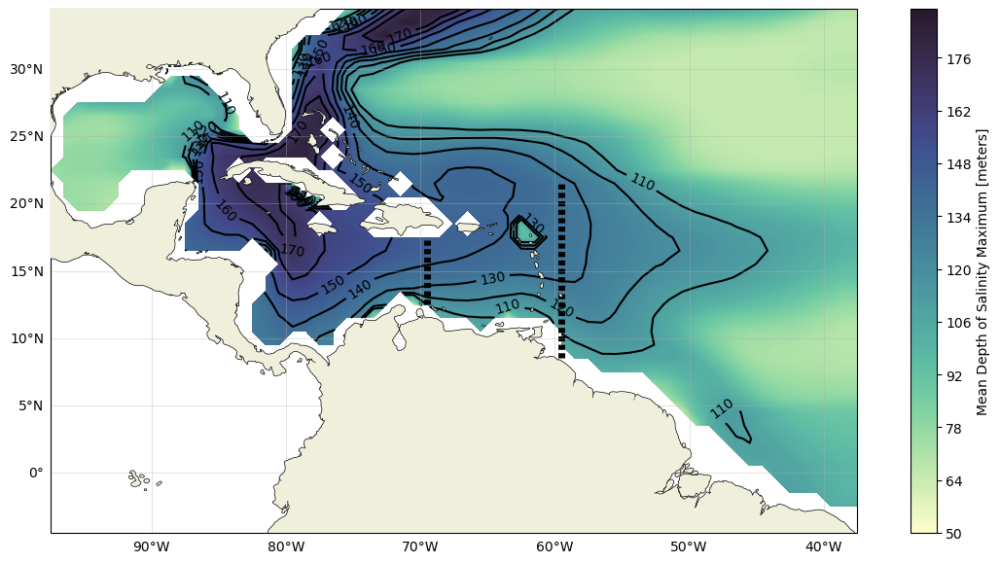

In [99]:



fig, ax = plt.subplots(figsize=(14,7),subplot_kw=dict(projection=cartopy.crs.PlateCarree()))

im = ax.contourf(lonmesh,latmesh,-ds.salinity_max_depth.mean(dim='time'),transform =cartopy.crs.PlateCarree(),cmap=cmo.deep,levels=np.arange(50,190,1))
ax.coastlines(linewidth=1.0,zorder=10)
ax.add_feature(cartopy.feature.LAND,zorder=10)
plt.colorbar(im, ax=ax,label='Mean Depth of Salinity Maximum [meters]')
glb = ax.gridlines(draw_labels=True, alpha=0.5, linewidth=.5 )
glb.xlabels_top = glb.ylabels_right = False

cs = plt.contour(lonmesh,latmesh,-ds.salinity_max_depth.mean(dim='time'),[110,120,130,140,150,160,170],colors='black',linewidth=5,transform =cartopy.crs.PlateCarree())
plt.clabel(cs, inline=True, fontsize=10)

#plt.plot([wline.x.values, wline.x.values], [wline.y.values[0], wline.y.values[-1]],color='black',linestyle='--', dashes=(0.75, 0.5),linewidth=5,transform=cartopy.crs.PlateCarree())
plt.plot([eline.x.values, eline.x.values], [eline.y.values[0], eline.y.values[-1]],color='black',linestyle='--', dashes=(0.75, 0.5), linewidth=5,transform=cartopy.crs.PlateCarree())
plt.plot([test.x.values, test.x.values], [test.y.values[0], test.y.values[-1]],color='black',linestyle='--', dashes=(0.75, 0.5), linewidth=5,transform=cartopy.crs.PlateCarree())




In [132]:
carib_ds

<xarray.Dataset>
Dimensions:             (x: 28, y: 14, time: 4747, depth: 23)
Coordinates:
  * x                   (x) float64 -87.5 -86.5 -85.5 ... -62.5 -61.5 -60.5
  * y                   (y) float64 9.5 10.5 11.5 12.5 ... 19.5 20.5 21.5 22.5
  * time                (time) datetime64[ns] 2005-01-01T12:00:00 ... 2017-12...
  * depth               (depth) float32 -5.0 -15.0 -25.0 ... -409.9 -477.5
    spatial_ref         int64 0
Data variables: (12/21)
    temp_tendency       (y, x, depth, time) float64 nan nan nan ... nan nan nan
    temp_advection_x    (y, x, depth, time) float64 nan nan nan ... nan nan nan
    temp_advection_y    (y, x, depth, time) float64 nan nan nan ... nan nan nan
    temp_advection_v    (y, x, depth, time) float64 nan nan nan ... nan nan nan
    temp_diffusion_x    (y, x, depth, time) float64 nan nan nan ... nan nan nan
    temp_diffusion_y    (y, x, depth, time) float64 nan nan nan ... nan nan nan
    ...                  ...
    salt_diffusion_v    (y, x, depth, time) float64 nan nan nan ... nan nan nan
    salt_forcing        (y, x, depth, time) float64 nan nan nan ... nan nan nan
    salt                (y, x, depth, time) float64 nan nan nan ... nan nan nan
    SWpen               (y, x, depth, time) float64 nan nan nan ... nan nan nan
    Qnet                (y, x, depth, time) float64 nan nan nan ... nan nan nan
    salinity_max_depth  (y, x, time) float32 nan nan nan nan ... nan nan nan nan

/Users/joegradone/anaconda3/envs/rutgers-phd/lib/python3.11/site-packages/cartopy/mpl/gridliner.py:451: UserWarning: The .xlabels_top attribute is deprecated. Please use .top_labels to toggle visibility instead.
  warnings.warn('The .xlabels_top attribute is deprecated. Please '
/Users/joegradone/anaconda3/envs/rutgers-phd/lib/python3.11/site-packages/cartopy/mpl/gridliner.py:487: UserWarning: The .ylabels_right attribute is deprecated. Please use .right_labels to toggle visibility instead.
  warnings.warn('The .ylabels_right attribute is deprecated. Please '


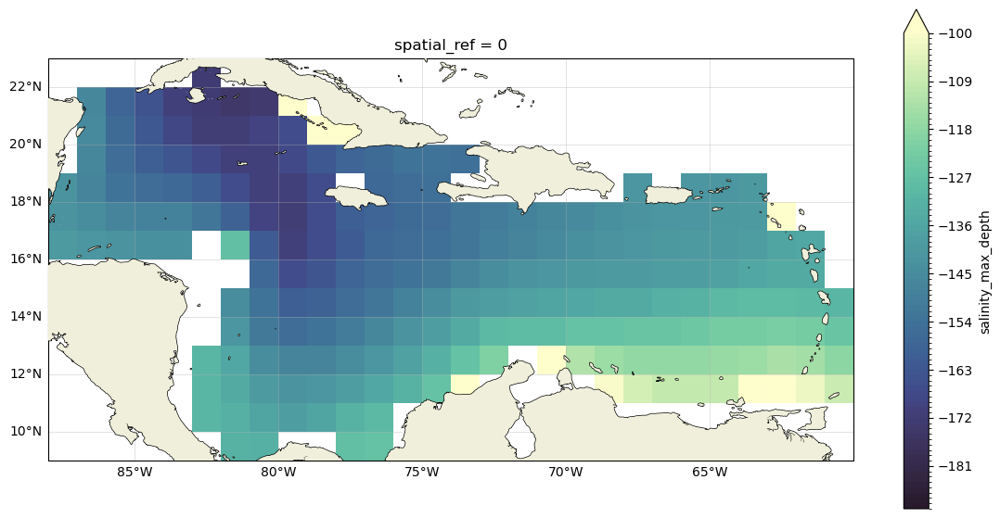

In [144]:


fig, ax = plt.subplots(figsize=(14,7),subplot_kw=dict(projection=cartopy.crs.PlateCarree()))

#im = ax.contourf(lonmesh_carib,latmesh_carib,-carib_ds.salinity_max_depth.mean(dim='time'),transform =cartopy.crs.PlateCarree(),cmap=cmo.deep,levels=np.arange(50,190,1))
ax.coastlines(linewidth=1.0,zorder=10)
ax.add_feature(cartopy.feature.LAND,zorder=10)
glb = ax.gridlines(draw_labels=True, alpha=0.5, linewidth=.5 )
glb.xlabels_top = glb.ylabels_right = False

# cs = plt.contour(lonmesh,latmesh,-ds.salinity_max_depth.mean(dim='time'),[110,120,130,140,150,160,170],colors='black',linewidth=5,transform =cartopy.crs.PlateCarree())
# plt.clabel(cs, inline=True, fontsize=10)

carib_ds.salinity_max_depth.mean(dim='time').plot(transform =cartopy.crs.PlateCarree(),cmap=cmo.deep_r,levels=-np.arange(100,190,1))



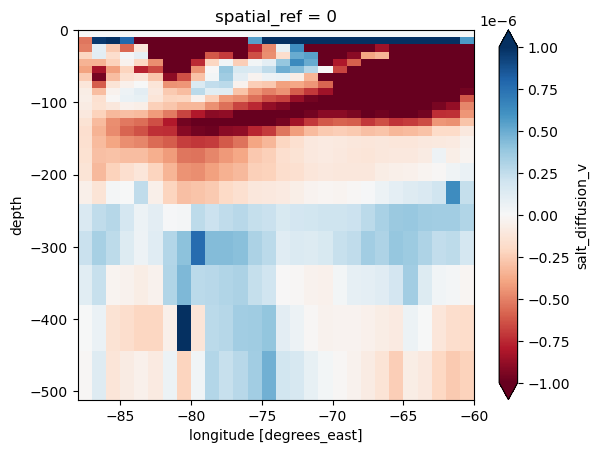

In [123]:
vmax = 0.000001
vmin = -vmax

(carib_ds.salt_diffusion_v.mean(dim='time').sum(dim='y')*depth_grid).transpose().plot(vmin=vmin,vmax=vmax,cmap='RdBu')


/Users/joegradone/anaconda3/envs/rutgers-phd/lib/python3.11/site-packages/numpy/core/fromnumeric.py:88: RuntimeWarning: invalid value encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)


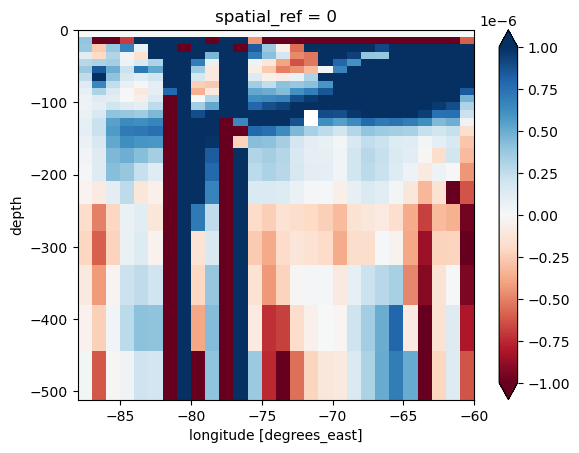

In [177]:
vmax = 0.000001
vmin = -vmax

((carib_ds.salt_advection_x.mean(dim='time').sum(dim='y')*depth_grid)+(carib_ds.salt_advection_y.mean(dim='time').sum(dim='y')*depth_grid)+(carib_ds.salt_advection_v.mean(dim='time').sum(dim='y')*depth_grid)).transpose().plot(vmin=vmin,vmax=vmax,cmap='RdBu')


# Balance Metric

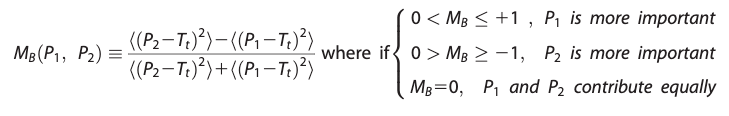

In [207]:
def calc_MB(Tt,P1,P2):
    P2Tt = ((P2-Tt)**2).mean(dim='time')
    P1Tt = ((P1-Tt)**2).mean(dim='time')

    return (P2Tt-P1Tt)/(P2Tt+P1Tt)


In [290]:
total_carib_salt_advect = carib_ds.salt_advection_x+carib_ds.salt_advection_y+carib_ds.salt_advection_v

MB_carib_salt_total_adve_vert_diff = calc_MB(carib_ds.salt_tendency,total_carib_salt_advect,carib_ds.salt_diffusion_v)


/Users/joegradone/anaconda3/envs/rutgers-phd/lib/python3.11/site-packages/cartopy/mpl/gridliner.py:451: UserWarning: The .xlabels_top attribute is deprecated. Please use .top_labels to toggle visibility instead.
  warnings.warn('The .xlabels_top attribute is deprecated. Please '
/Users/joegradone/anaconda3/envs/rutgers-phd/lib/python3.11/site-packages/cartopy/mpl/gridliner.py:487: UserWarning: The .ylabels_right attribute is deprecated. Please use .right_labels to toggle visibility instead.
  warnings.warn('The .ylabels_right attribute is deprecated. Please '


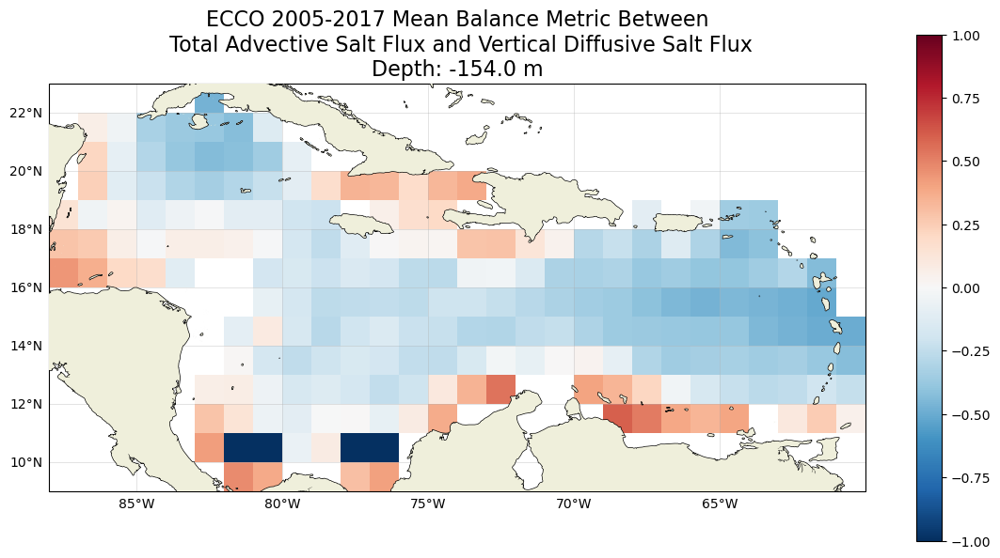

In [288]:
fig, ax = plt.subplots(figsize=(14,7),subplot_kw=dict(projection=cartopy.crs.PlateCarree()))

ax.coastlines(linewidth=1.0,zorder=10)
ax.add_feature(cartopy.feature.LAND,zorder=10)
glb = ax.gridlines(draw_labels=True, alpha=0.5, linewidth=.5 )
glb.xlabels_top = glb.ylabels_right = False


depth_ind = 14

plt.title(f'ECCO 2005-2017 Mean Balance Metric Between\n Total Advective Salt Flux and Vertical Diffusive Salt Flux\nDepth: {np.round(carib_ds.depth[depth_ind].values)} m', fontsize=font_size)
#plt.contourf(lonmesh_carib,latmesh_carib,MB_carib_salt_total_adve_vert_diff.isel(depth=depth_ind),transform =cartopy.crs.PlateCarree(),levels=np.arange(-1,1.05,0.1),cmap='RdBu_r')

plt.pcolormesh(carib_ds.x,carib_ds.y,MB_carib_salt_total_adve_vert_diff.isel(depth=depth_ind),transform =cartopy.crs.PlateCarree(),cmap='RdBu_r',vmin=-1,vmax=1)

plt.colorbar()

# cs = plt.contour(lonmesh_carib,latmesh_carib,MB_carib_salt_total_adve_vert_diff.isel(depth=15),[-0.75,-0.5,-0.25,0,0.25,0.5,0.75],colors='black',linewidth=5,transform =cartopy.crs.PlateCarree())
# plt.clabel(cs, inline=True, fontsize=10)


/Users/joegradone/anaconda3/envs/rutgers-phd/lib/python3.11/site-packages/cartopy/mpl/gridliner.py:451: UserWarning: The .xlabels_top attribute is deprecated. Please use .top_labels to toggle visibility instead.
  warnings.warn('The .xlabels_top attribute is deprecated. Please '
/Users/joegradone/anaconda3/envs/rutgers-phd/lib/python3.11/site-packages/cartopy/mpl/gridliner.py:487: UserWarning: The .ylabels_right attribute is deprecated. Please use .right_labels to toggle visibility instead.
  warnings.warn('The .ylabels_right attribute is deprecated. Please '


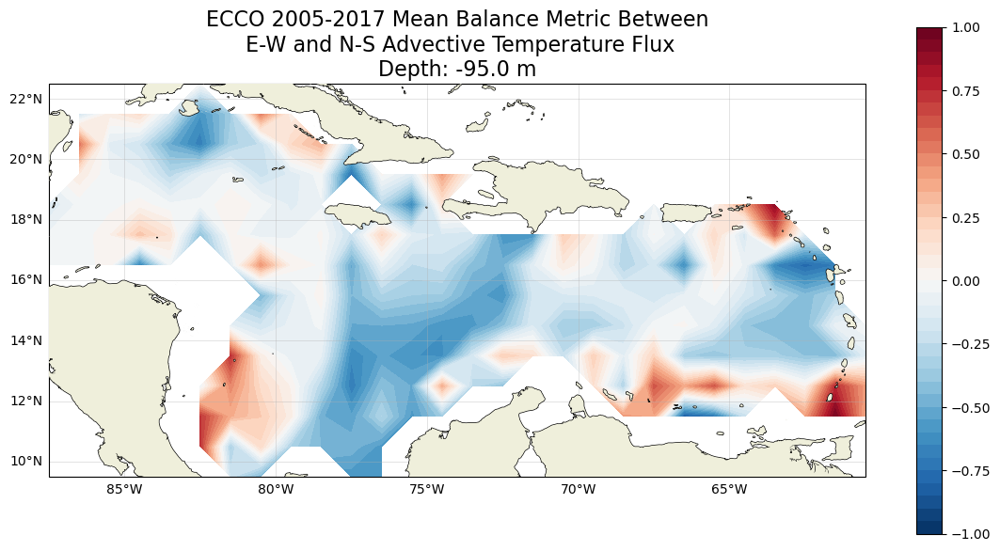

In [301]:
MB_carib_temp_adv_x_y = calc_MB(carib_ds.temp_tendency,carib_ds.temp_advection_x,carib_ds.temp_advection_y)

fig, ax = plt.subplots(figsize=(14,7),subplot_kw=dict(projection=cartopy.crs.PlateCarree()))

ax.coastlines(linewidth=1.0,zorder=10)
ax.add_feature(cartopy.feature.LAND,zorder=10)
glb = ax.gridlines(draw_labels=True, alpha=0.5, linewidth=.5 )
glb.xlabels_top = glb.ylabels_right = False


depth_ind = 9

plt.title(f'ECCO 2005-2017 Mean Balance Metric Between\n E-W and N-S Advective Temperature Flux\nDepth: {np.round(carib_ds.depth[depth_ind].values)} m', fontsize=font_size)
plt.contourf(lonmesh_carib,latmesh_carib,MB_carib_temp_adv_x_y.isel(depth=depth_ind),transform =cartopy.crs.PlateCarree(),levels=np.arange(-1,1.05,0.05),cmap='RdBu_r')
#plt.pcolormesh(carib_ds.x,carib_ds.y,MB_carib_temp_adv_x_y.isel(depth=depth_ind),transform =cartopy.crs.PlateCarree(),cmap='RdBu_r',vmin=-1,vmax=1)
plt.colorbar()

# cs = plt.contour(lonmesh_carib,latmesh_carib,MB_carib_salt_total_adve_vert_diff.isel(depth=15),[-0.75,-0.5,-0.25,0,0.25,0.5,0.75],colors='black',linewidth=5,transform =cartopy.crs.PlateCarree())
# plt.clabel(cs, inline=True, fontsize=10)


/Users/joegradone/anaconda3/envs/rutgers-phd/lib/python3.11/site-packages/cartopy/mpl/gridliner.py:451: UserWarning: The .xlabels_top attribute is deprecated. Please use .top_labels to toggle visibility instead.
  warnings.warn('The .xlabels_top attribute is deprecated. Please '
/Users/joegradone/anaconda3/envs/rutgers-phd/lib/python3.11/site-packages/cartopy/mpl/gridliner.py:487: UserWarning: The .ylabels_right attribute is deprecated. Please use .right_labels to toggle visibility instead.
  warnings.warn('The .ylabels_right attribute is deprecated. Please '


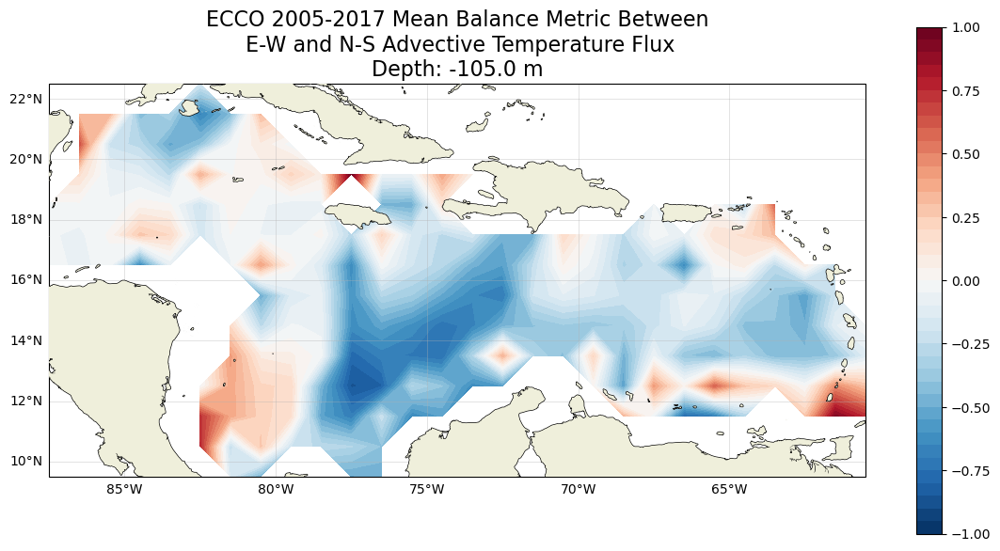

In [299]:
total_carib_temp_advect = carib_ds.temp_advection_x+carib_ds.temp_advection_y+carib_ds.temp_advection_v

MB_carib_temp_total_adv_vert_diffusion = calc_MB(carib_ds.temp_tendency,total_carib_temp_advect,carib_ds.temp_diffusion_v)

fig, ax = plt.subplots(figsize=(14,7),subplot_kw=dict(projection=cartopy.crs.PlateCarree()))

ax.coastlines(linewidth=1.0,zorder=10)
ax.add_feature(cartopy.feature.LAND,zorder=10)
glb = ax.gridlines(draw_labels=True, alpha=0.5, linewidth=.5 )
glb.xlabels_top = glb.ylabels_right = False


depth_ind = 10

plt.title(f'ECCO 2005-2017 Mean Balance Metric Between\n E-W and N-S Advective Temperature Flux\nDepth: {np.round(carib_ds.depth[depth_ind].values)} m', fontsize=font_size)
plt.contourf(lonmesh_carib,latmesh_carib,MB_carib_temp_adv_x_y.isel(depth=depth_ind),transform =cartopy.crs.PlateCarree(),levels=np.arange(-1,1.05,0.05),cmap='RdBu_r')
#plt.pcolormesh(carib_ds.x,carib_ds.y,MB_carib_temp_adv_x_y.isel(depth=depth_ind),transform =cartopy.crs.PlateCarree(),cmap='RdBu_r',vmin=-1,vmax=1)
plt.colorbar()

# cs = plt.contour(lonmesh_carib,latmesh_carib,MB_carib_salt_total_adve_vert_diff.isel(depth=15),[-0.75,-0.5,-0.25,0,0.25,0.5,0.75],colors='black',linewidth=5,transform =cartopy.crs.PlateCarree())
# plt.clabel(cs, inline=True, fontsize=10)


## Covariance Ratio

Output values seem way too small compared to paper

In [408]:
def cov_ratio(tendency,var):
    var = np.var(tendency,axis=3) ## axis = 3 should be time dimension
    cov = xr.cov(var,tendency, dim="time",ddof=0)
    cov_ratio = cov/var
    return cov_ratio


In [409]:
carib_salt_tend_ew_diff_cov_ratio = cov_ratio(carib_ds.salt_tendency,carib_ds.salt_diffusion_x)
carib_salt_tend_ns_diff_cov_ratio = cov_ratio(carib_ds.salt_tendency,carib_ds.salt_diffusion_y)
carib_salt_tend_vert_diff_cov_ratio = cov_ratio(carib_ds.salt_tendency,carib_ds.salt_diffusion_v)

carib_salt_tend_ew_adv_cov_ratio = cov_ratio(carib_ds.salt_tendency,carib_ds.salt_advection_x)
carib_salt_tend_ns_adv_cov_ratio = cov_ratio(carib_ds.salt_tendency,carib_ds.salt_advection_y)
carib_salt_tend_vert_adv_cov_ratio = cov_ratio(carib_ds.salt_tendency,carib_ds.salt_advection_v)

salt_tend_var = np.var(carib_ds.salt_tendency,axis=3)

In [410]:
carib_salt_tend_tot_diff_cov = carib_salt_tend_ew_diff_cov_ratio+carib_salt_tend_ns_diff_cov_ratio+carib_salt_tend_vert_diff_cov_ratio
carib_salt_tend_tot_adv_cov  = carib_salt_tend_ew_adv_cov_ratio+carib_salt_tend_ns_adv_cov_ratio+carib_salt_tend_vert_adv_cov_ratio

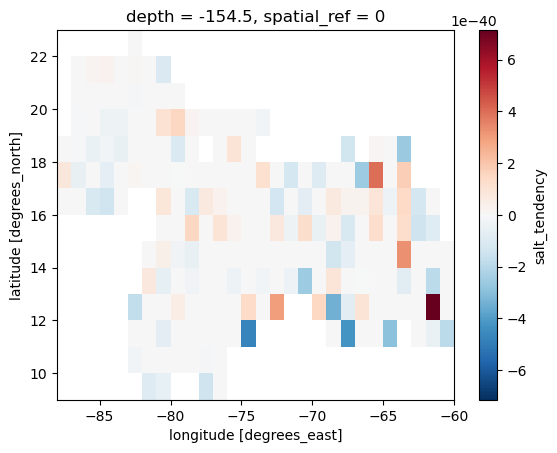

In [411]:
carib_salt_tend_vert_diff_cov_ratio.isel(depth=14).plot()

In [381]:
carib_ds.salt_diffusion_x.values[12,5,0,1]

-7.725981632233925e-09

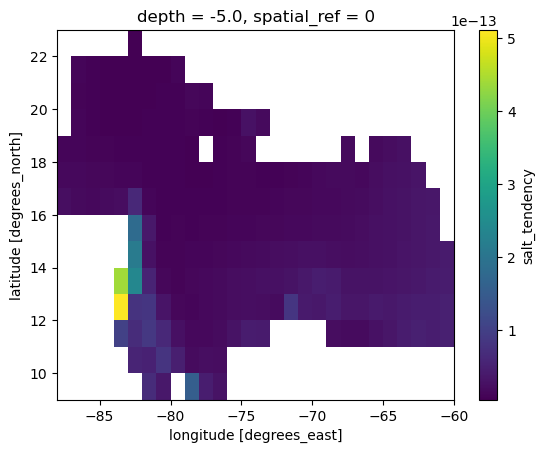

In [407]:
salt_tend_var.isel(depth=0).plot()

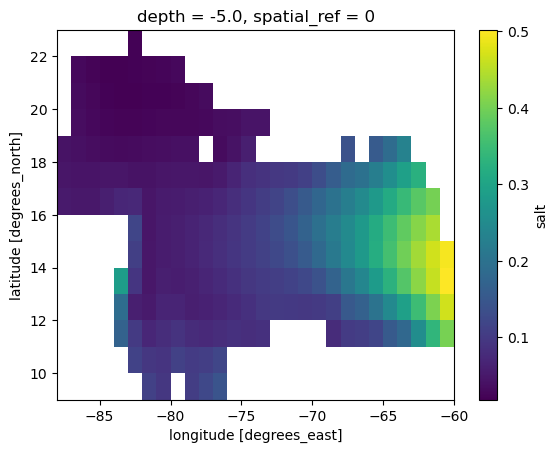

In [406]:
np.var(carib_ds.salt,axis=3).isel(depth=0).plot()

In [393]:
import statistics

In [396]:
statistics.variance(np.arange(-100,100))

3350

In [401]:
?np.var

Signature:      
np.var(
    a,
    axis=None,
    dtype=None,
    out=None,
    ddof=0,
    keepdims=<no value>,
    *,
    where=<no value>,
)
Call signature:  np.var(*args, **kwargs)
Type:            _ArrayFunctionDispatcher
String form:     <function var at 0x11280a480>
File:            ~/anaconda3/envs/rutgers-phd/lib/python3.11/site-packages/numpy/core/fromnumeric.py
Docstring:      
Compute the variance along the specified axis.

Returns the variance of the array elements, a measure of the spread of a
distribution.  The variance is computed for the flattened array by
default, otherwise over the specified axis.

Parameters
----------
a : array_like
    Array containing numbers whose variance is desired.  If `a` is not an
    array, a conversion is attempted.
axis : None or int or tuple of ints, optional
    Axis or axes along which the variance is computed.  The default is to
    compute the variance of the flattened array.

    .. versionadded:: 1.7.0

    If this is a tuple of 

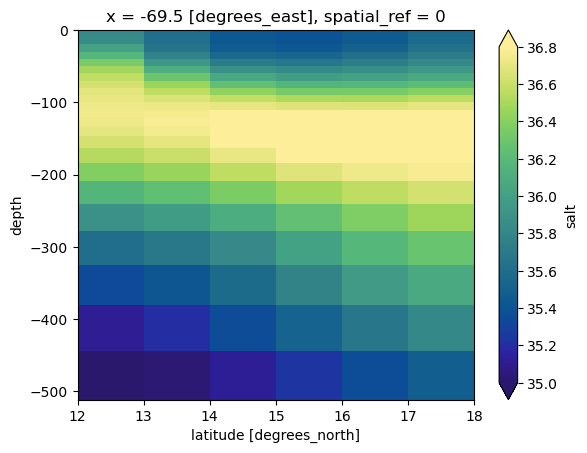

In [638]:
eline.salt.mean(dim='time').transpose().plot(vmin=35,vmax=36.8,cmap=cmo.haline)

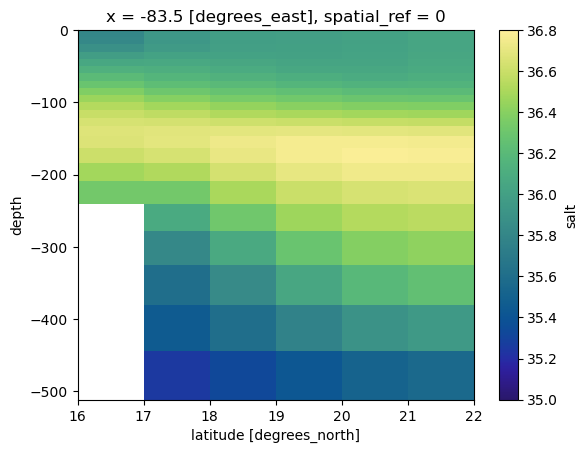

In [637]:
wline.salt.mean(dim='time').transpose().plot(vmin=35,vmax=36.8,cmap=cmo.haline)

/var/folders/m9/d8bbz1wx4f50q99kfb1jv9pw0000gn/T/ipykernel_36850/163673003.py:8: UserWarning: The following kwargs were not used by contour: 'linewidth'
  cs = ax[0].contour(wline.y,wline.depth,wline.salt.mean(dim='time').transpose(),[35,35.25,35.5,35.75,36,36.25,36.5,36.75,36.9],colors='black',linewidth=5)
/var/folders/m9/d8bbz1wx4f50q99kfb1jv9pw0000gn/T/ipykernel_36850/163673003.py:15: UserWarning: The following kwargs were not used by contour: 'linewidth'
  cs = ax[1].contour(eline.y,eline.depth,eline.salt.mean(dim='time').transpose(),[35,35.25,35.5,35.75,36,36.25,36.5,36.75,36.9],colors='black',linewidth=5)


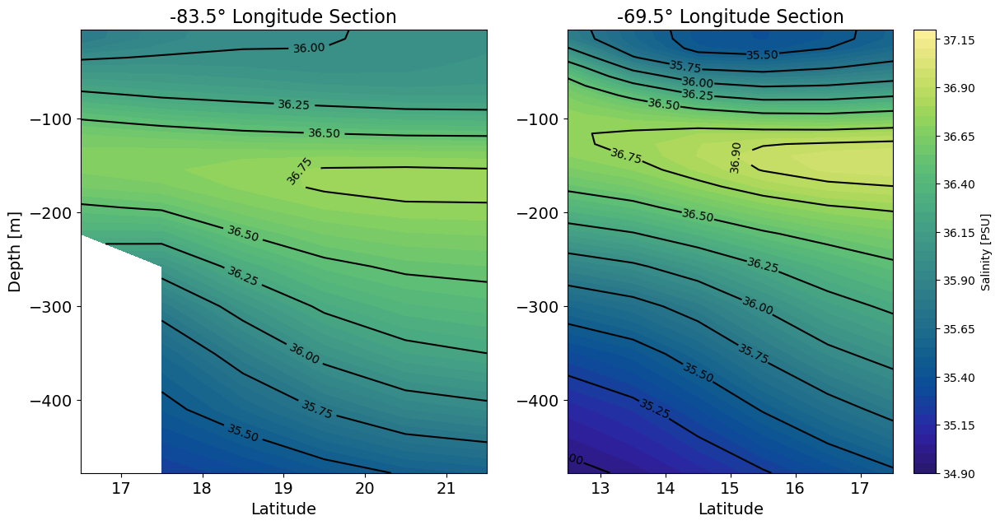

In [751]:
fig, ax = plt.subplots(1,2, figsize=(14,7))

ax[0].contourf(wline.y,wline.depth,wline.salt.mean(dim='time').transpose(),levels=np.arange(34.9,37.2,0.05),cmap=cmo.haline)
ax[0].set_xlabel('Latitude',size=fontsize)
ax[0].set_ylabel('Depth [m]',size=fontsize)
ax[0].tick_params(axis='both', which='major', labelsize=fontsize)
ax[0].set_title(f'{wline.x.values}° Longitude Section', fontsize=font_size)
cs = ax[0].contour(wline.y,wline.depth,wline.salt.mean(dim='time').transpose(),[35,35.25,35.5,35.75,36,36.25,36.5,36.75,36.9],colors='black',linewidth=5)
ax[0].clabel(cs, inline=True, fontsize=10)

im = ax[1].contourf(eline.y,eline.depth,eline.salt.mean(dim='time').transpose(),levels=np.arange(34.9,37.2,0.05),cmap=cmo.haline)
ax[1].set_xlabel('Latitude',size=fontsize)
ax[1].tick_params(axis='both', which='major', labelsize=fontsize)
ax[1].set_title(f'{eline.x.values}° Longitude Section', fontsize=font_size)
cs = ax[1].contour(eline.y,eline.depth,eline.salt.mean(dim='time').transpose(),[35,35.25,35.5,35.75,36,36.25,36.5,36.75,36.9],colors='black',linewidth=5)
ax[1].clabel(cs, inline=True, fontsize=10)

fig.colorbar(im,label='Salinity [PSU]')



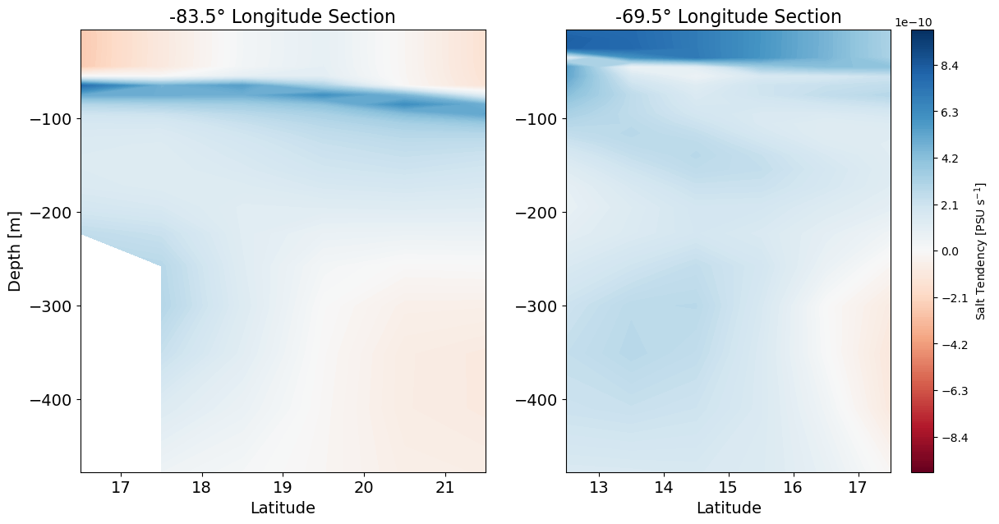

In [824]:
fig, ax = plt.subplots(1,2, figsize=(14,7))

ax[0].contourf(wline.y,wline.depth,wline.salt_tendency.mean(dim='time').transpose(),levels=np.arange(-0.000000001,0.000000001,0.00000000001),cmap='RdBu')
ax[0].set_xlabel('Latitude',size=fontsize)
ax[0].set_ylabel('Depth [m]',size=fontsize)
ax[0].tick_params(axis='both', which='major', labelsize=fontsize)
ax[0].set_title(f'{wline.x.values}° Longitude Section', fontsize=font_size)
# cs = ax[0].contour(wline.y,wline.depth,wline.salt.mean(dim='time').transpose(),[35,35.25,35.5,35.75,36,36.25,36.5,36.75,36.9],colors='black',linewidth=5)
# ax[0].clabel(cs, inline=True, fontsize=10)

im = ax[1].contourf(eline.y,eline.depth,eline.salt_tendency.mean(dim='time').transpose(),levels=np.arange(-0.000000001,0.000000001,0.00000000001),cmap='RdBu')
ax[1].set_xlabel('Latitude',size=fontsize)
ax[1].tick_params(axis='both', which='major', labelsize=fontsize)
ax[1].set_title(f'{eline.x.values}° Longitude Section', fontsize=font_size)
# cs = ax[1].contour(eline.y,eline.depth,eline.salt.mean(dim='time').transpose(),[35,35.25,35.5,35.75,36,36.25,36.5,36.75,36.9],colors='black',linewidth=5)
# ax[1].clabel(cs, inline=True, fontsize=10)

fig.colorbar(im,label='Salt Tendency [PSU s$^{-1}$]')



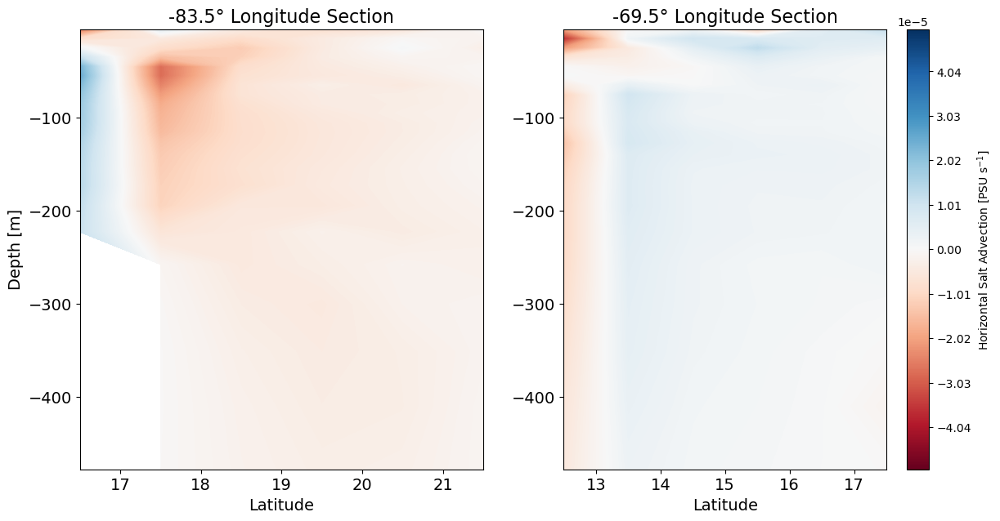

In [834]:
fig, ax = plt.subplots(1,2, figsize=(14,7))

ax[0].contourf(wline.y,wline.depth,wline.salt_advection_x.mean(dim='time').transpose(),levels=np.arange(-0.00005,0.00005,0.0000001),cmap='RdBu')
ax[0].set_xlabel('Latitude',size=fontsize)
ax[0].set_ylabel('Depth [m]',size=fontsize)
ax[0].tick_params(axis='both', which='major', labelsize=fontsize)
ax[0].set_title(f'{wline.x.values}° Longitude Section', fontsize=font_size)

im = ax[1].contourf(eline.y,eline.depth,eline.salt_advection_x.mean(dim='time').transpose(),levels=np.arange(-0.00005,0.00005,0.0000001),cmap='RdBu')
ax[1].set_xlabel('Latitude',size=fontsize)
ax[1].tick_params(axis='both', which='major', labelsize=fontsize)
ax[1].set_title(f'{eline.x.values}° Longitude Section', fontsize=font_size)

fig.colorbar(im,label='Horizontal Salt Advection [PSU s$^{-1}$]')



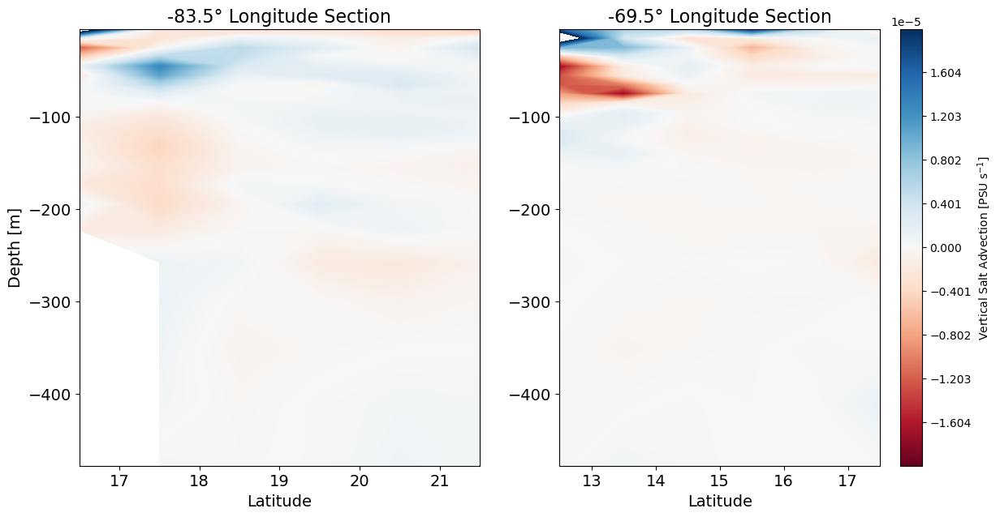

In [842]:
fig, ax = plt.subplots(1,2, figsize=(14,7))

ax[0].contourf(wline.y,wline.depth,wline.salt_advection_v.mean(dim='time').transpose(),levels=np.arange(-0.00002,0.00002,0.00000001),cmap='RdBu')
ax[0].set_xlabel('Latitude',size=fontsize)
ax[0].set_ylabel('Depth [m]',size=fontsize)
ax[0].tick_params(axis='both', which='major', labelsize=fontsize)
ax[0].set_title(f'{wline.x.values}° Longitude Section', fontsize=font_size)

im = ax[1].contourf(eline.y,eline.depth,eline.salt_advection_v.mean(dim='time').transpose(),levels=np.arange(-0.00002,0.00002,0.00000001),cmap='RdBu')
ax[1].set_xlabel('Latitude',size=fontsize)
ax[1].tick_params(axis='both', which='major', labelsize=fontsize)
ax[1].set_title(f'{eline.x.values}° Longitude Section', fontsize=font_size)

fig.colorbar(im,label='Vertical Salt Advection [PSU s$^{-1}$]')



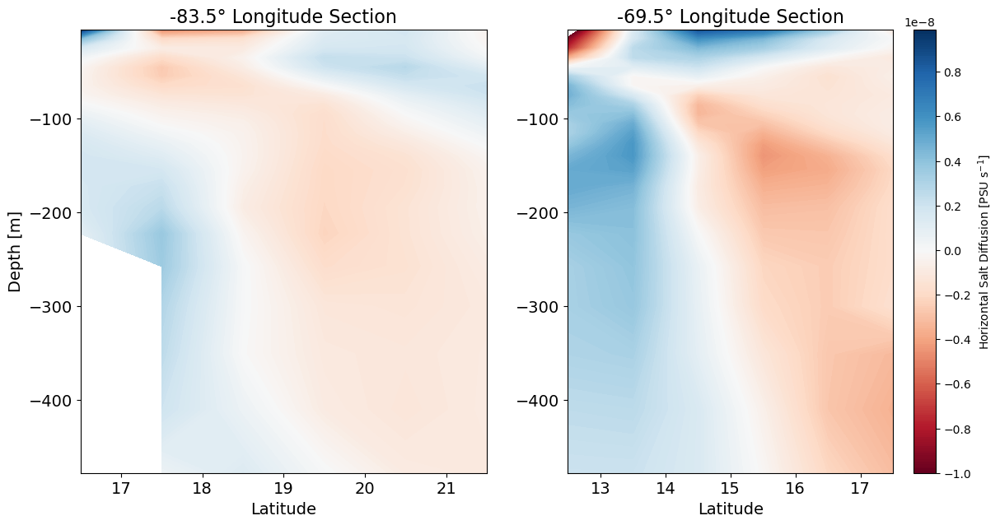

In [846]:
fig, ax = plt.subplots(1,2, figsize=(14,7))

ax[0].contourf(wline.y,wline.depth,wline.salt_diffusion_x.mean(dim='time').transpose(),levels=np.arange(-0.00000001,0.00000001,0.0000000001),cmap='RdBu')
ax[0].set_xlabel('Latitude',size=fontsize)
ax[0].set_ylabel('Depth [m]',size=fontsize)
ax[0].tick_params(axis='both', which='major', labelsize=fontsize)
ax[0].set_title(f'{wline.x.values}° Longitude Section', fontsize=font_size)

im = ax[1].contourf(eline.y,eline.depth,eline.salt_diffusion_x.mean(dim='time').transpose(),levels=np.arange(-0.00000001,0.00000001,0.0000000001),cmap='RdBu')
ax[1].set_xlabel('Latitude',size=fontsize)
ax[1].tick_params(axis='both', which='major', labelsize=fontsize)
ax[1].set_title(f'{eline.x.values}° Longitude Section', fontsize=font_size)

fig.colorbar(im,label='Horizontal Salt Diffusion [PSU s$^{-1}$]')



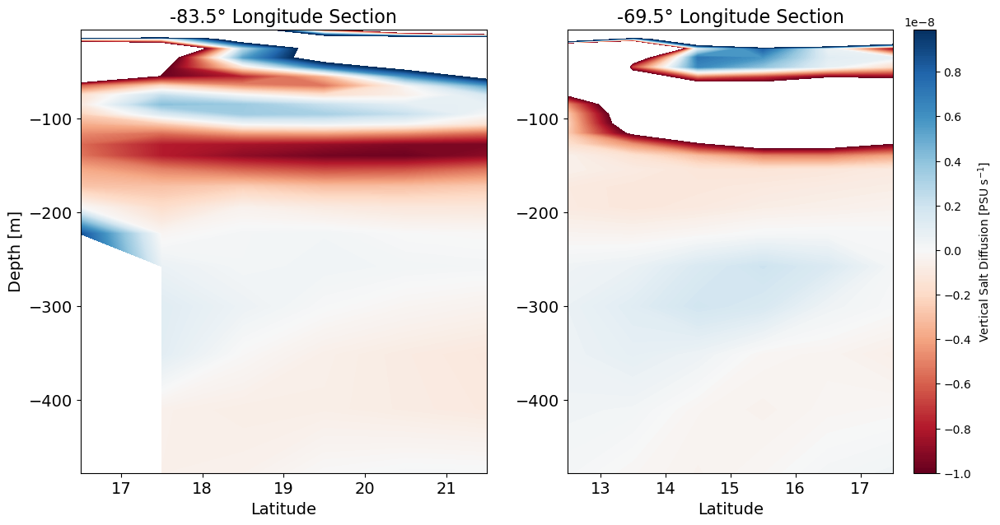

In [857]:
fig, ax = plt.subplots(1,2, figsize=(14,7))

ax[0].contourf(wline.y,wline.depth,wline.salt_diffusion_v.mean(dim='time').transpose(),levels=np.arange(-0.00000001,0.00000001,0.00000000001),cmap='RdBu')
ax[0].set_xlabel('Latitude',size=fontsize)
ax[0].set_ylabel('Depth [m]',size=fontsize)
ax[0].tick_params(axis='both', which='major', labelsize=fontsize)
ax[0].set_title(f'{wline.x.values}° Longitude Section', fontsize=font_size)

im = ax[1].contourf(eline.y,eline.depth,eline.salt_diffusion_v.mean(dim='time').transpose(),levels=np.arange(-0.00000001,0.00000001,0.0000000001),cmap='RdBu')
ax[1].set_xlabel('Latitude',size=fontsize)
ax[1].tick_params(axis='both', which='major', labelsize=fontsize)
ax[1].set_title(f'{eline.x.values}° Longitude Section', fontsize=font_size)

fig.colorbar(im,label='Vertical Salt Diffusion [PSU s$^{-1}$]')



/var/folders/m9/d8bbz1wx4f50q99kfb1jv9pw0000gn/T/ipykernel_36850/142658161.py:8: UserWarning: The following kwargs were not used by contour: 'linewidth'
  cs = ax[0].contour(wline.y,wline.depth,wline.temp.mean(dim='time').transpose(),[10,12,14,16,18,20,22,24,26,28],colors='black',linewidth=5)
/var/folders/m9/d8bbz1wx4f50q99kfb1jv9pw0000gn/T/ipykernel_36850/142658161.py:15: UserWarning: The following kwargs were not used by contour: 'linewidth'
  cs = ax[1].contour(eline.y,eline.depth,eline.temp.mean(dim='time').transpose(),[10,12,14,16,18,20,22,24,26,28],colors='black',linewidth=5)


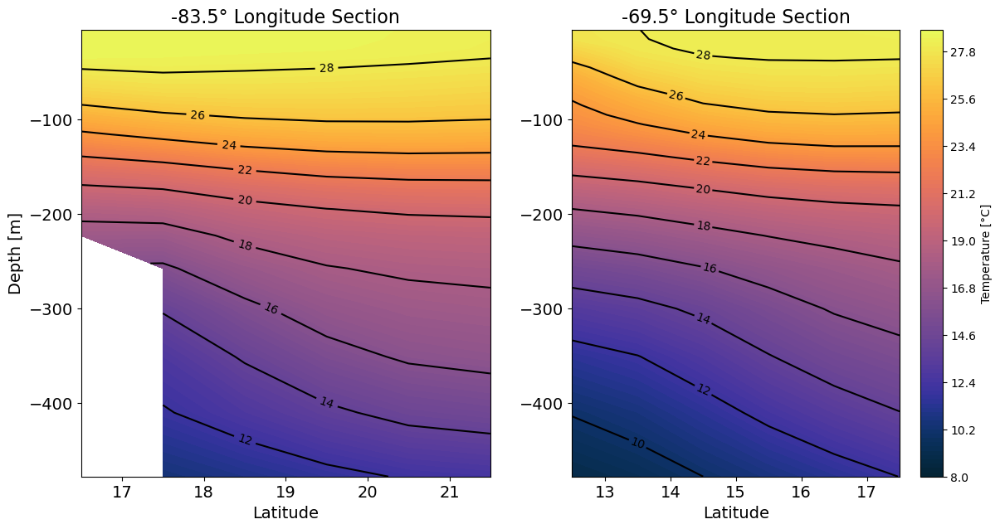

In [752]:
fig, ax = plt.subplots(1,2, figsize=(14,7))

ax[0].contourf(wline.y,wline.depth,wline.temp.mean(dim='time').transpose(),levels=np.arange(8,29,0.2),cmap=cmo.thermal)
ax[0].set_xlabel('Latitude',size=fontsize)
ax[0].set_ylabel('Depth [m]',size=fontsize)
ax[0].tick_params(axis='both', which='major', labelsize=fontsize)
ax[0].set_title(f'{wline.x.values}° Longitude Section', fontsize=font_size)
cs = ax[0].contour(wline.y,wline.depth,wline.temp.mean(dim='time').transpose(),[10,12,14,16,18,20,22,24,26,28],colors='black',linewidth=5)
ax[0].clabel(cs, inline=True, fontsize=10)

im = ax[1].contourf(eline.y,eline.depth,eline.temp.mean(dim='time').transpose(),levels=np.arange(8,29,0.2),cmap=cmo.thermal)
ax[1].set_xlabel('Latitude',size=fontsize)
ax[1].tick_params(axis='both', which='major', labelsize=fontsize)
ax[1].set_title(f'{eline.x.values}° Longitude Section', fontsize=font_size)
cs = ax[1].contour(eline.y,eline.depth,eline.temp.mean(dim='time').transpose(),[10,12,14,16,18,20,22,24,26,28],colors='black',linewidth=5)
ax[1].clabel(cs, inline=True, fontsize=10)

fig.colorbar(im,label='Temperature [°C]')



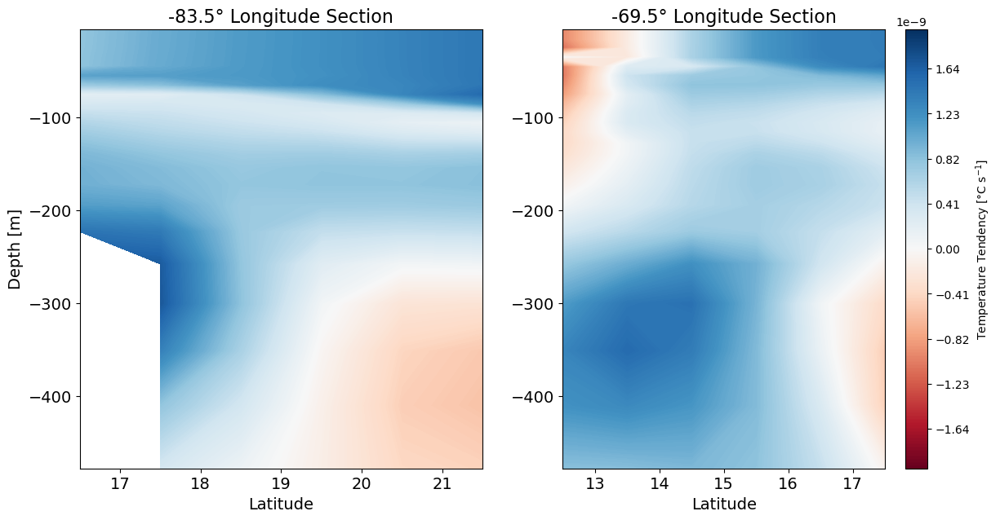

In [863]:
fig, ax = plt.subplots(1,2, figsize=(14,7))

ax[0].contourf(wline.y,wline.depth,wline.temp_tendency.mean(dim='time').transpose(),levels=np.arange(-0.000000002,0.000000002,0.00000000001),cmap='RdBu')
ax[0].set_xlabel('Latitude',size=fontsize)
ax[0].set_ylabel('Depth [m]',size=fontsize)
ax[0].tick_params(axis='both', which='major', labelsize=fontsize)
ax[0].set_title(f'{wline.x.values}° Longitude Section', fontsize=font_size)

im = ax[1].contourf(eline.y,eline.depth,eline.temp_tendency.mean(dim='time').transpose(),levels=np.arange(-0.000000002,0.000000002,0.00000000001),cmap='RdBu')
ax[1].set_xlabel('Latitude',size=fontsize)
ax[1].tick_params(axis='both', which='major', labelsize=fontsize)
ax[1].set_title(f'{eline.x.values}° Longitude Section', fontsize=font_size)

fig.colorbar(im,label='Temperature Tendency [°C s$^{-1}$]')



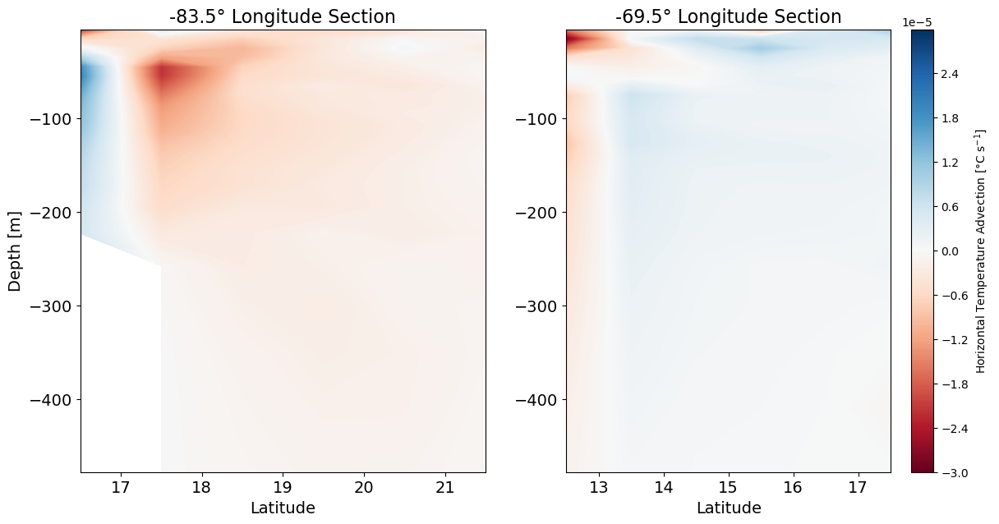

In [867]:
fig, ax = plt.subplots(1,2, figsize=(14,7))

ax[0].contourf(wline.y,wline.depth,wline.temp_advection_x.mean(dim='time').transpose(),levels=np.arange(-0.00003,0.00003,0.0000001),cmap='RdBu')
ax[0].set_xlabel('Latitude',size=fontsize)
ax[0].set_ylabel('Depth [m]',size=fontsize)
ax[0].tick_params(axis='both', which='major', labelsize=fontsize)
ax[0].set_title(f'{wline.x.values}° Longitude Section', fontsize=font_size)

im = ax[1].contourf(eline.y,eline.depth,eline.temp_advection_x.mean(dim='time').transpose(),levels=np.arange(-0.00003,0.00003,0.0000001),cmap='RdBu')
ax[1].set_xlabel('Latitude',size=fontsize)
ax[1].tick_params(axis='both', which='major', labelsize=fontsize)
ax[1].set_title(f'{eline.x.values}° Longitude Section', fontsize=font_size)

fig.colorbar(im,label='Horizontal Temperature Advection [°C s$^{-1}$]')



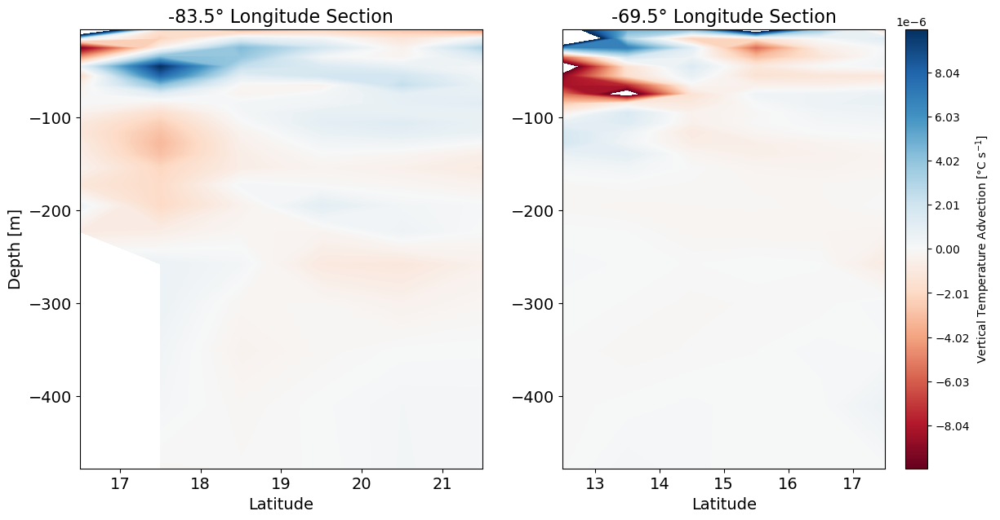

In [869]:
fig, ax = plt.subplots(1,2, figsize=(14,7))

ax[0].contourf(wline.y,wline.depth,wline.temp_advection_v.mean(dim='time').transpose(),levels=np.arange(-0.00001,0.00001,0.00000001),cmap='RdBu')
ax[0].set_xlabel('Latitude',size=fontsize)
ax[0].set_ylabel('Depth [m]',size=fontsize)
ax[0].tick_params(axis='both', which='major', labelsize=fontsize)
ax[0].set_title(f'{wline.x.values}° Longitude Section', fontsize=font_size)

im = ax[1].contourf(eline.y,eline.depth,eline.temp_advection_v.mean(dim='time').transpose(),levels=np.arange(-0.00001,0.00001,0.00000001),cmap='RdBu')
ax[1].set_xlabel('Latitude',size=fontsize)
ax[1].tick_params(axis='both', which='major', labelsize=fontsize)
ax[1].set_title(f'{eline.x.values}° Longitude Section', fontsize=font_size)

fig.colorbar(im,label='Vertical Temperature Advection [°C s$^{-1}$]')



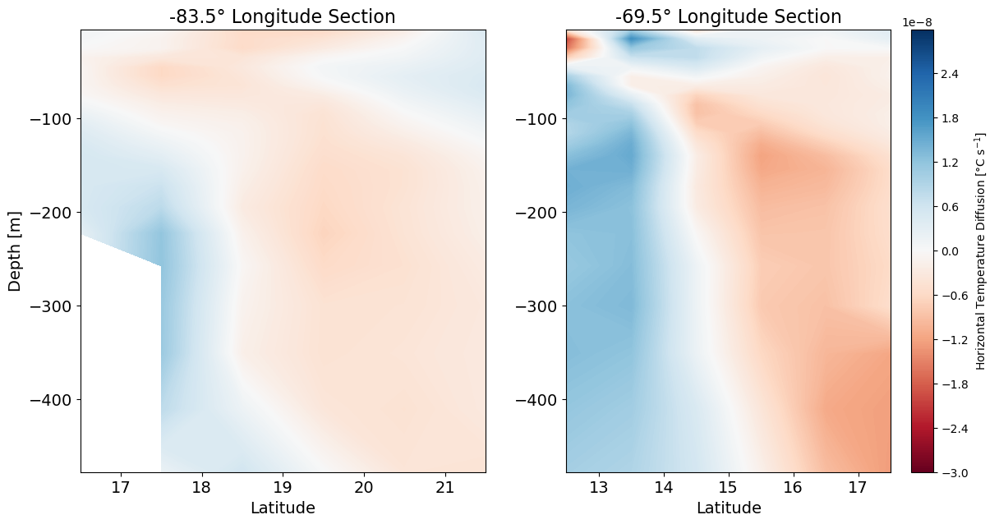

In [873]:
fig, ax = plt.subplots(1,2, figsize=(14,7))

ax[0].contourf(wline.y,wline.depth,wline.temp_diffusion_x.mean(dim='time').transpose(),levels=np.arange(-0.00000003,0.00000003,0.0000000001),cmap='RdBu')
ax[0].set_xlabel('Latitude',size=fontsize)
ax[0].set_ylabel('Depth [m]',size=fontsize)
ax[0].tick_params(axis='both', which='major', labelsize=fontsize)
ax[0].set_title(f'{wline.x.values}° Longitude Section', fontsize=font_size)

im = ax[1].contourf(eline.y,eline.depth,eline.temp_diffusion_x.mean(dim='time').transpose(),levels=np.arange(-0.00000003,0.00000003,0.0000000001),cmap='RdBu')
ax[1].set_xlabel('Latitude',size=fontsize)
ax[1].tick_params(axis='both', which='major', labelsize=fontsize)
ax[1].set_title(f'{eline.x.values}° Longitude Section', fontsize=font_size)

fig.colorbar(im,label='Horizontal Temperature Diffusion [°C s$^{-1}$]')



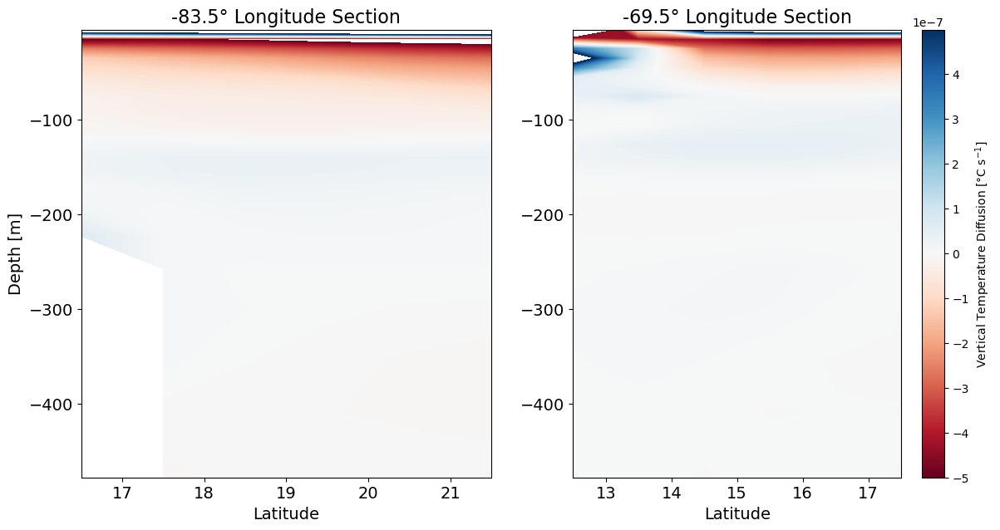

In [882]:
fig, ax = plt.subplots(1,2, figsize=(14,7))

ax[0].contourf(wline.y,wline.depth,wline.temp_diffusion_v.mean(dim='time').transpose(),levels=np.arange(-0.0000005,0.0000005,0.0000000001),cmap='RdBu')
ax[0].set_xlabel('Latitude',size=fontsize)
ax[0].set_ylabel('Depth [m]',size=fontsize)
ax[0].tick_params(axis='both', which='major', labelsize=fontsize)
ax[0].set_title(f'{wline.x.values}° Longitude Section', fontsize=font_size)

im = ax[1].contourf(eline.y,eline.depth,eline.temp_diffusion_v.mean(dim='time').transpose(),levels=np.arange(-0.0000005,0.0000005,0.000000001),cmap='RdBu')
ax[1].set_xlabel('Latitude',size=fontsize)
ax[1].tick_params(axis='both', which='major', labelsize=fontsize)
ax[1].set_title(f'{eline.x.values}° Longitude Section', fontsize=font_size)

fig.colorbar(im,label='Vertical Temperature Diffusion [°C s$^{-1}$]')



In [1017]:
eline

<xarray.Dataset>
Dimensions:             (y: 6, time: 4747, depth: 23)
Coordinates:
    x                   float64 -69.5
  * y                   (y) float64 12.5 13.5 14.5 15.5 16.5 17.5
  * time                (time) datetime64[ns] 2005-01-01T12:00:00 ... 2017-12...
  * depth               (depth) float32 -5.0 -15.0 -25.0 ... -409.9 -477.5
    spatial_ref         int64 0
Data variables: (12/21)
    temp_tendency       (y, depth, time) float64 -1.594e-08 ... -3.256e-09
    temp_advection_x    (y, depth, time) float64 -8.748e-06 ... 7.649e-07
    temp_advection_y    (y, depth, time) float64 1.236e-06 ... -4.38e-07
    temp_advection_v    (y, depth, time) float64 8.319e-06 ... -2.283e-07
    temp_diffusion_x    (y, depth, time) float64 3.543e-10 ... -1.031e-08
    temp_diffusion_y    (y, depth, time) float64 -1.144e-08 ... 1.844e-09
    ...                  ...
    salt_diffusion_v    (y, depth, time) float64 5.147e-07 ... 3.548e-10
    salt_forcing        (y, depth, time) float64 -2.044e-24 -7.571e-24 ... 0.0
    salt                (y, depth, time) float64 35.6 35.62 ... 35.47 35.47
    SWpen               (y, depth, time) float64 0.0 0.0 0.0 0.0 ... 0.0 0.0 0.0
    Qnet                (y, depth, time) float64 -1.33e-06 -2.771e-06 ... 0.0
    salinity_max_depth  (y, time) float32 -115.9 -115.9 -115.9 ... -139.7 -139.7

(-450.0, 0.0)

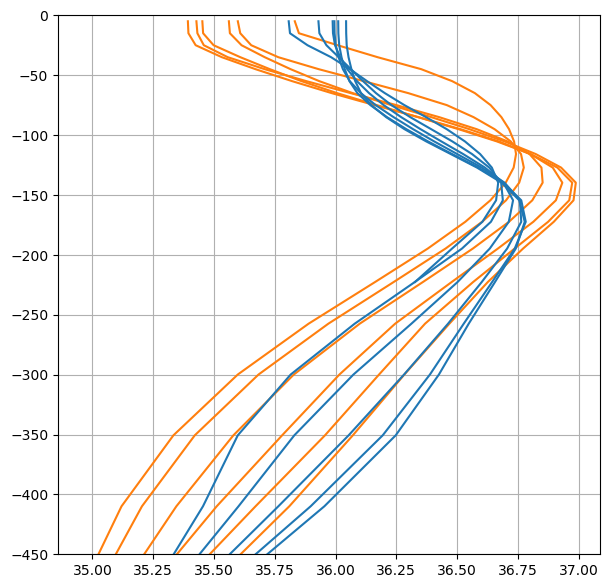

In [708]:
plt.figure(figsize=(7,7))

for x in np.arange(0,len(eline.y)):
    plt.plot(eline.salt.mean(dim='time').isel(y=x),eline.depth,color='tab:orange')

for x in np.arange(0,len(wline.y)):
    plt.plot(wline.salt.mean(dim='time').isel(y=x),wline.depth,color='tab:blue')

plt.grid()
plt.ylim(-450,0)

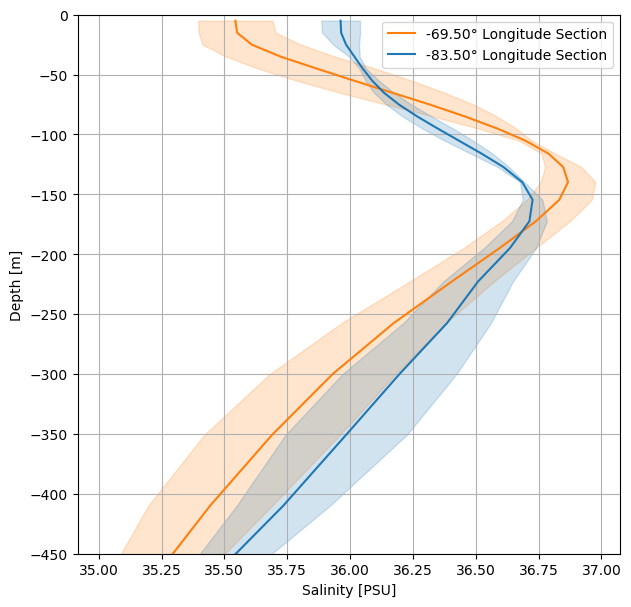

In [915]:
plt.figure(figsize=(7,7))

plt.plot(eline.salt.mean(dim=['time','y']),eline.depth,color='tab:orange',label='%.2f° Longitude Section' %(eline.x.values))
plt.fill_betweenx(eline.depth,eline.salt.mean(dim=['time','y'])-eline.salt.mean(dim='time').std(dim='y'),eline.salt.mean(dim=['time','y'])+eline.salt.mean(dim='time').std(dim='y'),color='tab:orange',alpha=0.2)

plt.plot(wline.salt.mean(dim=['time','y']),wline.depth,color='tab:blue',label='%.2f° Longitude Section' %(wline.x.values))
plt.fill_betweenx(wline.depth,wline.salt.mean(dim=['time','y'])-wline.salt.mean(dim='time').std(dim='y'),wline.salt.mean(dim=['time','y'])+wline.salt.mean(dim='time').std(dim='y'),color='tab:blue',alpha=0.2)

plt.grid()
plt.ylim(-450,0)

plt.xlabel('Salinity [PSU]')
plt.ylabel('Depth [m]')

plt.legend()

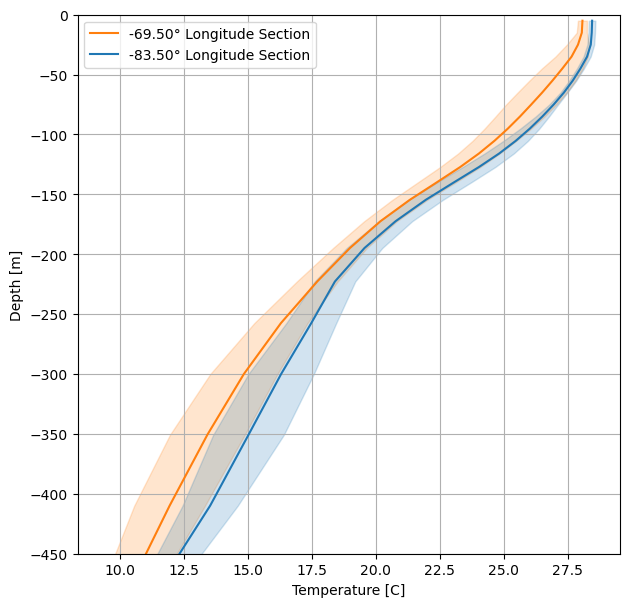

In [916]:
plt.figure(figsize=(7,7))

plt.plot(eline.temp.mean(dim=['time','y']),eline.depth,color='tab:orange',label='%.2f° Longitude Section' %(eline.x.values))
plt.fill_betweenx(eline.depth,eline.temp.mean(dim=['time','y'])-eline.temp.mean(dim='time').std(dim='y'),eline.temp.mean(dim=['time','y'])+eline.temp.mean(dim='time').std(dim='y'),color='tab:orange',alpha=0.2)

plt.plot(wline.temp.mean(dim=['time','y']),wline.depth,color='tab:blue',label='%.2f° Longitude Section' %(wline.x.values))
plt.fill_betweenx(wline.depth,wline.temp.mean(dim=['time','y'])-wline.temp.mean(dim='time').std(dim='y'),wline.temp.mean(dim=['time','y'])+wline.temp.mean(dim='time').std(dim='y'),color='tab:blue',alpha=0.2)

plt.grid()
plt.ylim(-450,0)

plt.xlabel('Temperature [C]')
plt.ylabel('Depth [m]')

plt.legend()

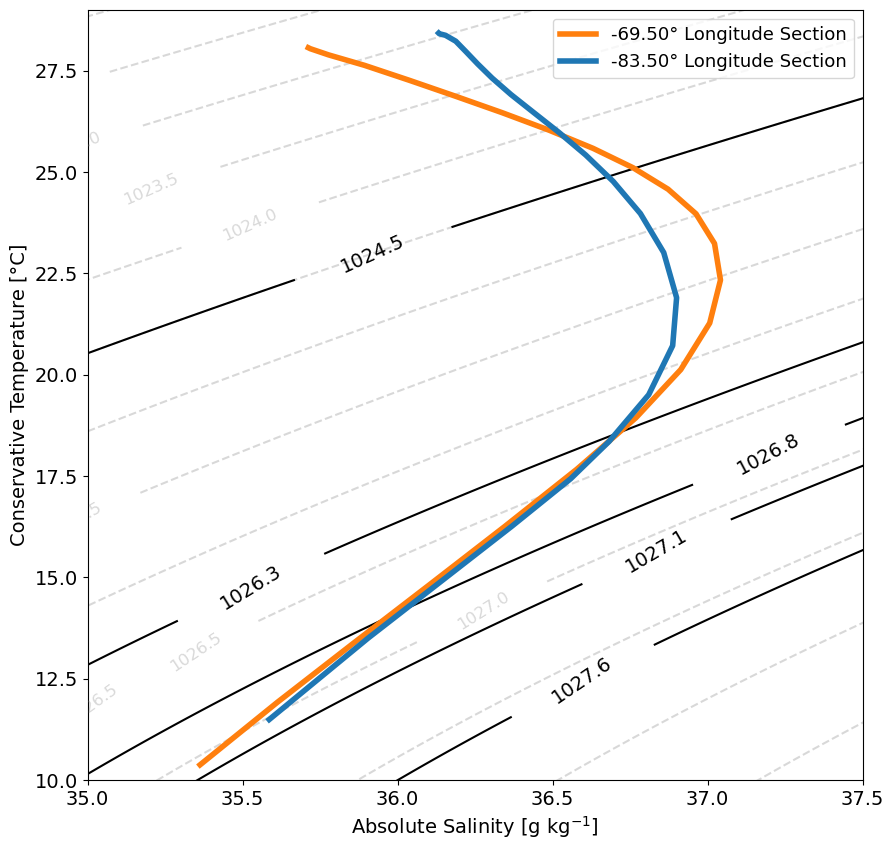

In [744]:
plt.figure(figsize=(10,10))

p = gsw.p_from_z(eline.depth.values,eline.y.values[0])

eline_absolute_salinity = gsw.SA_from_SP(eline.salt.mean(dim=['time','y']), p, eline.x.values, eline.y.values[0])  
eline_conservative_temperature = gsw.CT_from_pt(eline_absolute_salinity, eline.temp.mean(dim=['time','y']))

wline_absolute_salinity = gsw.SA_from_SP(wline.salt.mean(dim=['time','y']), p, wline.x.values, wline.y.values[0])  
wline_conservative_temperature = gsw.CT_from_pt(wline_absolute_salinity, wline.temp.mean(dim=['time','y']))


plt.plot(eline_absolute_salinity,eline_conservative_temperature,color='tab:orange',label='%.2f° Longitude Section' %(eline.x.values),linewidth=4)
plt.plot(wline_absolute_salinity,wline_conservative_temperature,color='tab:blue',label='%.2f° Longitude Section' %(wline.x.values),linewidth=4)




######## This plots the contours
mint=1
maxt=30
mins=34
maxs=37.5
n =499
tempL=np.linspace(mint-1,maxt+1,n)
salL=np.linspace(mins-1,maxs+1,n)
Tg, Sg = np.meshgrid(tempL,salL)

z=np.linspace(-1000,0,n)
p = gsw.p_from_z(z,lat=0)

sigma_theta = gsw.sigma0(Sg, Tg)+1000

cnt = np.linspace(sigma_theta.min(), sigma_theta.max(),n)
ind = np.argwhere(sigma_theta > 1015.7)
st_short = sigma_theta[ind]

## Thin bois
cs = plt.contour(Sg, Tg, sigma_theta, colors='grey', alpha=0.3,linestyles='dashed', zorder=1 ,levels=np.arange(1021,1030,0.5))
levels = cs.levels
manual_locations = [(0, 0), (0, 0),(0, 0), (34.75, 28),(34.8, 27.6), (35.25,24), (35.5, 24), (35, 25),(34.75, 17), (35, 16),(35.25,14), (0,0), (35,12),(0,0),(36.35,13.5), (0,0), (35.5,8),(35.75,6),(36.25,6),(36.75,5)]
plt.clabel(cs,levels, fontsize=12,inline=True,fmt='%.1f', manual=manual_locations)

## Thick bois
cs = plt.contour(Sg, Tg, sigma_theta, colors='black', zorder=1 ,levels=[1024.5,1026.3,1026.8,1027.1,1027.6])
levels = cs.levels
manual_locations = [(36, 22), (35.5, 15), (37.2,18), (36.9,15), (36.65,12)]
plt.clabel(cs,levels, fontsize=fontsize,inline=True,fmt='%.1f', manual=manual_locations)

plt.ylim(10,29)
plt.xlim(35,37.5)
plt.ylabel('Conservative Temperature [°C]',size=fontsize)
plt.xlabel('Absolute Salinity [g kg$^{-1}$]',size=fontsize)
plt.legend(markerscale=1.5,frameon=True, fontsize=font_size-3)
plt.gca().tick_params(axis='both', which='major', labelsize=fontsize)


## Integrate/incorporate cell size for terms

In [113]:
depth_grid = np.append(0,-np.diff(eline.depth))

eline_temp_tendency = eline.temp_tendency.sum(dim='y').mean(dim='time')*depth_grid
eline_temp_advection = (eline.temp_advection_x.sum(dim='y').mean(dim='time')*depth_grid)+(eline.temp_advection_y.sum(dim='y').mean(dim='time')*depth_grid)+(eline.temp_advection_v.sum(dim='y').mean(dim='time')*depth_grid)
eline_temp_diffusion = (eline.temp_diffusion_x.sum(dim='y').mean(dim='time')*depth_grid)+(eline.temp_diffusion_y.sum(dim='y').mean(dim='time')*depth_grid)+(eline.temp_diffusion_v.sum(dim='y').mean(dim='time')*depth_grid)
eline_temp_forcing = eline.temp_forcing.sum(dim='y').mean(dim='time')*depth_grid
eline_temp_RHS = eline_temp_advection+eline_temp_diffusion+eline_temp_forcing
eline_temp_resid = eline_temp_tendency-eline_temp_RHS

wline_temp_tendency = wline.temp_tendency.sum(dim='y').mean(dim='time')*depth_grid
wline_temp_advection = (wline.temp_advection_x.sum(dim='y').mean(dim='time')*depth_grid)+(wline.temp_advection_y.sum(dim='y').mean(dim='time')*depth_grid)+(wline.temp_advection_v.sum(dim='y').mean(dim='time')*depth_grid)
wline_temp_diffusion = (wline.temp_diffusion_x.sum(dim='y').mean(dim='time')*depth_grid)+(wline.temp_diffusion_y.sum(dim='y').mean(dim='time')*depth_grid)+(wline.temp_diffusion_v.sum(dim='y').mean(dim='time')*depth_grid)
wline_temp_forcing = wline.temp_forcing.sum(dim='y').mean(dim='time')*depth_grid
wline_temp_RHS = wline_temp_advection+wline_temp_diffusion+wline_temp_forcing
wline_temp_resid = wline_temp_tendency-wline_temp_RHS


eline_salt_tendency = eline.salt_tendency.sum(dim='y').mean(dim='time')*depth_grid
eline_salt_advection = (eline.salt_advection_x.sum(dim='y').mean(dim='time')*depth_grid)+(eline.salt_advection_y.sum(dim='y').mean(dim='time')*depth_grid)+(eline.salt_advection_v.sum(dim='y').mean(dim='time')*depth_grid)
eline_salt_diffusion = (eline.salt_diffusion_x.sum(dim='y').mean(dim='time')*depth_grid)+(eline.salt_diffusion_y.sum(dim='y').mean(dim='time')*depth_grid)+(eline.salt_diffusion_v.sum(dim='y').mean(dim='time')*depth_grid)
eline_salt_forcing = eline.salt_forcing.sum(dim='y').mean(dim='time')*depth_grid
eline_salt_RHS = eline_salt_advection+eline_salt_diffusion+eline_salt_forcing
eline_salt_resid = eline_salt_tendency-eline_salt_RHS

wline_salt_tendency = wline.salt_tendency.sum(dim='y').mean(dim='time')*depth_grid
wline_salt_advection = (wline.salt_advection_x.sum(dim='y').mean(dim='time')*depth_grid)+(wline.salt_advection_y.sum(dim='y').mean(dim='time')*depth_grid)+(wline.salt_advection_v.sum(dim='y').mean(dim='time')*depth_grid)
wline_salt_diffusion = (wline.salt_diffusion_x.sum(dim='y').mean(dim='time')*depth_grid)+(wline.salt_diffusion_y.sum(dim='y').mean(dim='time')*depth_grid)+(wline.salt_diffusion_v.sum(dim='y').mean(dim='time')*depth_grid)
wline_salt_forcing = wline.salt_forcing.sum(dim='y').mean(dim='time')*depth_grid
wline_salt_RHS = wline_salt_advection+wline_salt_diffusion+wline_salt_forcing
wline_salt_resid = wline_salt_tendency-wline_salt_RHS





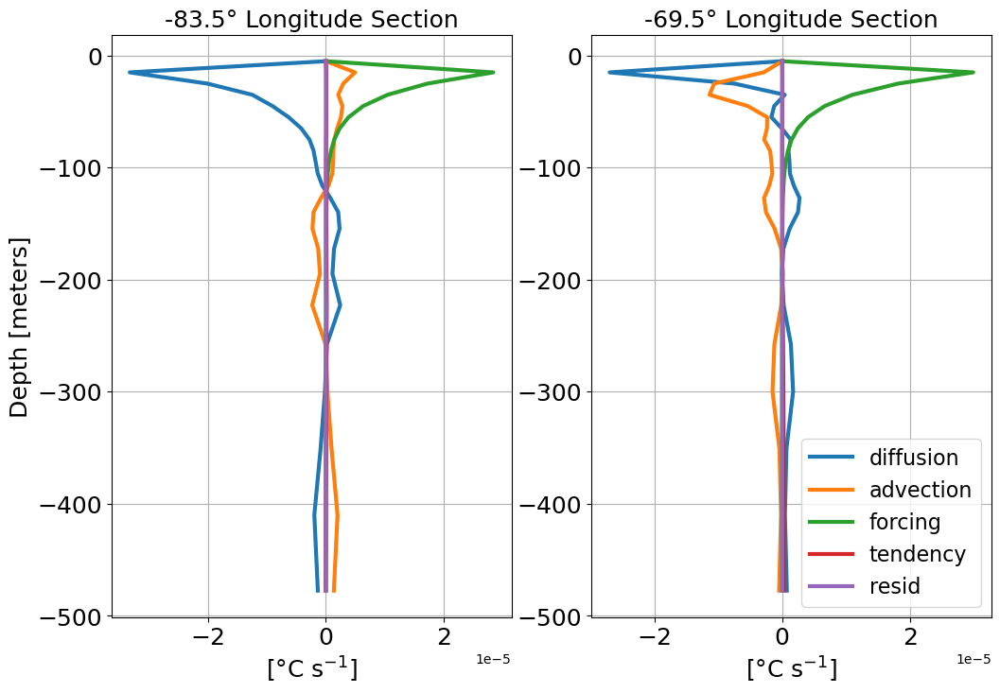

In [25]:
fig,ax = plt.subplots(1,2,figsize=(12,8))

fontsize=18

ax[0].plot(wline_temp_diffusion,wline.depth,linewidth=3,label='diffusion')
ax[0].plot(wline_temp_advection,wline.depth,linewidth=3,label='advection')
ax[0].plot(wline_temp_forcing,wline.depth,linewidth=3,label='forcing')
ax[0].plot(wline_temp_tendency,wline.depth,linewidth=3,label='tendency')
ax[0].plot(wline_temp_resid,wline.depth,linewidth=3,label='resid')
ax[0].grid()
ax[0].set_ylabel('Depth [meters]',fontsize=font_size)
ax[0].set_xlabel('[°C s$^{-1}$]',fontsize=font_size)
ax[0].set_title(f'{wline.x.values}° Longitude Section', fontsize=font_size)
ax[0].tick_params(axis='both', which='major', labelsize=fontsize)


ax[1].plot(eline_temp_diffusion,eline.depth,linewidth=3,label='diffusion')
ax[1].plot(eline_temp_advection,eline.depth,linewidth=3,label='advection')
ax[1].plot(eline_temp_forcing,eline.depth,linewidth=3,label='forcing')
ax[1].plot(eline_temp_tendency,eline.depth,linewidth=3,label='tendency')
ax[1].plot(eline_temp_resid,eline.depth,linewidth=3,label='resid')
ax[1].grid()
ax[1].legend(fontsize=font_size-2)
ax[1].set_xlabel('[°C s$^{-1}$]',fontsize=font_size)
ax[1].set_title(f'{eline.x.values}° Longitude Section', fontsize=font_size)
ax[1].tick_params(axis='both', which='major', labelsize=fontsize)


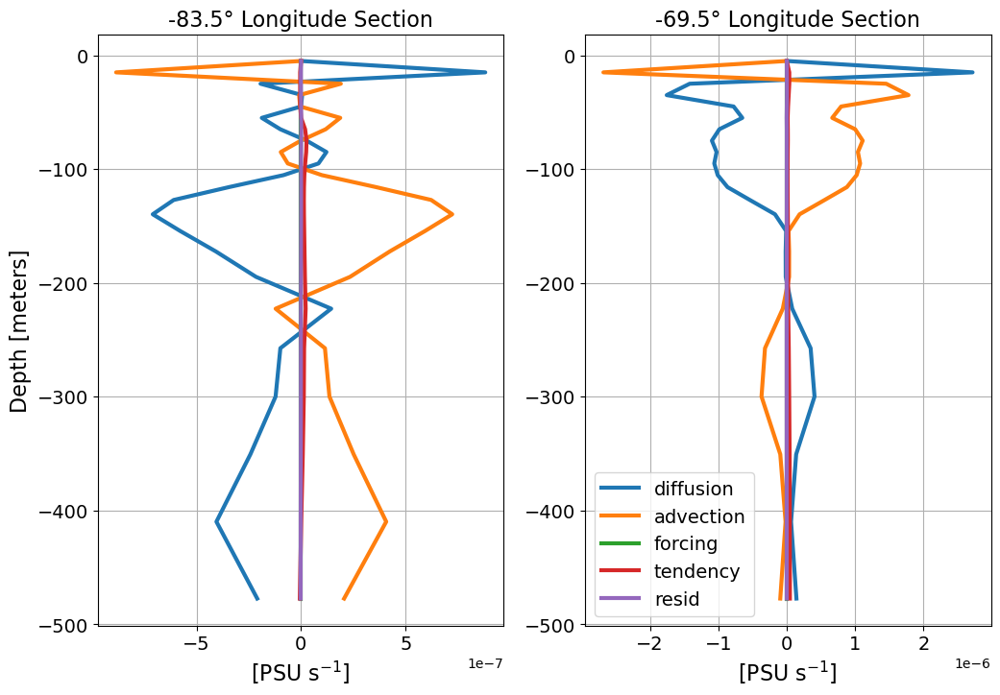

In [1038]:
fig,ax = plt.subplots(1,2,figsize=(12,8))



ax[0].plot(wline_salt_diffusion,wline.depth,linewidth=3,label='diffusion')
ax[0].plot(wline_salt_advection,wline.depth,linewidth=3,label='advection')
ax[0].plot(wline_salt_forcing,wline.depth,linewidth=3,label='forcing')
ax[0].plot(wline_salt_tendency,wline.depth,linewidth=3,label='tendency')
ax[0].plot(wline_salt_resid,wline.depth,linewidth=3,label='resid')
ax[0].grid()
ax[0].set_ylabel('Depth [meters]',fontsize=font_size)
ax[0].set_xlabel('[PSU s$^{-1}$]',fontsize=font_size)
ax[0].set_title(f'{wline.x.values}° Longitude Section', fontsize=font_size)
ax[0].tick_params(axis='both', which='major', labelsize=fontsize)


ax[1].plot(eline_salt_diffusion,eline.depth,linewidth=3,label='diffusion')
ax[1].plot(eline_salt_advection,eline.depth,linewidth=3,label='advection')
ax[1].plot(eline_salt_forcing,eline.depth,linewidth=3,label='forcing')
ax[1].plot(eline_salt_tendency,eline.depth,linewidth=3,label='tendency')
ax[1].plot(eline_salt_resid,eline.depth,linewidth=3,label='resid')
ax[1].grid()
ax[1].legend(fontsize=font_size-2)
ax[1].set_xlabel('[PSU s$^{-1}$]',fontsize=font_size)
ax[1].set_title(f'{eline.x.values}° Longitude Section', fontsize=font_size)
ax[1].tick_params(axis='both', which='major', labelsize=fontsize)


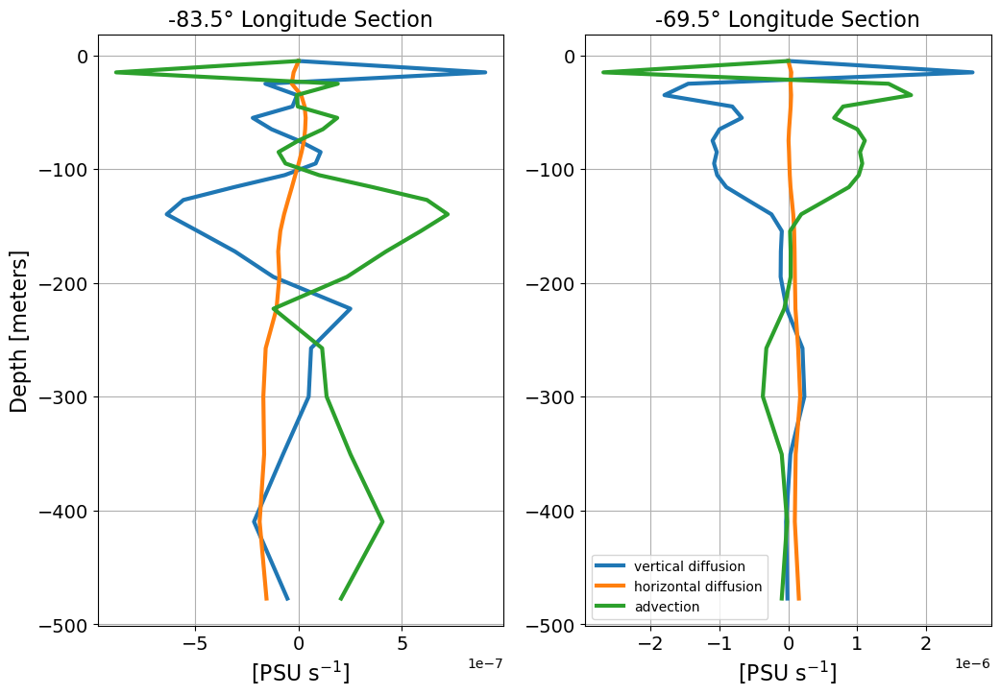

In [1052]:
fig,ax = plt.subplots(1,2,figsize=(12,8))
ax[0].plot((wline.salt_diffusion_v.sum(dim='y').mean(dim='time')*depth_grid),wline.depth,linewidth=3,label='vertical diffusion')
ax[0].plot((wline.salt_diffusion_x.sum(dim='y').mean(dim='time')*depth_grid)+(wline.salt_diffusion_y.sum(dim='y').mean(dim='time')*depth_grid),wline.depth,linewidth=3,label='horizontal diffusion')
ax[0].plot(wline_salt_advection,wline.depth,linewidth=3,label='advection')
ax[0].grid()
ax[0].set_ylabel('Depth [meters]',fontsize=font_size)
ax[0].set_xlabel('[PSU s$^{-1}$]',fontsize=font_size)
ax[0].set_title(f'{wline.x.values}° Longitude Section', fontsize=font_size)
ax[0].tick_params(axis='both', which='major', labelsize=fontsize)

ax[1].plot((eline.salt_diffusion_v.sum(dim='y').mean(dim='time')*depth_grid),eline.depth,linewidth=3,label='vertical diffusion')
ax[1].plot((eline.salt_diffusion_x.sum(dim='y').mean(dim='time')*depth_grid)+(eline.salt_diffusion_y.sum(dim='y').mean(dim='time')*depth_grid),eline.depth,linewidth=3,label='horizontal diffusion')
ax[1].plot(eline_salt_advection,eline.depth,linewidth=3,label='advection')
ax[1].grid()
ax[1].set_xlabel('[PSU s$^{-1}$]',fontsize=font_size)
ax[1].set_title(f'{eline.x.values}° Longitude Section', fontsize=font_size)
ax[1].tick_params(axis='both', which='major', labelsize=fontsize)
ax[1].legend()

Text(0.5, 0, 'Temp Tendency [°C s$^{-1}$]')

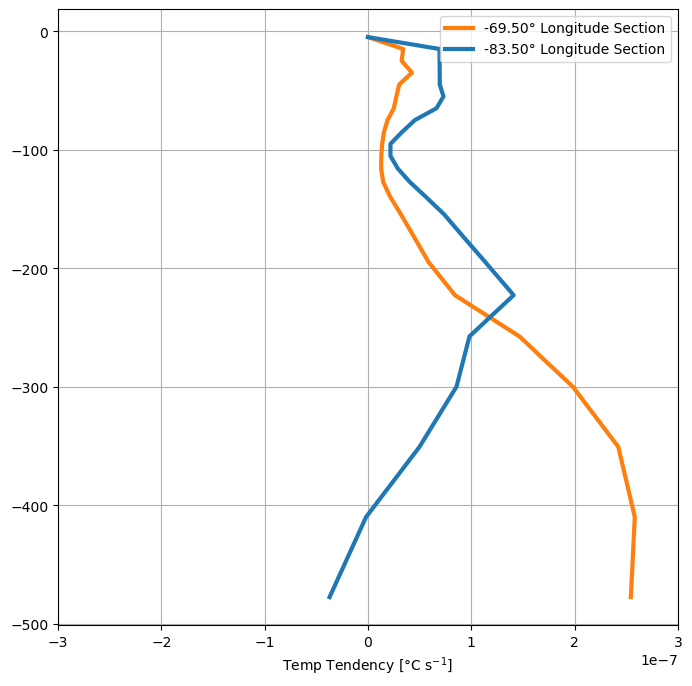

In [797]:




plt.figure(figsize=(8,8))
plt.plot(eline.temp_tendency.sum(dim='y').mean(dim='time')*depth_grid,eline.depth,color='tab:orange',label='%.2f° Longitude Section' %(eline.x.values),linewidth=3)
plt.plot(wline.temp_tendency.sum(dim='y').mean(dim='time')*depth_grid,wline.depth,color='tab:blue',label='%.2f° Longitude Section' %(wline.x.values),linewidth=3)
plt.grid()
plt.xlim(-0.0000003,0.0000003)
plt.legend()
plt.xlabel('Temp Tendency [°C s$^{-1}$]')

Text(0.5, 0, 'Salt Tendency [g kg$^{-1}$ s$^{-1}$]')

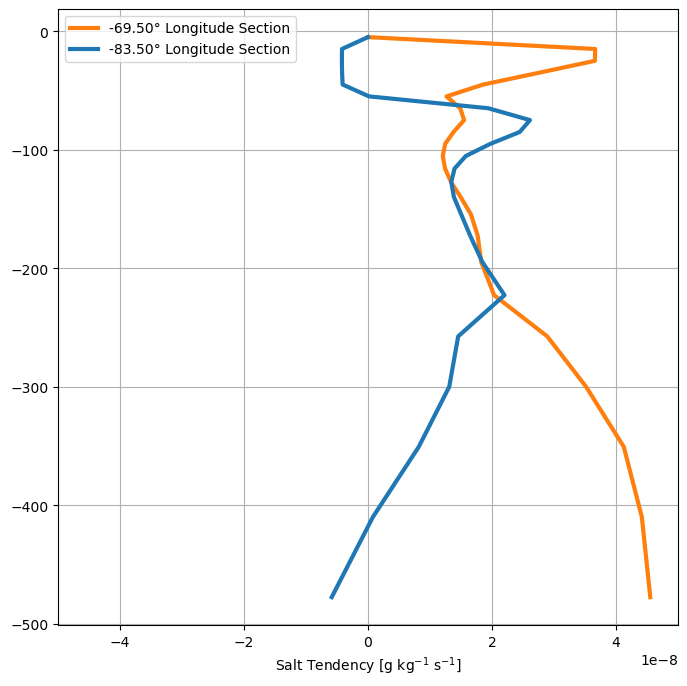

In [799]:
plt.figure(figsize=(8,8))
plt.plot(eline.salt_tendency.sum(dim='y').mean(dim='time')*depth_grid,eline.depth,color='tab:orange',label='%.2f° Longitude Section' %(eline.x.values),linewidth=3)
plt.plot(wline.salt_tendency.sum(dim='y').mean(dim='time')*depth_grid,wline.depth,color='tab:blue',label='%.2f° Longitude Section' %(wline.x.values),linewidth=3)
plt.grid()
plt.xlim(-0.00000005,0.00000005)
plt.legend()
plt.xlabel('Salt Tendency [g kg$^{-1}$ s$^{-1}$]')

Text(0.5, 0, 'Vertical Salt Advection [g kg$^{-1}$ s$^{-1}$]')

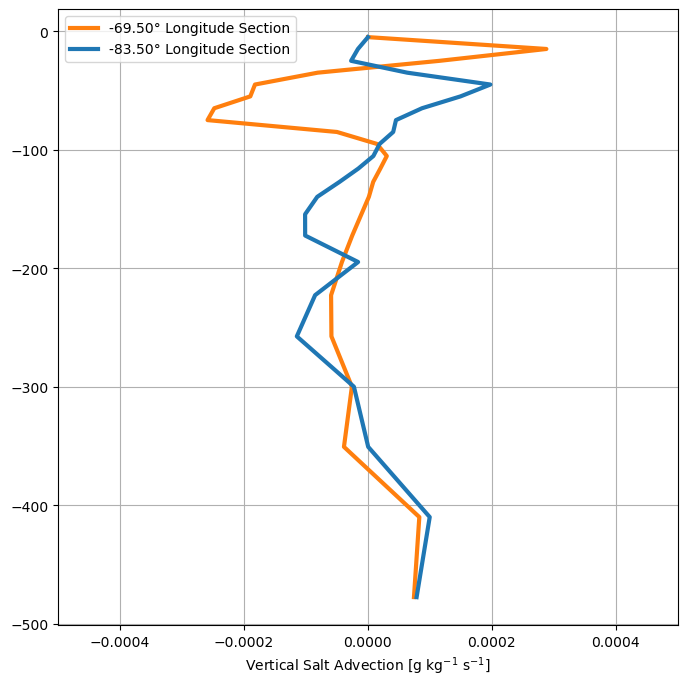

In [899]:
plt.figure(figsize=(8,8))
plt.plot(eline.salt_advection_v.sum(dim='y').mean(dim='time')*depth_grid,eline.depth,color='tab:orange',label='%.2f° Longitude Section' %(eline.x.values),linewidth=3)
plt.plot(wline.salt_advection_v.sum(dim='y').mean(dim='time')*depth_grid,wline.depth,color='tab:blue',label='%.2f° Longitude Section' %(wline.x.values),linewidth=3)
plt.grid()
plt.xlim(-0.0005,0.0005)
plt.legend()
plt.xlabel('Vertical Salt Advection [g kg$^{-1}$ s$^{-1}$]')

Text(0.5, 0, 'Horizontal Salt Advection [g kg$^{-1}$ s$^{-1}$]')

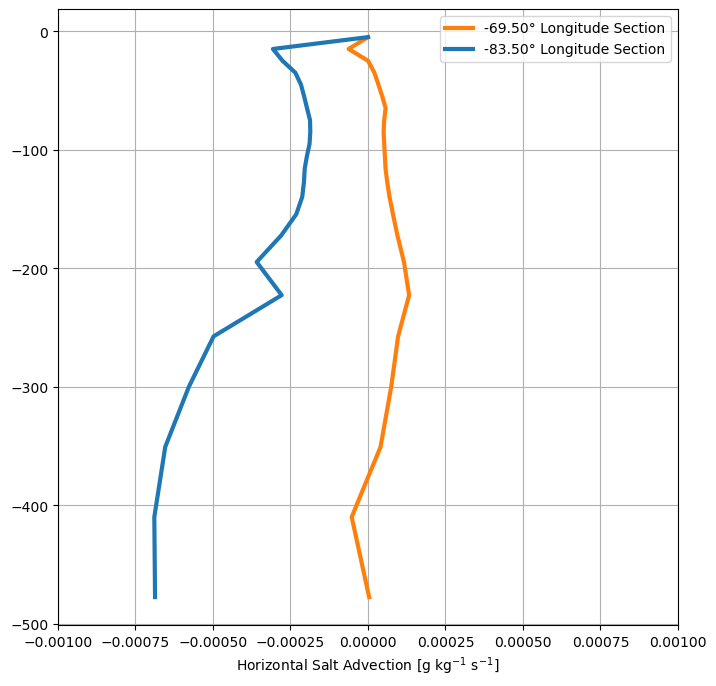

In [898]:
plt.figure(figsize=(8,8))
plt.plot(eline.salt_advection_x.sum(dim='y').mean(dim='time')*depth_grid,eline.depth,color='tab:orange',label='%.2f° Longitude Section' %(eline.x.values),linewidth=3)
plt.plot(wline.salt_advection_x.sum(dim='y').mean(dim='time')*depth_grid,wline.depth,color='tab:blue',label='%.2f° Longitude Section' %(wline.x.values),linewidth=3)
plt.grid()
plt.xlim(-0.001,0.001)
plt.legend()
plt.xlabel('Horizontal Salt Advection [g kg$^{-1}$ s$^{-1}$]')

Text(0.5, 0, 'Vertical Salt Diffusion [g kg$^{-1}$ s$^{-1}$]')

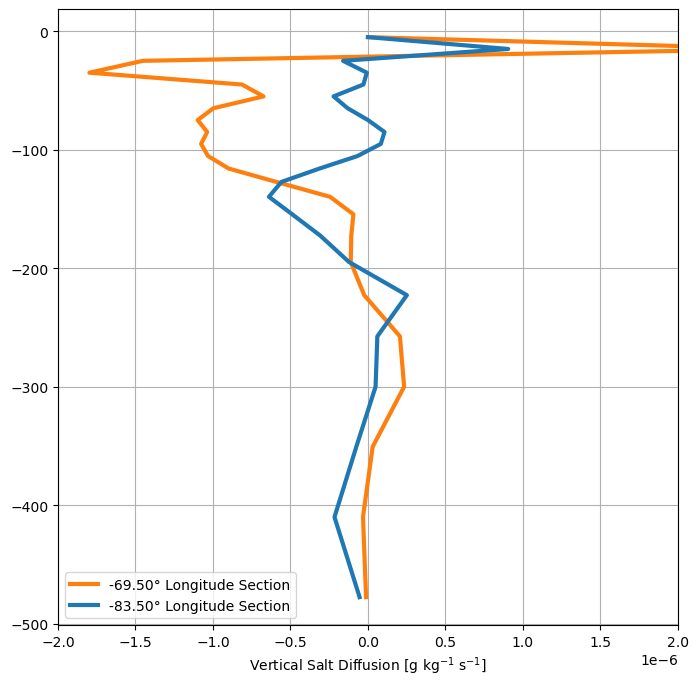

In [897]:
plt.figure(figsize=(8,8))
plt.plot(eline.salt_diffusion_v.sum(dim='y').mean(dim='time')*depth_grid,eline.depth,color='tab:orange',label='%.2f° Longitude Section' %(eline.x.values),linewidth=3)
plt.plot(wline.salt_diffusion_v.sum(dim='y').mean(dim='time')*depth_grid,wline.depth,color='tab:blue',label='%.2f° Longitude Section' %(wline.x.values),linewidth=3)
plt.grid()
plt.xlim(-0.000002,0.000002)
plt.legend()
plt.xlabel('Vertical Salt Diffusion [g kg$^{-1}$ s$^{-1}$]')

Text(0.5, 0, 'Horizontal Salt Diffusion [g kg$^{-1}$ s$^{-1}$]')

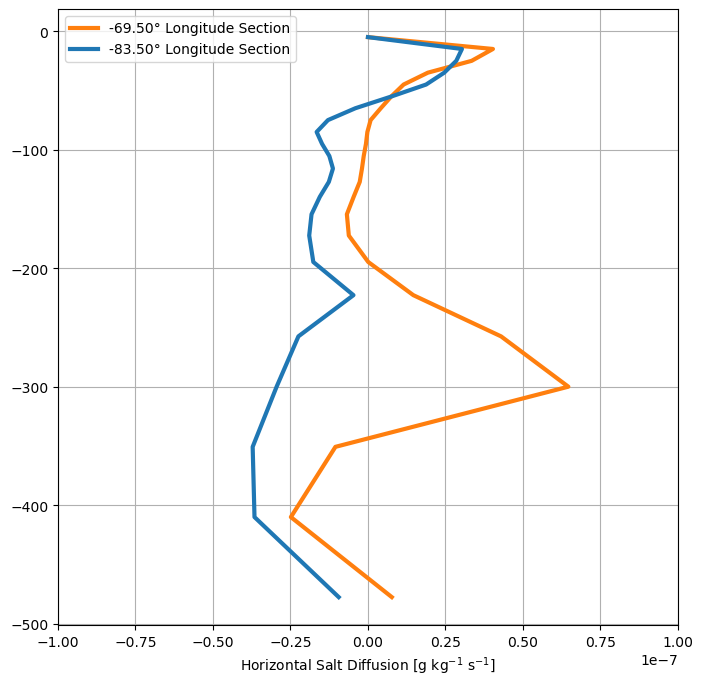

In [896]:
plt.figure(figsize=(8,8))
plt.plot(eline.salt_diffusion_x.sum(dim='y').mean(dim='time')*depth_grid,eline.depth,color='tab:orange',label='%.2f° Longitude Section' %(eline.x.values),linewidth=3)
plt.plot(wline.salt_diffusion_x.sum(dim='y').mean(dim='time')*depth_grid,wline.depth,color='tab:blue',label='%.2f° Longitude Section' %(wline.x.values),linewidth=3)
plt.grid()
plt.xlim(-0.0000001,0.0000001)
plt.legend()
plt.xlabel('Horizontal Salt Diffusion [g kg$^{-1}$ s$^{-1}$]')

Text(0.5, 0, 'Vertical Temperature Advection [°C s$^{-1}$]')

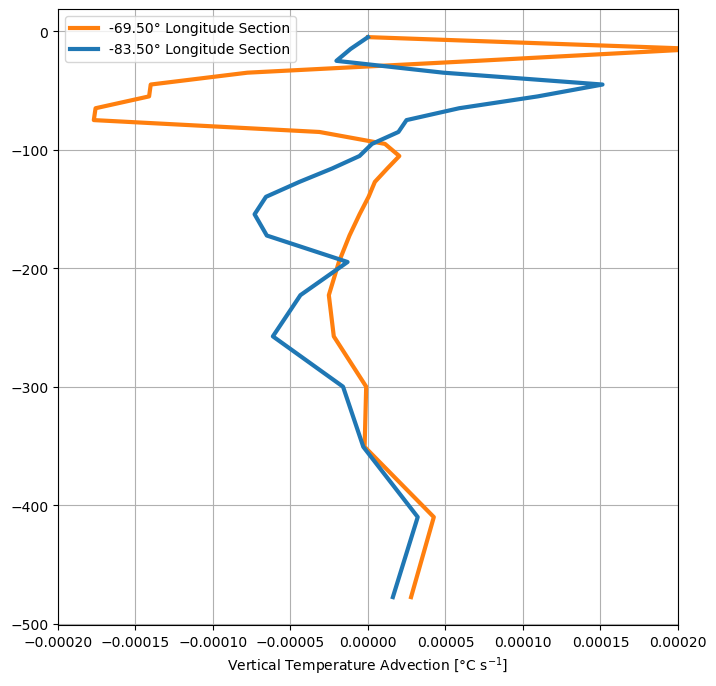

In [901]:
plt.figure(figsize=(8,8))
plt.plot(eline.temp_advection_v.sum(dim='y').mean(dim='time')*depth_grid,eline.depth,color='tab:orange',label='%.2f° Longitude Section' %(eline.x.values),linewidth=3)
plt.plot(wline.temp_advection_v.sum(dim='y').mean(dim='time')*depth_grid,wline.depth,color='tab:blue',label='%.2f° Longitude Section' %(wline.x.values),linewidth=3)
plt.grid()
plt.xlim(-0.0002,0.0002)
plt.legend()
plt.xlabel('Vertical Temperature Advection [°C s$^{-1}$]')

Text(0.5, 0, 'Horizontal Temperature Advection [°C s$^{-1}$]')

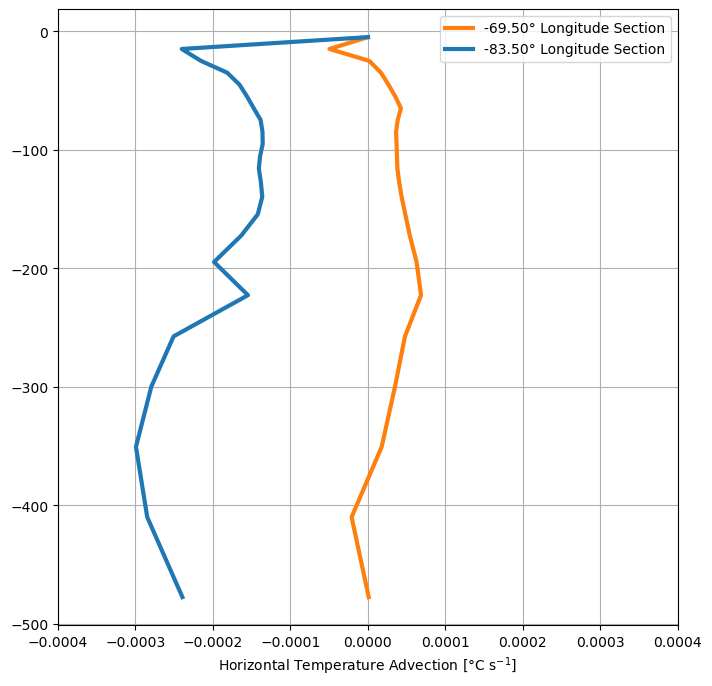

In [904]:
plt.figure(figsize=(8,8))
plt.plot(eline.temp_advection_x.sum(dim='y').mean(dim='time')*depth_grid,eline.depth,color='tab:orange',label='%.2f° Longitude Section' %(eline.x.values),linewidth=3)
plt.plot(wline.temp_advection_x.sum(dim='y').mean(dim='time')*depth_grid,wline.depth,color='tab:blue',label='%.2f° Longitude Section' %(wline.x.values),linewidth=3)
plt.grid()
plt.xlim(-0.0004,0.0004)
plt.legend()
plt.xlabel('Horizontal Temperature Advection [°C s$^{-1}$]')

Text(0.5, 0, 'Horizontal Temperature Diffusion [°C s$^{-1}$]')

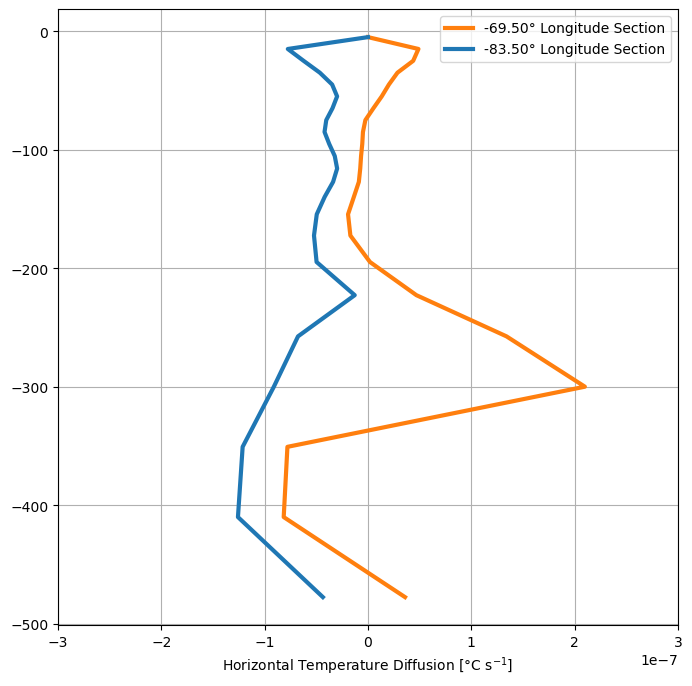

In [909]:
plt.figure(figsize=(8,8))
plt.plot(eline.temp_diffusion_x.sum(dim='y').mean(dim='time')*depth_grid,eline.depth,color='tab:orange',label='%.2f° Longitude Section' %(eline.x.values),linewidth=3)
plt.plot(wline.temp_diffusion_x.sum(dim='y').mean(dim='time')*depth_grid,wline.depth,color='tab:blue',label='%.2f° Longitude Section' %(wline.x.values),linewidth=3)
plt.grid()
plt.xlim(-0.0000003,0.0000003)
plt.legend()
plt.xlabel('Horizontal Temperature Diffusion [°C s$^{-1}$]')

Text(0.5, 0, 'Vertical Temperature Diffusion [°C s$^{-1}$]')

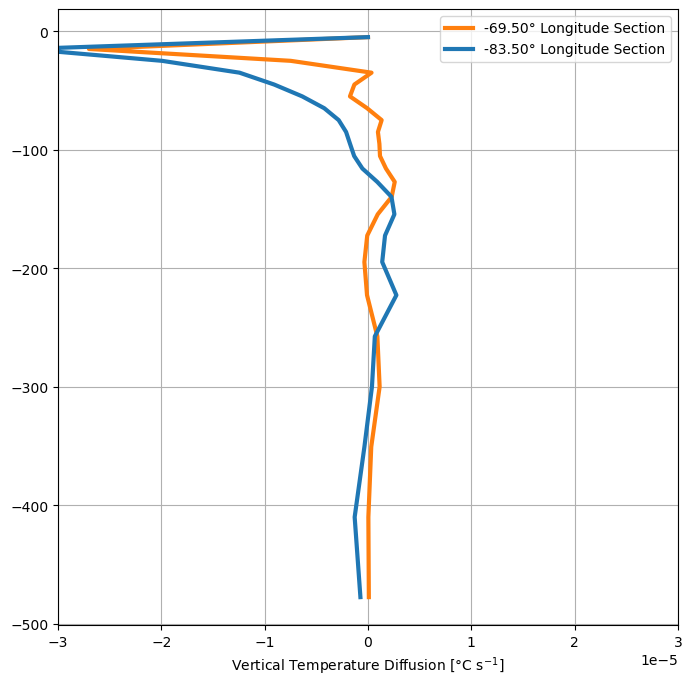

In [914]:
plt.figure(figsize=(8,8))
plt.plot(eline.temp_diffusion_v.sum(dim='y').mean(dim='time')*depth_grid,eline.depth,color='tab:orange',label='%.2f° Longitude Section' %(eline.x.values),linewidth=3)
plt.plot(wline.temp_diffusion_v.sum(dim='y').mean(dim='time')*depth_grid,wline.depth,color='tab:blue',label='%.2f° Longitude Section' %(wline.x.values),linewidth=3)
plt.grid()
plt.xlim(-0.00003,0.00003)
plt.legend()
plt.xlabel('Vertical Temperature Diffusion [°C s$^{-1}$]')

## Yucatan Transect

In [17]:
import xarray as xr
import numpy as np

from pyproj import Geod

geodesic = Geod(ellps="WGS84")  # define the coordinate system. WGS84 is the standard used by GPS.


def calculate_transect(start, end, dist=5000):
    from pyproj import Geod
    g = Geod(ellps="WGS84")
    
    pts = g.inv_intermediate(start[0], start[1], end[0], end[1], 0, dist) 
    _, _, dist = g.inv(np.full(len(pts.lons), start[0]), np.full(len(pts.lons), start[1]), pts.lons, pts.lats)
    return np.column_stack([pts.lons, pts.lats]), dist


def reckon(origin_lon, origin_lat, forward_azimuth, distance):
    """
    Calculate lon, lat of a point from a specified azimuth, distance on sphere or ellipsoid
    Helper function for pyproj.Geod forward transformation

    Args:
        origin_lon (array, numpy.ndarray, list, tuple, or scalar):
            Longitude(s) of initial point(s)
        origin_lat (array, numpy.ndarray, list, tuple, or scalar):
            Latitude(s) of initial point(s)
        forward_azimuth (array, numpy.ndarray, list, tuple, or scalar):
            Azimuth/bearing(s) of the terminus point relative to the initial point(s)
        distance (array, numpy.ndarray, list, tuple, or scalar):
            Distance(s) between initial and terminus point(s) in kilometers

    Returns:
        array, numpy.ndarray, list, tuple, or scalar: Longitude(s) of terminus point(s)
        array, numpy.ndarray, list, tuple, or scalar: Latitude(s) of terminus point(s)
        array, numpy.ndarray, list, tuple, or scalar: Backwards azimuth(s) of terminus point(s)
    """
    terminus_lon, terminus_lat, _ = geodesic.fwd(origin_lon, origin_lat, forward_azimuth, distance * 1000)
    return terminus_lon, terminus_lat


# Isla Contoy to Cuba
lons = [-86.5, -83]
lats = [17.8, 25]

start = np.mean([-86.7878500, -86.8676667]), np.mean([21.4719000, 20.8679333])
end = reckon(start[0], start[1], 105, 250)
pts, dist = calculate_transect(start, end, 6000)



# Interpolate Copernicus Transect
yucatan = ds.interp(
    x=xr.DataArray(pts[:,0], dims="point"),
    y=xr.DataArray(pts[:,1], dims="point"),
)

/Users/joegradone/anaconda3/envs/rutgers-phd/lib/python3.11/site-packages/pyproj/geod.py:681: UserWarning: Back azimuth is being returned by default to be compatible with fwd()This is a breaking change for pyproj 3.5+.To avoid this warning, set return_back_azimuth=True.Otherwise, to restore old behaviour, set return_back_azimuth=False.This warning will be removed in future version.
  warnings.warn(


In [18]:
yucatan

<xarray.Dataset>
Dimensions:           (time: 4747, depth: 23, point: 41)
Coordinates:
  * time              (time) datetime64[ns] 2005-01-01T12:00:00 ... 2017-12-3...
  * depth             (depth) float32 -5.0 -15.0 -25.0 ... -350.7 -409.9 -477.5
    spatial_ref       int64 0
    x                 (point) float64 -86.77 -86.72 -86.66 ... -84.62 -84.57
    y                 (point) float64 21.16 21.14 21.13 ... 20.61 20.6 20.58
Dimensions without coordinates: point
Data variables: (12/20)
    temp_tendency     (point, depth, time) float64 nan nan ... 2.952e-08
    temp_advection_x  (point, depth, time) float64 nan nan ... -1.505e-06
    temp_advection_y  (point, depth, time) float64 nan nan ... 1.589e-06
    temp_advection_v  (point, depth, time) float64 nan nan ... -1.144e-07
    temp_diffusion_x  (point, depth, time) float64 nan nan ... -2.459e-09
    temp_diffusion_y  (point, depth, time) float64 nan nan ... -1.466e-09
    ...                ...
    salt_diffusion_y  (point, depth, time) float64 nan nan ... -3.322e-10
    salt_diffusion_v  (point, depth, time) float64 nan nan ... -8.075e-11
    salt_forcing      (point, depth, time) float64 nan nan nan ... 0.0 0.0 0.0
    salt              (point, depth, time) float64 nan nan nan ... 35.46 35.46
    SWpen             (point, depth, time) float64 nan nan nan ... 0.0 0.0 0.0
    Qnet              (point, depth, time) float64 nan nan nan ... 0.0 0.0 0.0

/var/folders/m9/d8bbz1wx4f50q99kfb1jv9pw0000gn/T/ipykernel_22084/2016188934.py:8: UserWarning: The following kwargs were not used by contour: 'linewidth'
  cs = ax[0].contour(yucatan.point,yucatan.depth,yucatan.salt.mean(dim='time').transpose(),[35,35.25,35.5,35.75,36,36.25,36.5,36.75,36.9],colors='black',linewidth=5)
/var/folders/m9/d8bbz1wx4f50q99kfb1jv9pw0000gn/T/ipykernel_22084/2016188934.py:15: UserWarning: The following kwargs were not used by contour: 'linewidth'
  cs = ax[1].contour(eline.y,eline.depth,eline.salt.mean(dim='time').transpose(),[35,35.25,35.5,35.75,36,36.25,36.5,36.75,36.9],colors='black',linewidth=5)


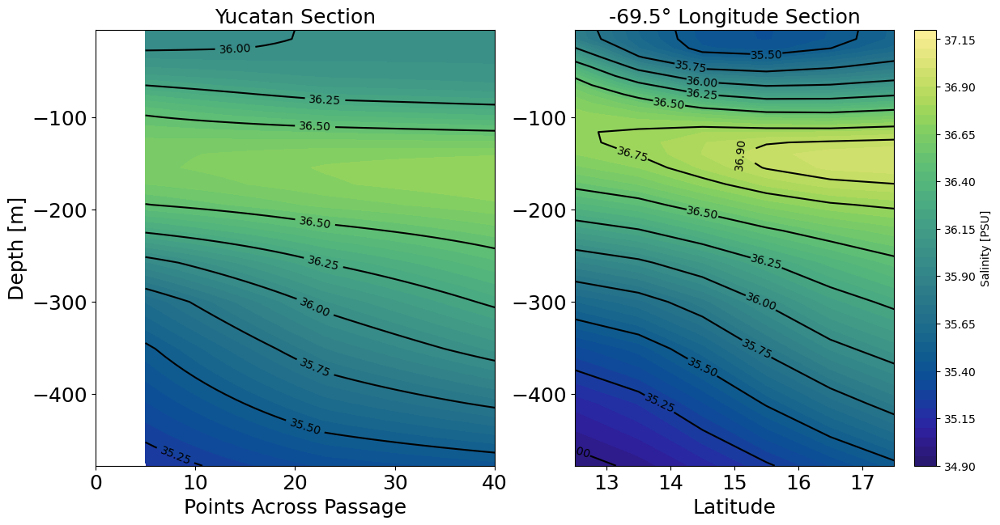

In [42]:
fig, ax = plt.subplots(1,2, figsize=(14,7))

ax[0].contourf(yucatan.point,yucatan.depth,yucatan.salt.mean(dim='time').transpose(),levels=np.arange(34.9,37.2,0.05),cmap=cmo.haline)
ax[0].set_xlabel('Points Across Passage',size=fontsize)
ax[0].set_ylabel('Depth [m]',size=fontsize)
ax[0].tick_params(axis='both', which='major', labelsize=fontsize)
ax[0].set_title('Yucatan Section', fontsize=font_size)
cs = ax[0].contour(yucatan.point,yucatan.depth,yucatan.salt.mean(dim='time').transpose(),[35,35.25,35.5,35.75,36,36.25,36.5,36.75,36.9],colors='black',linewidth=5)
ax[0].clabel(cs, inline=True, fontsize=10)

im = ax[1].contourf(eline.y,eline.depth,eline.salt.mean(dim='time').transpose(),levels=np.arange(34.9,37.2,0.05),cmap=cmo.haline)
ax[1].set_xlabel('Latitude',size=fontsize)
ax[1].tick_params(axis='both', which='major', labelsize=fontsize)
ax[1].set_title(f'{eline.x.values}° Longitude Section', fontsize=font_size)
cs = ax[1].contour(eline.y,eline.depth,eline.salt.mean(dim='time').transpose(),[35,35.25,35.5,35.75,36,36.25,36.5,36.75,36.9],colors='black',linewidth=5)
ax[1].clabel(cs, inline=True, fontsize=10)

fig.colorbar(im,label='Salinity [PSU]')



In [19]:
# depth_grid = np.append(0,-np.diff(yucatan.depth))

yucatan_temp_tendency = yucatan.temp_tendency.sum(dim='point').mean(dim='time')*depth_grid
yucatan_temp_advection = (yucatan.temp_advection_x.sum(dim='point').mean(dim='time')*depth_grid)+(yucatan.temp_advection_y.sum(dim='point').mean(dim='time')*depth_grid)+(yucatan.temp_advection_v.sum(dim='point').mean(dim='time')*depth_grid)
yucatan_temp_diffusion = (yucatan.temp_diffusion_x.sum(dim='point').mean(dim='time')*depth_grid)+(yucatan.temp_diffusion_y.sum(dim='point').mean(dim='time')*depth_grid)+(yucatan.temp_diffusion_v.sum(dim='point').mean(dim='time')*depth_grid)
yucatan_temp_forcing = yucatan.temp_forcing.sum(dim='point').mean(dim='time')*depth_grid
yucatan_temp_RHS = yucatan_temp_advection+yucatan_temp_diffusion+yucatan_temp_forcing
yucatan_temp_resid = yucatan_temp_tendency-yucatan_temp_RHS

yucatan_salt_tendency = yucatan.salt_tendency.sum(dim='point').mean(dim='time')*depth_grid
yucatan_salt_advection = (yucatan.salt_advection_x.sum(dim='point').mean(dim='time')*depth_grid)+(yucatan.salt_advection_y.sum(dim='point').mean(dim='time')*depth_grid)+(yucatan.salt_advection_v.sum(dim='point').mean(dim='time')*depth_grid)
yucatan_salt_diffusion = (yucatan.salt_diffusion_x.sum(dim='point').mean(dim='time')*depth_grid)+(yucatan.salt_diffusion_y.sum(dim='point').mean(dim='time')*depth_grid)+(yucatan.salt_diffusion_v.sum(dim='point').mean(dim='time')*depth_grid)
yucatan_salt_forcing = yucatan.salt_forcing.sum(dim='point').mean(dim='time')*depth_grid
yucatan_salt_RHS = yucatan_salt_advection+yucatan_salt_diffusion+yucatan_salt_forcing
yucatan_salt_resid = yucatan_salt_tendency-yucatan_salt_RHS





(-5e-06, 5e-06)

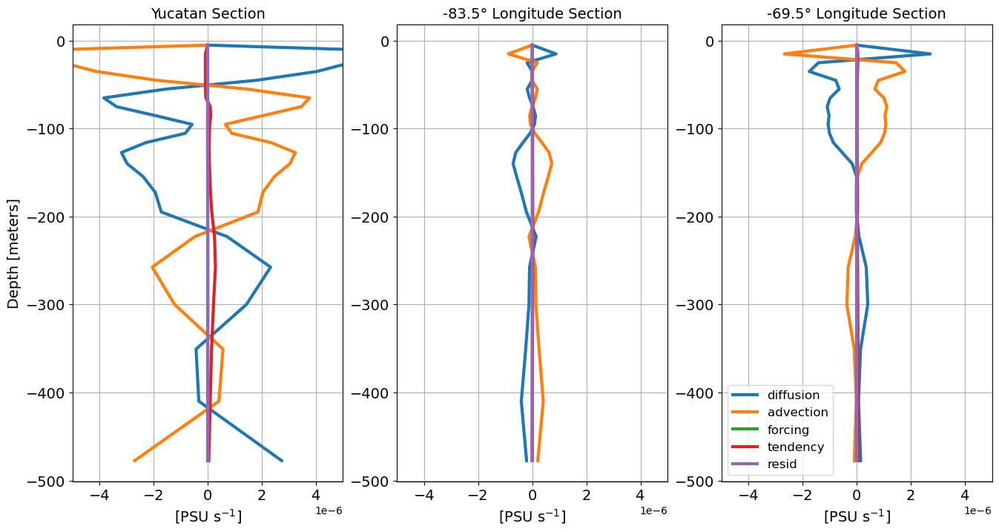

In [22]:
fig,ax = plt.subplots(1,3,figsize=(16,8))
font_size=14
xmax = 0.000005
xmin = -xmax

ax[0].plot(yucatan_salt_diffusion,yucatan.depth,linewidth=3,label='diffusion')
ax[0].plot(yucatan_salt_advection,yucatan.depth,linewidth=3,label='advection')
ax[0].plot(yucatan_salt_forcing,yucatan.depth,linewidth=3,label='forcing')
ax[0].plot(yucatan_salt_tendency,yucatan.depth,linewidth=3,label='tendency')
ax[0].plot(yucatan_salt_resid,yucatan.depth,linewidth=3,label='resid')
ax[0].grid()
ax[0].set_ylabel('Depth [meters]',fontsize=font_size)
ax[0].set_xlabel('[PSU s$^{-1}$]',fontsize=font_size)
ax[0].set_title('Yucatan Section', fontsize=font_size)
ax[0].tick_params(axis='both', which='major', labelsize=fontsize)
ax[0].set_xlim(xmin,xmax)

ax[1].plot(wline_salt_diffusion,wline.depth,linewidth=3,label='diffusion')
ax[1].plot(wline_salt_advection,wline.depth,linewidth=3,label='advection')
ax[1].plot(wline_salt_forcing,wline.depth,linewidth=3,label='forcing')
ax[1].plot(wline_salt_tendency,wline.depth,linewidth=3,label='tendency')
ax[1].plot(wline_salt_resid,wline.depth,linewidth=3,label='resid')
ax[1].grid()
ax[1].set_xlabel('[PSU s$^{-1}$]',fontsize=font_size)
ax[1].set_title(f'{wline.x.values}° Longitude Section', fontsize=font_size)
ax[1].tick_params(axis='both', which='major', labelsize=fontsize)
ax[1].set_xlim(xmin,xmax)

ax[2].plot(eline_salt_diffusion,eline.depth,linewidth=3,label='diffusion')
ax[2].plot(eline_salt_advection,eline.depth,linewidth=3,label='advection')
ax[2].plot(eline_salt_forcing,eline.depth,linewidth=3,label='forcing')
ax[2].plot(eline_salt_tendency,eline.depth,linewidth=3,label='tendency')
ax[2].plot(eline_salt_resid,eline.depth,linewidth=3,label='resid')
ax[2].grid()
ax[2].legend(fontsize=font_size-2)
ax[2].set_xlabel('[PSU s$^{-1}$]',fontsize=font_size)
ax[2].set_title(f'{eline.x.values}° Longitude Section', fontsize=font_size)
ax[2].tick_params(axis='both', which='major', labelsize=fontsize)
ax[2].set_xlim(xmin,xmax)

(-0.002, 0.002)

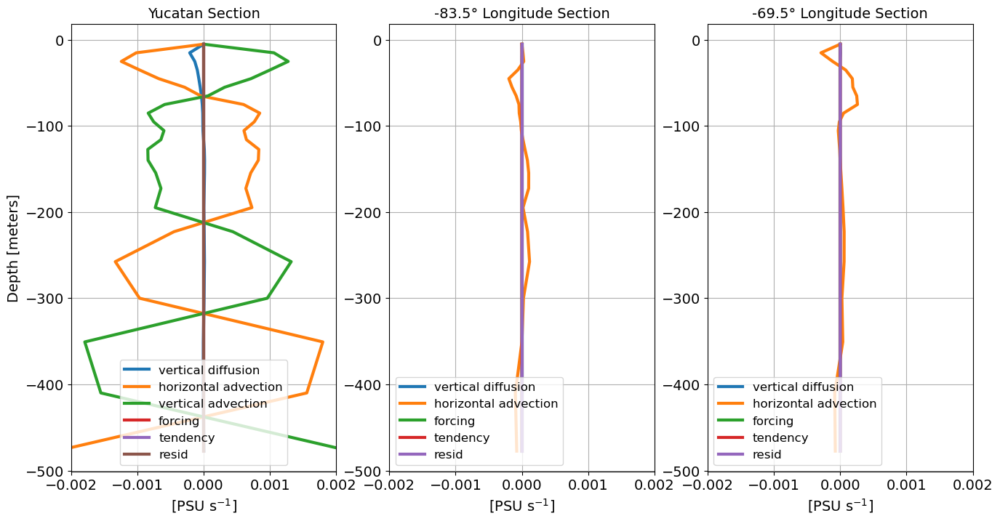

In [34]:
fig,ax = plt.subplots(1,3,figsize=(16,8))
xmax = 0.002
xmin = -xmax

ax[0].plot((yucatan.temp_diffusion_v.sum(dim='point').mean(dim='time')*depth_grid),yucatan.depth,linewidth=3,label='vertical diffusion')
ax[0].plot((yucatan.temp_advection_x.sum(dim='point').mean(dim='time')*depth_grid)+(yucatan.temp_advection_y.sum(dim='point').mean(dim='time')*depth_grid),yucatan.depth,linewidth=3,label='horizontal advection')
ax[0].plot((yucatan.temp_advection_v.sum(dim='point').mean(dim='time')*depth_grid),yucatan.depth,linewidth=3,label='vertical advection')
ax[0].plot(yucatan_salt_forcing,yucatan.depth,linewidth=3,label='forcing')
ax[0].plot(yucatan_salt_tendency,yucatan.depth,linewidth=3,label='tendency')
ax[0].plot(yucatan_salt_resid,yucatan.depth,linewidth=3,label='resid')
ax[0].grid()
ax[0].set_ylabel('Depth [meters]',fontsize=font_size)
ax[0].set_xlabel('[PSU s$^{-1}$]',fontsize=font_size)
ax[0].set_title('Yucatan Section', fontsize=font_size)
ax[0].tick_params(axis='both', which='major', labelsize=fontsize)
ax[0].set_xlim(xmin,xmax)
ax[0].legend(fontsize=font_size-2)

ax[1].plot((wline.salt_diffusion_v.sum(dim='y').mean(dim='time')*depth_grid),wline.depth,linewidth=3,label='vertical diffusion')
ax[1].plot((wline.salt_advection_x.sum(dim='y').mean(dim='time')*depth_grid)+(wline.salt_advection_y.sum(dim='y').mean(dim='time')*depth_grid),eline.depth,linewidth=3,label='horizontal advection')
ax[1].plot(wline_salt_forcing,wline.depth,linewidth=3,label='forcing')
ax[1].plot(wline_salt_tendency,wline.depth,linewidth=3,label='tendency')
ax[1].plot(wline_salt_resid,wline.depth,linewidth=3,label='resid')
ax[1].grid()
ax[1].set_xlabel('[PSU s$^{-1}$]',fontsize=font_size)
ax[1].set_title(f'{wline.x.values}° Longitude Section', fontsize=font_size)
ax[1].tick_params(axis='both', which='major', labelsize=fontsize)
ax[1].set_xlim(xmin,xmax)
ax[1].legend(fontsize=font_size-2)

ax[2].plot((eline.salt_diffusion_v.sum(dim='y').mean(dim='time')*depth_grid),eline.depth,linewidth=3,label='vertical diffusion')
ax[2].plot((eline.salt_advection_x.sum(dim='y').mean(dim='time')*depth_grid)+(eline.salt_advection_y.sum(dim='y').mean(dim='time')*depth_grid),eline.depth,linewidth=3,label='horizontal advection')
ax[2].plot(eline_salt_forcing,eline.depth,linewidth=3,label='forcing')
ax[2].plot(eline_salt_tendency,eline.depth,linewidth=3,label='tendency')
ax[2].plot(eline_salt_resid,eline.depth,linewidth=3,label='resid')
ax[2].grid()
ax[2].legend(fontsize=font_size-2)
ax[2].set_xlabel('[PSU s$^{-1}$]',fontsize=font_size)
ax[2].set_title(f'{eline.x.values}° Longitude Section', fontsize=font_size)
ax[2].tick_params(axis='both', which='major', labelsize=fontsize)
ax[2].set_xlim(xmin,xmax)

## RMSE

In [34]:
# temp_tendency_hadvectionx_rmse = np.empty(ds.temp.shape[0:3])
# temp_tendency_hadvectionx_rmse[:] = np.nan
# temp_tendency_hadvectiony_rmse = np.empty(ds.temp.shape[0:3])
# temp_tendency_hadvectiony_rmse[:] = np.nan
# temp_tendency_vadvection_rmse = np.empty(ds.temp.shape[0:3])
# temp_tendency_vadvection_rmse[:] = np.nan
# temp_tendency_hdiffusionx_rmse = np.empty(ds.temp.shape[0:3])
# temp_tendency_hdiffusionx_rmse[:] = np.nan
# temp_tendency_hdiffusiony_rmse = np.empty(ds.temp.shape[0:3])
# temp_tendency_hdiffusiony_rmse[:] = np.nan
# temp_tendency_vdiffusion_rmse = np.empty(ds.temp.shape[0:3])
# temp_tendency_vdiffusion_rmse[:] = np.nan
# temp_tendency_SWpen_rmse = np.empty(ds.temp.shape[0:3])
# temp_tendency_SWpen_rmse[:] = np.nan
# temp_tendency_Qnet_rmse = np.empty(ds.temp.shape[0:3])
# temp_tendency_Qnet_rmse[:] = np.nan

# for x in range(0,len(ds.x)):
#     for y in range(0,len(ds.y)):
#         for depth in range(0,len(ds.depth)):
#             ## Pull out tendency values at specific point
#             checknan = ds.temp_tendency.isel(x=x,y=y,depth=depth)

#             ## Check if values for all times are nan, if not do the correlation
#             if np.sum(np.isnan(checknan.values))!=len(ds.time):
#                 temp_tendency_hadvectionx_rmse[y,x,depth] = mean_squared_error(ds.temp_tendency.isel(x=x,y=y,depth=depth),ds.temp_advection_x.isel(x=x,y=y,depth=depth))
#                 temp_tendency_hadvectiony_rmse[y,x,depth] = mean_squared_error(ds.temp_tendency.isel(x=x,y=y,depth=depth),ds.temp_advection_y.isel(x=x,y=y,depth=depth))
#                 temp_tendency_vadvection_rmse[y,x,depth] = mean_squared_error(ds.temp_tendency.isel(x=x,y=y,depth=depth),ds.temp_advection_v.isel(x=x,y=y,depth=depth))
                
#                 temp_tendency_hdiffusionx_rmse[y,x,depth] = mean_squared_error(ds.temp_tendency.isel(x=x,y=y,depth=depth),ds.temp_diffusion_x.isel(x=x,y=y,depth=depth))
#                 temp_tendency_hdiffusiony_rmse[y,x,depth] = mean_squared_error(ds.temp_tendency.isel(x=x,y=y,depth=depth),ds.temp_diffusion_y.isel(x=x,y=y,depth=depth))
#                 temp_tendency_vdiffusion_rmse[y,x,depth] = mean_squared_error(ds.temp_tendency.isel(x=x,y=y,depth=depth),ds.temp_diffusion_v.isel(x=x,y=y,depth=depth))
                
#                 temp_tendency_SWpen_rmse[y,x,depth] = mean_squared_error(ds.temp_tendency.isel(x=x,y=y,depth=depth),ds.SWpen.isel(x=x,y=y,depth=depth))
#                 temp_tendency_Qnet_rmse[y,x,depth] = mean_squared_error(ds.temp_tendency.isel(x=x,y=y,depth=depth),ds.Qnet.isel(x=x,y=y,depth=depth))


In [ ]:
# for k in np.arange(0,len(ds.depth)):

#     fig, ax = plt.subplots(2,4, figsize=(16,7), subplot_kw=dict(projection=cartopy.crs.PlateCarree()), constrained_layout=True)
    
#     s=0.9

#     ####################################################################################################################################################
#     ax[0,0].pcolormesh(ds.x,ds.y,temp_tendency_hadvectionx_rmse[:,:,k],transform =cartopy.crs.PlateCarree(),cmap='Reds')
#     ax[0,0].coastlines(linewidth=1.0,zorder=10)
#     ax[0,0].add_feature(cartopy.feature.LAND,zorder=10)
#     ax[0,0].set_title('E-W Heat Advection')
#     glb = ax[0,0].gridlines(draw_labels=True, alpha=0.5, linewidth=.5 )
#     glb.xlabels_top = glb.ylabels_right = False
#     ####################################################################################################################################################
    
#     ####################################################################################################################################################
#     ax[0,1].pcolormesh(ds.x,ds.y,temp_tendency_hadvectiony_rmse[:,:,k],transform =cartopy.crs.PlateCarree(),cmap='Reds')
#     ax[0,1].coastlines(linewidth=1.0,zorder=10)
#     ax[0,1].add_feature(cartopy.feature.LAND,zorder=10)
#     ax[0,1].set_title('N-S Heat Advection')
#     glb = ax[0,1].gridlines(draw_labels=True, alpha=0.5, linewidth=.5 )
#     glb.xlabels_top = glb.ylabels_right = False
#     ####################################################################################################################################################
    
    
#     ####################################################################################################################################################
#     ax[0,2].pcolormesh(ds.x,ds.y,temp_tendency_vadvection_rmse[:,:,k],transform =cartopy.crs.PlateCarree(),cmap='Reds')
#     ax[0,2].coastlines(linewidth=1.0,zorder=10)
#     ax[0,2].add_feature(cartopy.feature.LAND,zorder=10)
#     ax[0,2].set_title('Vertical Heat Advection')
#     glb = ax[0,2].gridlines(draw_labels=True, alpha=0.5, linewidth=.5 )
#     glb.xlabels_top = glb.ylabels_right = False
#     ####################################################################################################################################################
    
#     ####################################################################################################################################################
#     ax[0,3].pcolormesh(ds.x,ds.y,temp_tendency_SWpen_rmse[:,:,k],transform =cartopy.crs.PlateCarree(),cmap='Reds')
#     ax[0,3].coastlines(linewidth=1.0,zorder=10)
#     ax[0,3].add_feature(cartopy.feature.LAND,zorder=10)
#     ax[0,3].set_title('Shortwave Radiation')
#     glb = ax[0,3].gridlines(draw_labels=True, alpha=0.5, linewidth=.5 )
#     glb.xlabels_top = glb.ylabels_right = False
#     ####################################################################################################################################################
    
#     ####################################################################################################################################################
#     ax[1,0].pcolormesh(ds.x,ds.y,temp_tendency_hdiffusionx_rmse[:,:,k],transform =cartopy.crs.PlateCarree(),cmap='Reds')
#     ax[1,0].coastlines(linewidth=1.0,zorder=10)
#     ax[1,0].add_feature(cartopy.feature.LAND,zorder=10)
#     ax[1,0].set_title('E-W Heat Diffusion')
#     glb = ax[1,0].gridlines(draw_labels=True, alpha=0.5, linewidth=.5 )
#     glb.xlabels_top = glb.ylabels_right = False
#     ####################################################################################################################################################
    
#     ####################################################################################################################################################
#     ax[1,1].pcolormesh(ds.x,ds.y,temp_tendency_hdiffusiony_rmse[:,:,k],transform =cartopy.crs.PlateCarree(),cmap='Reds')
#     ax[1,1].coastlines(linewidth=1.0,zorder=10)
#     ax[1,1].add_feature(cartopy.feature.LAND,zorder=10)
#     ax[1,1].set_title('N-S Heat Diffusion')
#     glb = ax[1,1].gridlines(draw_labels=True, alpha=0.5, linewidth=.5 )
#     glb.xlabels_top = glb.ylabels_right = False
#     ####################################################################################################################################################
    
#     ####################################################################################################################################################
#     ax[1,2].pcolormesh(ds.x,ds.y,temp_tendency_vdiffusion_rmse[:,:,k],transform =cartopy.crs.PlateCarree(),cmap='Reds')
#     ax[1,2].coastlines(linewidth=1.0,zorder=10)
#     ax[1,2].add_feature(cartopy.feature.LAND,zorder=10)
#     ax[1,2].set_title('Vertical Heat Diffusion')
#     glb = ax[1,2].gridlines(draw_labels=True, alpha=0.5, linewidth=.5 )
#     glb.xlabels_top = glb.ylabels_right = False
#     ####################################################################################################################################################
    
#     ####################################################################################################################################################
#     im = ax[1,3].pcolormesh(ds.x,ds.y,temp_tendency_Qnet_rmse[:,:,k],transform =cartopy.crs.PlateCarree(),cmap='Reds')
#     ax[1,3].coastlines(linewidth=1.0,zorder=10)
#     ax[1,3].add_feature(cartopy.feature.LAND,zorder=10)
#     ax[1,3].set_title('Longwave Radiation')
#     glb = ax[1,3].gridlines(draw_labels=True, alpha=0.5, linewidth=.5 )
#     glb.xlabels_top = glb.ylabels_right = False
#     ####################################################################################################################################################
    
#     plt.colorbar(im,ax=ax[:,3],label='Root Mean Square Error',fraction=0.6)
    
#     plt.suptitle('Root Mean Square Error between 2005-2017 Mean ECCO Heat Tendency at %s m and:'%(ds.depth.values[k]), fontsize=16)
    
#     plotname = f'/Users/joegradone/SynologyDrive/Drive/Rutgers/Research/figures/Python/Model/ECCO/Heat_RMSE/Heat_RMSE_{-int(ds.depth.values[k])}_meters_depth.png'
#     plt.savefig(plotname, bbox_inches='tight',dpi=300,facecolor='white')


In [ ]:
# salt_tendency_hadvectionx_rmse = np.empty(ds.temp.shape[0:3])
# salt_tendency_hadvectionx_rmse[:] = np.nan
# salt_tendency_hadvectiony_rmse = np.empty(ds.temp.shape[0:3])
# salt_tendency_hadvectiony_rmse[:] = np.nan
# salt_tendency_vadvection_rmse = np.empty(ds.temp.shape[0:3])
# salt_tendency_vadvection_rmse[:] = np.nan
# salt_tendency_hdiffusionx_rmse = np.empty(ds.temp.shape[0:3])
# salt_tendency_hdiffusionx_rmse[:] = np.nan
# salt_tendency_hdiffusiony_rmse = np.empty(ds.temp.shape[0:3])
# salt_tendency_hdiffusiony_rmse[:] = np.nan
# salt_tendency_vdiffusion_rmse = np.empty(ds.temp.shape[0:3])
# salt_tendency_vdiffusion_rmse[:] = np.nan
# salt_tendency_forcing_rmse = np.empty(ds.temp.shape[0:3])
# salt_tendency_forcing_rmse[:] = np.nan

# for x in range(0,len(ds.x)):
#     for y in range(0,len(ds.y)):
#         for depth in range(0,len(ds.depth)):
#             ## Pull out tendency values at specific point
#             checknan = ds.salt_tendency.isel(x=x,y=y,depth=depth)

#             ## Check if values for all times are nan, if not do the correlation
#             if np.sum(np.isnan(checknan.values))!=len(ds.time):
#                 salt_tendency_hadvectionx_rmse[y,x,depth] = mean_squared_error(ds.salt_tendency.isel(x=x,y=y,depth=depth),ds.salt_advection_x.isel(x=x,y=y,depth=depth),squared=False)
#                 salt_tendency_hadvectiony_rmse[y,x,depth] = mean_squared_error(ds.salt_tendency.isel(x=x,y=y,depth=depth),ds.salt_advection_y.isel(x=x,y=y,depth=depth),squared=False)
#                 salt_tendency_vadvection_rmse[y,x,depth] = mean_squared_error(ds.salt_tendency.isel(x=x,y=y,depth=depth),ds.salt_advection_v.isel(x=x,y=y,depth=depth),squared=False)
                
#                 salt_tendency_hdiffusionx_rmse[y,x,depth] = mean_squared_error(ds.salt_tendency.isel(x=x,y=y,depth=depth),ds.salt_diffusion_x.isel(x=x,y=y,depth=depth),squared=False)
#                 salt_tendency_hdiffusiony_rmse[y,x,depth] = mean_squared_error(ds.salt_tendency.isel(x=x,y=y,depth=depth),ds.salt_diffusion_y.isel(x=x,y=y,depth=depth),squared=False)
#                 salt_tendency_vdiffusion_rmse[y,x,depth] = mean_squared_error(ds.salt_tendency.isel(x=x,y=y,depth=depth),ds.salt_diffusion_v.isel(x=x,y=y,depth=depth),squared=False)
            
#             checknan = ds.salt_forcing.isel(x=x,y=y,depth=depth)
#             if np.sum(np.isnan(checknan.values))==0:
#                 salt_tendency_forcing_rmse[y,x,depth] = mean_squared_error(ds.salt_tendency.isel(x=x,y=y,depth=depth),ds.salt_forcing.isel(x=x,y=y,depth=depth),squared=False)


In [ ]:
# for k in np.arange(0,len(ds.depth)):

#     fig, ax = plt.subplots(2,4, figsize=(16,7), subplot_kw=dict(projection=cartopy.crs.PlateCarree()), constrained_layout=True)
    
#     s=0.9

#     ####################################################################################################################################################
#     ax[0,0].pcolormesh(ds.x,ds.y,salt_tendency_hadvectionx_rmse[:,:,k],transform =cartopy.crs.PlateCarree(),cmap='Reds')
#     ax[0,0].coastlines(linewidth=1.0,zorder=10)
#     ax[0,0].add_feature(cartopy.feature.LAND,zorder=10)
#     ax[0,0].set_title('E-W Salt Advection')
#     glb = ax[0,0].gridlines(draw_labels=True, alpha=0.5, linewidth=.5 )
#     glb.xlabels_top = glb.ylabels_right = False
#     ####################################################################################################################################################
    
#     ####################################################################################################################################################
#     ax[0,1].pcolormesh(ds.x,ds.y,salt_tendency_hadvectiony_rmse[:,:,k],transform =cartopy.crs.PlateCarree(),cmap='Reds')
#     ax[0,1].coastlines(linewidth=1.0,zorder=10)
#     ax[0,1].add_feature(cartopy.feature.LAND,zorder=10)
#     ax[0,1].set_title('N-S Salt Advection')
#     glb = ax[0,1].gridlines(draw_labels=True, alpha=0.5, linewidth=.5 )
#     glb.xlabels_top = glb.ylabels_right = False
#     ####################################################################################################################################################
    
    
#     ####################################################################################################################################################
#     ax[0,2].pcolormesh(ds.x,ds.y,salt_tendency_vadvection_rmse[:,:,k],transform =cartopy.crs.PlateCarree(),cmap='Reds')
#     ax[0,2].coastlines(linewidth=1.0,zorder=10)
#     ax[0,2].add_feature(cartopy.feature.LAND,zorder=10)
#     ax[0,2].set_title('Vertical Salt Advection')
#     glb = ax[0,2].gridlines(draw_labels=True, alpha=0.5, linewidth=.5 )
#     glb.xlabels_top = glb.ylabels_right = False
#     ####################################################################################################################################################
    
#     ####################################################################################################################################################
#     ax[0,3].pcolormesh(ds.x,ds.y,salt_tendency_forcing_rmse[:,:,k],transform =cartopy.crs.PlateCarree(),cmap='Reds')
#     ax[0,3].coastlines(linewidth=1.0,zorder=10)
#     ax[0,3].add_feature(cartopy.feature.LAND,zorder=10)
#     ax[0,3].set_title('Salt Forcing')
#     glb = ax[0,3].gridlines(draw_labels=True, alpha=0.5, linewidth=.5 )
#     glb.xlabels_top = glb.ylabels_right = False
#     ####################################################################################################################################################
    
#     ####################################################################################################################################################
#     ax[1,0].pcolormesh(ds.x,ds.y,salt_tendency_hdiffusionx_rmse[:,:,k],transform =cartopy.crs.PlateCarree(),cmap='Reds')
#     ax[1,0].coastlines(linewidth=1.0,zorder=10)
#     ax[1,0].add_feature(cartopy.feature.LAND,zorder=10)
#     ax[1,0].set_title('E-W Heat Diffusion')
#     glb = ax[1,0].gridlines(draw_labels=True, alpha=0.5, linewidth=.5 )
#     glb.xlabels_top = glb.ylabels_right = False
#     ####################################################################################################################################################
    
#     ####################################################################################################################################################
#     ax[1,1].pcolormesh(ds.x,ds.y,salt_tendency_hdiffusiony_rmse[:,:,k],transform =cartopy.crs.PlateCarree(),cmap='Reds')
#     ax[1,1].coastlines(linewidth=1.0,zorder=10)
#     ax[1,1].add_feature(cartopy.feature.LAND,zorder=10)
#     ax[1,1].set_title('N-S Salt Diffusion')
#     glb = ax[1,1].gridlines(draw_labels=True, alpha=0.5, linewidth=.5 )
#     glb.xlabels_top = glb.ylabels_right = False
#     ####################################################################################################################################################
    
#     ####################################################################################################################################################
#     ax[1,2].pcolormesh(ds.x,ds.y,salt_tendency_vdiffusion_rmse[:,:,k],transform =cartopy.crs.PlateCarree(),cmap='Reds')
#     ax[1,2].coastlines(linewidth=1.0,zorder=10)
#     ax[1,2].add_feature(cartopy.feature.LAND,zorder=10)
#     ax[1,2].set_title('Vertical Salt Diffusion')
#     plt.colorbar(im,ax=ax[1,3],label='Correlation',aspect=5,fraction=0.4)
#     glb = ax[1,2].gridlines(draw_labels=True, alpha=0.5, linewidth=.5 )
#     glb.xlabels_top = glb.ylabels_right = False
#     ####################################################################################################################################################
    
#     fig.delaxes(ax[1,3])
    
#     plt.colorbar(im,ax=ax[:,3],label='Root Mean Square Error',fraction=0.6)
    
#     plt.suptitle('Root Mean Square Error between 2005-2017 Mean ECCO Salt Tendency at %s m and:'%(ds.depth.values[k]), fontsize=16)
    
#     plotname = f'/Users/joegradone/SynologyDrive/Drive/Rutgers/Research/figures/Python/Model/ECCO/Salt_RMSE/Salt_RMSE_{-int(ds.depth.values[k])}_meters_depth.png'
#     plt.savefig(plotname, bbox_inches='tight',dpi=300,facecolor='white')


## Correlation

In [33]:
# temp_tendency_hadvectionx_corr = np.empty(ds.temp.shape[0:3])
# temp_tendency_hadvectionx_corr[:] = np.nan
# temp_tendency_hadvectiony_corr = np.empty(ds.temp.shape[0:3])
# temp_tendency_hadvectiony_corr[:] = np.nan
# temp_tendency_vadvection_corr = np.empty(ds.temp.shape[0:3])
# temp_tendency_vadvection_corr[:] = np.nan
# temp_tendency_hdiffusionx_corr = np.empty(ds.temp.shape[0:3])
# temp_tendency_hdiffusionx_corr[:] = np.nan
# temp_tendency_hdiffusiony_corr = np.empty(ds.temp.shape[0:3])
# temp_tendency_hdiffusiony_corr[:] = np.nan
# temp_tendency_vdiffusion_corr = np.empty(ds.temp.shape[0:3])
# temp_tendency_vdiffusion_corr[:] = np.nan
# temp_tendency_SWpen_corr = np.empty(ds.temp.shape[0:3])
# temp_tendency_SWpen_corr[:] = np.nan
# temp_tendency_Qnet_corr = np.empty(ds.temp.shape[0:3])
# temp_tendency_Qnet_corr[:] = np.nan


# temp_tendency_hadvectionx_pval = np.empty(ds.temp.shape[0:3])
# temp_tendency_hadvectionx_pval[:] = np.nan
# temp_tendency_hadvectiony_pval = np.empty(ds.temp.shape[0:3])
# temp_tendency_hadvectiony_pval[:] = np.nan
# temp_tendency_vadvection_pval = np.empty(ds.temp.shape[0:3])
# temp_tendency_vadvection_pval[:] = np.nan
# temp_tendency_hdiffusionx_pval = np.empty(ds.temp.shape[0:3])
# temp_tendency_hdiffusionx_pval[:] = np.nan
# temp_tendency_hdiffusiony_pval = np.empty(ds.temp.shape[0:3])
# temp_tendency_hdiffusiony_pval[:] = np.nan
# temp_tendency_vdiffusion_pval = np.empty(ds.temp.shape[0:3])
# temp_tendency_vdiffusion_pval[:] = np.nan
# temp_tendency_SWpen_pval = np.empty(ds.temp.shape[0:3])
# temp_tendency_SWpen_pval[:] = np.nan
# temp_tendency_Qnet_pval = np.empty(ds.temp.shape[0:3])
# temp_tendency_Qnet_pval[:] = np.nan


# for x in range(0,len(ds.x)):
#     for y in range(0,len(ds.y)):
#         for depth in range(0,len(ds.depth)):
#             ## Pull out tendency values at specific point
#             checknan = ds.temp_tendency.isel(x=x,y=y,depth=depth)

#             ## Check if values for all times are nan, if not do the correlation
#             if np.sum(np.isnan(checknan.values))!=len(ds.time):
#                 temp_tendency_hadvectionx_corr[y,x,depth], temp_tendency_hadvectionx_pval[y,x,depth] = scipy.stats.pearsonr(ds.temp_tendency.isel(x=x,y=y,depth=depth),ds.temp_advection_x.isel(x=x,y=y,depth=depth))
#                 temp_tendency_hadvectiony_corr[y,x,depth], temp_tendency_hadvectiony_pval[y,x,depth] = scipy.stats.pearsonr(ds.temp_tendency.isel(x=x,y=y,depth=depth),ds.temp_advection_y.isel(x=x,y=y,depth=depth))
#                 temp_tendency_vadvection_corr[y,x,depth], temp_tendency_vadvection_pval[y,x,depth] = scipy.stats.pearsonr(ds.temp_tendency.isel(x=x,y=y,depth=depth),ds.temp_advection_v.isel(x=x,y=y,depth=depth))
                
#                 temp_tendency_hdiffusionx_corr[y,x,depth], temp_tendency_hdiffusionx_pval[y,x,depth] = scipy.stats.pearsonr(ds.temp_tendency.isel(x=x,y=y,depth=depth),ds.temp_diffusion_x.isel(x=x,y=y,depth=depth))
#                 temp_tendency_hdiffusiony_corr[y,x,depth], temp_tendency_hdiffusiony_pval[y,x,depth] = scipy.stats.pearsonr(ds.temp_tendency.isel(x=x,y=y,depth=depth),ds.temp_diffusion_y.isel(x=x,y=y,depth=depth))
#                 temp_tendency_vdiffusion_corr[y,x,depth], temp_tendency_vdiffusion_pval[y,x,depth] = scipy.stats.pearsonr(ds.temp_tendency.isel(x=x,y=y,depth=depth),ds.temp_diffusion_v.isel(x=x,y=y,depth=depth))
                
#                 temp_tendency_SWpen_corr[y,x,depth], temp_tendency_SWpen_pval[y,x,depth] = scipy.stats.pearsonr(ds.temp_tendency.isel(x=x,y=y,depth=depth),ds.SWpen.isel(x=x,y=y,depth=depth))
#                 temp_tendency_Qnet_corr[y,x,depth], temp_tendency_Qnet_pval[y,x,depth] = scipy.stats.pearsonr(ds.temp_tendency.isel(x=x,y=y,depth=depth),ds.Qnet.isel(x=x,y=y,depth=depth))


In [31]:
# salt_tendency_hadvectionx_corr = np.empty(ds.temp.shape[0:3])
# salt_tendency_hadvectionx_corr[:] = np.nan
# salt_tendency_hadvectiony_corr = np.empty(ds.temp.shape[0:3])
# salt_tendency_hadvectiony_corr[:] = np.nan
# salt_tendency_vadvection_corr = np.empty(ds.temp.shape[0:3])
# salt_tendency_vadvection_corr[:] = np.nan
# salt_tendency_hdiffusionx_corr = np.empty(ds.temp.shape[0:3])
# salt_tendency_hdiffusionx_corr[:] = np.nan
# salt_tendency_hdiffusiony_corr = np.empty(ds.temp.shape[0:3])
# salt_tendency_hdiffusiony_corr[:] = np.nan
# salt_tendency_vdiffusion_corr = np.empty(ds.temp.shape[0:3])
# salt_tendency_vdiffusion_corr[:] = np.nan
# salt_tendency_forcing_corr = np.empty(ds.temp.shape[0:3])
# salt_tendency_forcing_corr[:] = np.nan

# salt_tendency_hadvectionx_pval = np.empty(ds.temp.shape[0:3])
# salt_tendency_hadvectionx_pval[:] = np.nan
# salt_tendency_hadvectiony_pval = np.empty(ds.temp.shape[0:3])
# salt_tendency_hadvectiony_pval[:] = np.nan
# salt_tendency_vadvection_pval = np.empty(ds.temp.shape[0:3])
# salt_tendency_vadvection_pval[:] = np.nan
# salt_tendency_hdiffusionx_pval = np.empty(ds.temp.shape[0:3])
# salt_tendency_hdiffusionx_pval[:] = np.nan
# salt_tendency_hdiffusiony_pval = np.empty(ds.temp.shape[0:3])
# salt_tendency_hdiffusiony_pval[:] = np.nan
# salt_tendency_vdiffusion_pval = np.empty(ds.temp.shape[0:3])
# salt_tendency_vdiffusion_pval[:] = np.nan
# salt_tendency_forcing_pval = np.empty(ds.temp.shape[0:3])
# salt_tendency_forcing_pval[:] = np.nan


# for x in range(0,len(ds.x)):
#     for y in range(0,len(ds.y)):
#         for depth in range(0,len(ds.depth)):
#             ## Pull out tendency values at specific point
#             checknan = ds.salt_tendency.isel(x=x,y=y,depth=depth)

#             ## Check if values for all times are nan, if not do the correlation
#             if np.sum(np.isnan(checknan.values))==0:
#                 salt_tendency_hadvectionx_corr[y,x,depth], salt_tendency_hadvectionx_pval[y,x,depth] = scipy.stats.pearsonr(ds.salt_tendency.isel(x=x,y=y,depth=depth),ds.salt_advection_x.isel(x=x,y=y,depth=depth))
#                 salt_tendency_hadvectiony_corr[y,x,depth], salt_tendency_hadvectiony_pval[y,x,depth] = scipy.stats.pearsonr(ds.salt_tendency.isel(x=x,y=y,depth=depth),ds.salt_advection_y.isel(x=x,y=y,depth=depth))
#                 salt_tendency_vadvection_corr[y,x,depth], salt_tendency_vadvection_pval[y,x,depth] = scipy.stats.pearsonr(ds.salt_tendency.isel(x=x,y=y,depth=depth),ds.salt_advection_v.isel(x=x,y=y,depth=depth))
                
#                 salt_tendency_hdiffusionx_corr[y,x,depth], salt_tendency_hdiffusionx_pval[y,x,depth] = scipy.stats.pearsonr(ds.salt_tendency.isel(x=x,y=y,depth=depth),ds.salt_diffusion_x.isel(x=x,y=y,depth=depth))
#                 salt_tendency_hdiffusiony_corr[y,x,depth], salt_tendency_hdiffusiony_pval[y,x,depth] = scipy.stats.pearsonr(ds.salt_tendency.isel(x=x,y=y,depth=depth),ds.salt_diffusion_y.isel(x=x,y=y,depth=depth))
#                 salt_tendency_vdiffusion_corr[y,x,depth], salt_tendency_vdiffusion_pval[y,x,depth] = scipy.stats.pearsonr(ds.salt_tendency.isel(x=x,y=y,depth=depth),ds.salt_diffusion_v.isel(x=x,y=y,depth=depth))

#                 ## For some reason salt forcing has some nans when tendency doesn't so need to do a specific check for this one to run the correlation
#                 checknan = ds.salt_forcing.isel(x=x,y=y,depth=depth)
#                 if np.sum(np.isnan(checknan.values))==0:
#                     salt_tendency_forcing_corr[y,x,depth], salt_tendency_forcing_pval[y,x,depth] = scipy.stats.pearsonr(ds.salt_tendency.isel(x=x,y=y,depth=depth),ds.salt_forcing.isel(x=x,y=y,depth=depth))


In [32]:
# for k in np.arange(0,len(ds.depth)):
#     fig, ax = plt.subplots(2,4, figsize=(16,7), subplot_kw=dict(projection=cartopy.crs.PlateCarree()), constrained_layout=True)
    
#     s=0.9
    
#     ####################################################################################################################################################
#     ax[0,0].contourf(ds.x,ds.y,salt_tendency_hadvectionx_corr[:,:,k],transform =cartopy.crs.PlateCarree(),cmap='RdBu_r',levels=np.arange(-1,1.04,0.1))
#     ax[0,0].coastlines(linewidth=1.0,zorder=10)
#     ax[0,0].add_feature(cartopy.feature.LAND,zorder=10)
#     ax[0,0].set_title('E-W Salt Advection')
#     test = salt_tendency_hadvectionx_pval[:,:,k]<0.05
#     ax[0,0].plot(lonmesh[test],latmesh[test],'ko',markersize=s,markeredgecolor='none')
#     glb = ax[0,0].gridlines(draw_labels=True, alpha=0.5, linewidth=.5 )
#     glb.xlabels_top = glb.ylabels_right = False
#     ####################################################################################################################################################
    
#     ####################################################################################################################################################
#     ax[0,1].contourf(ds.x,ds.y,salt_tendency_hadvectiony_corr[:,:,k],transform =cartopy.crs.PlateCarree(),cmap='RdBu_r',levels=np.arange(-1,1.04,0.1))
#     ax[0,1].coastlines(linewidth=1.0,zorder=10)
#     ax[0,1].add_feature(cartopy.feature.LAND,zorder=10)
#     ax[0,1].set_title('N-S Salt Advection')
#     test = salt_tendency_hadvectiony_pval[:,:,k]<0.05
#     ax[0,1].plot(lonmesh[test],latmesh[test],'ko',markersize=s,markeredgecolor='none')
#     glb = ax[0,1].gridlines(draw_labels=True, alpha=0.5, linewidth=.5 )
#     glb.xlabels_top = glb.ylabels_right = False
#     ####################################################################################################################################################
    
    
#     ####################################################################################################################################################
#     ax[0,2].contourf(ds.x,ds.y,salt_tendency_vadvection_corr[:,:,k],transform =cartopy.crs.PlateCarree(),cmap='RdBu_r',levels=np.arange(-1,1.04,0.1))
#     ax[0,2].coastlines(linewidth=1.0,zorder=10)
#     ax[0,2].add_feature(cartopy.feature.LAND,zorder=10)
#     ax[0,2].set_title('Vertical Salt Advection')
#     test = salt_tendency_vadvection_pval[:,:,k]<0.05
#     ax[0,2].plot(lonmesh[test],latmesh[test],'ko',markersize=s,markeredgecolor='none')
#     glb = ax[0,2].gridlines(draw_labels=True, alpha=0.5, linewidth=.5 )
#     glb.xlabels_top = glb.ylabels_right = False
#     ####################################################################################################################################################
    
#     ####################################################################################################################################################
#     ax[0,3].contourf(ds.x,ds.y,salt_tendency_forcing_corr[:,:,k],transform =cartopy.crs.PlateCarree(),cmap='RdBu_r',levels=np.arange(-1,1.04,0.1))
#     ax[0,3].coastlines(linewidth=1.0,zorder=10)
#     ax[0,3].add_feature(cartopy.feature.LAND,zorder=10)
#     ax[0,3].set_title('Salt Forcing')
#     test = salt_tendency_forcing_pval[:,:,k]<0.05
#     ax[0,3].plot(lonmesh[test],latmesh[test],'ko',markersize=s,markeredgecolor='none')
#     glb = ax[0,3].gridlines(draw_labels=True, alpha=0.5, linewidth=.5 )
#     glb.xlabels_top = glb.ylabels_right = False
#     ####################################################################################################################################################
    
#     ####################################################################################################################################################
#     ax[1,0].contourf(ds.x,ds.y,salt_tendency_hdiffusionx_corr[:,:,k],transform =cartopy.crs.PlateCarree(),cmap='RdBu_r',levels=np.arange(-1,1.04,0.1))
#     ax[1,0].coastlines(linewidth=1.0,zorder=10)
#     ax[1,0].add_feature(cartopy.feature.LAND,zorder=10)
#     ax[1,0].set_title('E-W Salt Diffusion')
#     test = salt_tendency_hdiffusionx_pval[:,:,k]<0.05
#     ax[1,0].plot(lonmesh[test],latmesh[test],'ko',markersize=s,markeredgecolor='none')
#     glb = ax[1,0].gridlines(draw_labels=True, alpha=0.5, linewidth=.5 )
#     glb.xlabels_top = glb.ylabels_right = False
#     ####################################################################################################################################################
    
#     ####################################################################################################################################################
#     ax[1,1].contourf(ds.x,ds.y,salt_tendency_hdiffusiony_corr[:,:,k],transform =cartopy.crs.PlateCarree(),cmap='RdBu_r',levels=np.arange(-1,1.04,0.1))
#     ax[1,1].coastlines(linewidth=1.0,zorder=10)
#     ax[1,1].add_feature(cartopy.feature.LAND,zorder=10)
#     ax[1,1].set_title('N-S Salt Diffusion')
#     test = salt_tendency_hdiffusiony_pval[:,:,k]<0.05
#     ax[1,1].plot(lonmesh[test],latmesh[test],'ko',markersize=s,markeredgecolor='none')
#     glb = ax[1,1].gridlines(draw_labels=True, alpha=0.5, linewidth=.5 )
#     glb.xlabels_top = glb.ylabels_right = False
#     ####################################################################################################################################################
    
#     ####################################################################################################################################################
#     im = ax[1,2].contourf(ds.x,ds.y,salt_tendency_vdiffusion_corr[:,:,k],transform =cartopy.crs.PlateCarree(),cmap='RdBu_r',levels=np.arange(-1,1.04,0.1))
#     ax[1,2].coastlines(linewidth=1.0,zorder=10)
#     ax[1,2].add_feature(cartopy.feature.LAND,zorder=10)
#     ax[1,2].set_title('Vertical Salt Diffusion')
#     test = salt_tendency_vdiffusion_pval[:,:,k]<0.05
#     ax[1,2].plot(lonmesh[test],latmesh[test],'ko',markersize=s,markeredgecolor='none')
#     plt.colorbar(im,ax=ax[1,3],label='Correlation',aspect=5,fraction=0.4)
#     glb = ax[1,2].gridlines(draw_labels=True, alpha=0.5, linewidth=.5 )
#     glb.xlabels_top = glb.ylabels_right = False
#     ####################################################################################################################################################
    
#     fig.delaxes(ax[1,3])
#     plt.suptitle('2005-2017 Mean ECCO Salt Tendency at %s m Correlated with:'%(ds.depth.values[k]), fontsize=16)
    
#     plotname = f'/Users/joegradone/SynologyDrive/Drive/Rutgers/Research/figures/Python/Model/ECCO/Salt_Correlation_Unfiltered/Salt_Tendency_Correlation_{-int(ds.depth.values[k])}_meters_depth.png'
#     plt.savefig(plotname, bbox_inches='tight',dpi=300,facecolor='white')


In [30]:
# for k in np.arange(0,len(ds.depth)):

#     fig, ax = plt.subplots(2,4, figsize=(16,7), subplot_kw=dict(projection=cartopy.crs.PlateCarree()), constrained_layout=True)
    
#     s=0.9
#     ####################################################################################################################################################
#     ax[0,0].contourf(ds.x,ds.y,temp_tendency_hadvectionx_corr[:,:,k],transform =cartopy.crs.PlateCarree(),cmap='RdBu_r',levels=np.arange(-1,1.04,0.1))
#     ax[0,0].coastlines(linewidth=1.0,zorder=10)
#     ax[0,0].add_feature(cartopy.feature.LAND,zorder=10)
#     ax[0,0].set_title('E-W Heat Advection')
#     test = temp_tendency_hadvectionx_pval[:,:,k]<0.05
#     ax[0,0].plot(lonmesh[test],latmesh[test],'ko',markersize=s,markeredgecolor='none')
#     glb = ax[0,0].gridlines(draw_labels=True, alpha=0.5, linewidth=.5 )
#     glb.xlabels_top = glb.ylabels_right = False
#     ####################################################################################################################################################
    
#     ####################################################################################################################################################
#     ax[0,1].contourf(ds.x,ds.y,temp_tendency_hadvectiony_corr[:,:,k],transform =cartopy.crs.PlateCarree(),cmap='RdBu_r',levels=np.arange(-1,1.04,0.1))
#     ax[0,1].coastlines(linewidth=1.0,zorder=10)
#     ax[0,1].add_feature(cartopy.feature.LAND,zorder=10)
#     ax[0,1].set_title('N-S Heat Advection')
#     test = temp_tendency_hadvectiony_pval[:,:,k]<0.05
#     ax[0,1].plot(lonmesh[test],latmesh[test],'ko',markersize=s,markeredgecolor='none')
#     glb = ax[0,1].gridlines(draw_labels=True, alpha=0.5, linewidth=.5 )
#     glb.xlabels_top = glb.ylabels_right = False
#     ####################################################################################################################################################
    
    
#     ####################################################################################################################################################
#     ax[0,2].contourf(ds.x,ds.y,temp_tendency_vadvection_corr[:,:,k],transform =cartopy.crs.PlateCarree(),cmap='RdBu_r',levels=np.arange(-1,1.04,0.1))
#     ax[0,2].coastlines(linewidth=1.0,zorder=10)
#     ax[0,2].add_feature(cartopy.feature.LAND,zorder=10)
#     ax[0,2].set_title('Vertical Heat Advection')
#     test = temp_tendency_vadvection_pval[:,:,k]<0.05
#     ax[0,2].plot(lonmesh[test],latmesh[test],'ko',markersize=s,markeredgecolor='none')
#     glb = ax[0,2].gridlines(draw_labels=True, alpha=0.5, linewidth=.5 )
#     glb.xlabels_top = glb.ylabels_right = False
#     ####################################################################################################################################################
    
#     ####################################################################################################################################################
#     ax[0,3].contourf(ds.x,ds.y,temp_tendency_SWpen_corr[:,:,k],transform =cartopy.crs.PlateCarree(),cmap='RdBu_r',levels=np.arange(-1,1.04,0.1))
#     ax[0,3].coastlines(linewidth=1.0,zorder=10)
#     ax[0,3].add_feature(cartopy.feature.LAND,zorder=10)
#     ax[0,3].set_title('Shortwave Radiation')
#     test = temp_tendency_SWpen_pval[:,:,k]<0.05
#     ax[0,3].plot(lonmesh[test],latmesh[test],'ko',markersize=s,markeredgecolor='none')
#     glb = ax[0,3].gridlines(draw_labels=True, alpha=0.5, linewidth=.5 )
#     glb.xlabels_top = glb.ylabels_right = False
#     ####################################################################################################################################################
    
#     ####################################################################################################################################################
#     ax[1,0].contourf(ds.x,ds.y,temp_tendency_hdiffusionx_corr[:,:,k],transform =cartopy.crs.PlateCarree(),cmap='RdBu_r',levels=np.arange(-1,1.04,0.1))
#     ax[1,0].coastlines(linewidth=1.0,zorder=10)
#     ax[1,0].add_feature(cartopy.feature.LAND,zorder=10)
#     ax[1,0].set_title('E-W Heat Diffusion')
#     test = temp_tendency_hdiffusionx_pval[:,:,k]<0.05
#     ax[1,0].plot(lonmesh[test],latmesh[test],'ko',markersize=s,markeredgecolor='none')
#     glb = ax[1,0].gridlines(draw_labels=True, alpha=0.5, linewidth=.5 )
#     glb.xlabels_top = glb.ylabels_right = False
#     ####################################################################################################################################################
    
#     ####################################################################################################################################################
#     ax[1,1].contourf(ds.x,ds.y,temp_tendency_hdiffusiony_corr[:,:,k],transform =cartopy.crs.PlateCarree(),cmap='RdBu_r',levels=np.arange(-1,1.04,0.1))
#     ax[1,1].coastlines(linewidth=1.0,zorder=10)
#     ax[1,1].add_feature(cartopy.feature.LAND,zorder=10)
#     ax[1,1].set_title('N-S Heat Diffusion')
#     test = temp_tendency_hdiffusiony_pval[:,:,k]<0.05
#     ax[1,1].plot(lonmesh[test],latmesh[test],'ko',markersize=s,markeredgecolor='none')
#     glb = ax[1,1].gridlines(draw_labels=True, alpha=0.5, linewidth=.5 )
#     glb.xlabels_top = glb.ylabels_right = False
#     ####################################################################################################################################################
    
#     ####################################################################################################################################################
#     im = ax[1,2].contourf(ds.x,ds.y,temp_tendency_vdiffusion_corr[:,:,k],transform =cartopy.crs.PlateCarree(),cmap='RdBu_r',levels=np.arange(-1,1.04,0.1))
#     ax[1,2].coastlines(linewidth=1.0,zorder=10)
#     ax[1,2].add_feature(cartopy.feature.LAND,zorder=10)
#     ax[1,2].set_title('Vertical Heat Diffusion')
#     test = temp_tendency_vdiffusion_pval[:,:,k]<0.05
#     ax[1,2].plot(lonmesh[test],latmesh[test],'ko',markersize=s,markeredgecolor='none')
#     glb = ax[1,2].gridlines(draw_labels=True, alpha=0.5, linewidth=.5 )
#     glb.xlabels_top = glb.ylabels_right = False
#     ####################################################################################################################################################
    
#     ####################################################################################################################################################
#     im = ax[1,3].contourf(ds.x,ds.y,temp_tendency_Qnet_corr[:,:,k],transform =cartopy.crs.PlateCarree(),cmap='RdBu_r',levels=np.arange(-1,1.04,0.1))
#     ax[1,3].coastlines(linewidth=1.0,zorder=10)
#     ax[1,3].add_feature(cartopy.feature.LAND,zorder=10)
#     ax[1,3].set_title('Longwave Radiation')
#     test = temp_tendency_Qnet_pval[:,:,k]<0.05
#     ax[1,3].plot(lonmesh[test],latmesh[test],'ko',markersize=s,markeredgecolor='none')
#     glb = ax[1,3].gridlines(draw_labels=True, alpha=0.5, linewidth=.5 )
#     glb.xlabels_top = glb.ylabels_right = False
#     ####################################################################################################################################################
    
#     plt.colorbar(im,ax=ax[:,3],label='Correlation',fraction=0.6)
    
#     plt.suptitle('2005-2017 Mean ECCO Heat Tendency at %s m Correlated with:'%(ds.depth.values[k]), fontsize=16)
    
#     plotname = f'/Users/joegradone/SynologyDrive/Drive/Rutgers/Research/figures/Python/Model/ECCO/Heat_Correlation_Unfiltered/Heat_Tendency_Correlation_{-int(ds.depth.values[k])}_meters_depth.png'
#     plt.savefig(plotname, bbox_inches='tight',dpi=300,facecolor='white')
